In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [3]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [4]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [5]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [6]:
datapoint_per_second = 20
duration = 2
chunk_size = 10
seq_len = 25
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [7]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [8]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628
./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/20230213210

In [9]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

226 215 210


In [10]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.18164276e+00,  1.13118269e+01, -1.10844498e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  4.08018416e-01, -1.88228362e+00,
        -2.25128342e+00,  1.24117289e+01, -1.55095520e+01,  3.97043762e+01,
         1.67575812e+09]),
 array([ 1.08823700e-01,  9.23489594e+00,  6.51071091e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02,  3.23165961e-01,  9.69002332e-01,
         1.22304923e+00, -3.65958176e+01,  1.05057907e+00, -2.49110413e+01,
         1.67575811e+09]))

# 建立dataloader

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [12]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [13]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [14]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [15]:
class Discriminator(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21):
        super(Discriminator, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        
        self.feature_extractor = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 32),
            nn.LeakyReLU(),
        )
        
        self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
        self.lstm = nn.LSTM(input_size=32 * self.seq_len, hidden_size=32 * self.seq_len, num_layers=2, batch_first=True, bidirectional=True)
        
        self.discriminant_layer = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 1),
            nn.Sigmoid(),
        )
        
    def forward(self, x):
        h = self.feature_extractor(x)  # (bs, chunk_size, seq_len, 3) -> (bs, chunk_size, seq_len, 16)
        
        h = h.reshape((len(x), self.chunk_size, -1))  # (bs, chunk_size, seq_len, 16) -> (bs, chunk_size, seq_len * 16)
        hz, _ = self.lstm(h)  # (bs, chunk_size, seq_len * 16) -> (bs, chunk_size, seq_len * 16 * 2)
        
        out = self.discriminant_layer(hz)
        
        return out

In [16]:
def generator_loss(gt_mag, pred_mag, d_res):
    pred_loss = mse_loss(pred_mag, gt_mag)
    d_loss = bce_loss(d_res, torch.ones_like(d_res))

    return pred_loss + d_loss, pred_loss

def discriminator_loss(d_real, d_fake):
    real_loss = bce_loss(d_real, torch.ones_like(d_real))
    fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

    return real_loss + fake_loss

In [17]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] #+ pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] #+ pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [18]:
batch = next(iter(train_loader))

In [19]:
# batch

In [20]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()

In [21]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [22]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [23]:
def train(dataloader, draw=False):
    model.train()

    pred_losses = []
    g_losses = []
    d_losses = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        # generate mag
        predict_mag = model(source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        
        # generator loss
        d_res = discriminator(predict_mag)
        gen_loss, pred_loss = generator_loss(target_data[:, :, :, 9:12], predict_mag, d_res)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # discriminator loss
        d_real = discriminator(target_data[:, :, :, 9:12])
        d_fake = discriminator(predict_mag.detach())
        dis_loss = discriminator_loss(d_real, d_fake)

        # backward
        dis_loss.backward()
        optimizer_D.step()
        
        # record loss
        pred_losses.append(pred_loss.item())
        g_losses.append(gen_loss.item())
        d_losses.append(dis_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(pred_losses), np.mean(g_losses), np.mean(d_losses)

In [24]:
def evalute(dataloader, draw=False):
    model.eval()

    pred_losses = []
    g_losses = []
    d_losses = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            # generate mag
            predict_mag = model(source_data[:, :, :, 9:12])

            # generator loss
            d_res = discriminator(predict_mag)
            gen_loss, pred_loss = generator_loss(target_data[:, :, :, 9:12], predict_mag, d_res)

            # discriminator loss
            d_real = discriminator(target_data[:, :, :, 9:12])
            d_fake = discriminator(predict_mag.detach())
            dis_loss = discriminator_loss(d_real, d_fake)

            # record loss
            pred_losses.append(pred_loss.item())
            g_losses.append(gen_loss.item())
            d_losses.append(dis_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(pred_losses), np.mean(g_losses), np.mean(d_losses)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.80it/s]


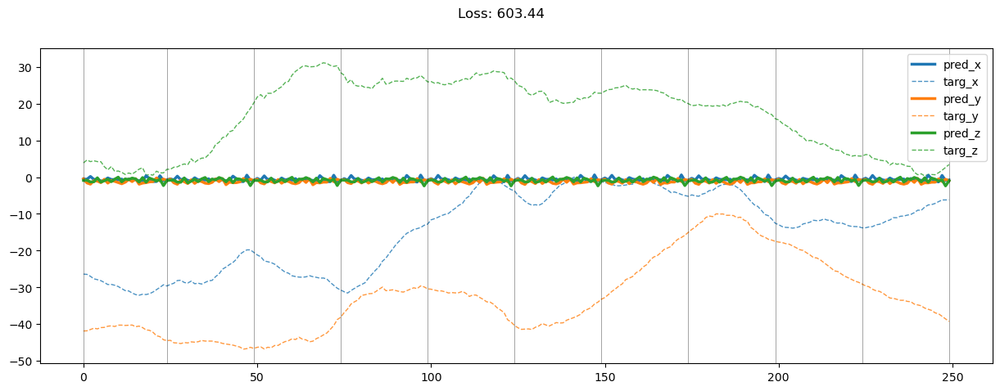

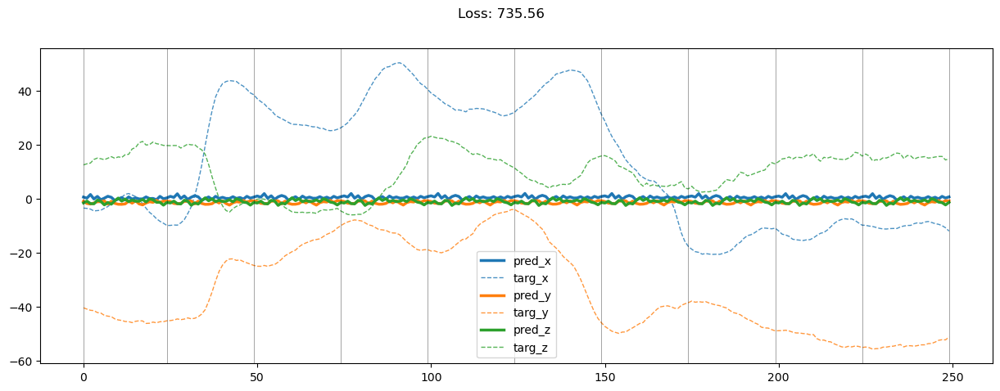

00000: train pred loss:  639.653, g loss:  640.249, d loss:  1.347
       valid pred loss:  667.330, g loss:  667.906, d loss:  1.298


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.14it/s]


00001: train pred loss:  624.169, g loss:  624.729, d loss:  1.265
       valid pred loss:  652.268, g loss:  652.802, d loss:  1.230


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.06it/s]


00002: train pred loss:  607.787, g loss:  608.302, d loss:  1.210
       valid pred loss:  640.580, g loss:  641.055, d loss:  1.206


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.11it/s]


00003: train pred loss:  599.267, g loss:  599.725, d loss:  1.196
       valid pred loss:  629.036, g loss:  629.445, d loss:  1.235


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.12it/s]


00004: train pred loss:  581.333, g loss:  581.726, d loss:  1.241
       valid pred loss:  614.952, g loss:  615.298, d loss:  1.311


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.08it/s]


00005: train pred loss:  571.216, g loss:  571.578, d loss:  1.261
       valid pred loss:  603.275, g loss:  603.598, d loss:  1.340


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.04it/s]


00006: train pred loss:  553.230, g loss:  553.626, d loss:  1.170
       valid pred loss:  585.288, g loss:  585.719, d loss:  1.086


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.07it/s]


00007: train pred loss:  538.852, g loss:  539.402, d loss:  0.910
       valid pred loss:  564.879, g loss:  565.565, d loss:  0.746


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.15it/s]


00008: train pred loss:  516.395, g loss:  517.110, d loss:  0.759
       valid pred loss:  546.395, g loss:  547.129, d loss:  0.811


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.15it/s]


00009: train pred loss:  498.375, g loss:  499.113, d loss:  0.931
       valid pred loss:  524.878, g loss:  525.620, d loss:  0.947


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.07it/s]


00010: train pred loss:  475.259, g loss:  475.987, d loss:  0.921
       valid pred loss:  505.121, g loss:  505.830, d loss:  0.756


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.14it/s]


00011: train pred loss:  454.627, g loss:  455.323, d loss:  0.743
       valid pred loss:  486.050, g loss:  486.735, d loss:  0.712


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.18it/s]


00012: train pred loss:  433.258, g loss:  433.872, d loss:  0.812
       valid pred loss:  467.972, g loss:  468.175, d loss:  1.790


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.22it/s]


00013: train pred loss:  410.846, g loss:  410.984, d loss:  2.400
       valid pred loss:  437.624, g loss:  437.713, d loss:  2.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.24it/s]


00014: train pred loss:  391.902, g loss:  392.219, d loss:  1.545
       valid pred loss:  422.403, g loss:  423.059, d loss:  0.742


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.14it/s]


00015: train pred loss:  371.683, g loss:  372.347, d loss:  0.813
       valid pred loss:  408.153, g loss:  408.823, d loss:  1.016


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.21it/s]


00016: train pred loss:  351.462, g loss:  352.130, d loss:  1.244
       valid pred loss:  387.008, g loss:  387.678, d loss:  1.336


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.19it/s]


00017: train pred loss:  331.143, g loss:  331.817, d loss:  1.379
       valid pred loss:  382.889, g loss:  383.567, d loss:  1.382


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.20it/s]


00018: train pred loss:  312.850, g loss:  313.527, d loss:  1.380
       valid pred loss:  359.687, g loss:  360.362, d loss:  1.377


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.11it/s]


00019: train pred loss:  296.900, g loss:  297.570, d loss:  1.377
       valid pred loss:  333.045, g loss:  333.705, d loss:  1.375


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.19it/s]


00020: train pred loss:  277.820, g loss:  278.471, d loss:  1.377
       valid pred loss:  357.343, g loss:  357.977, d loss:  1.377


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.19it/s]


00021: train pred loss:  266.803, g loss:  267.424, d loss:  1.383
       valid pred loss:  319.433, g loss:  320.037, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.17it/s]


00022: train pred loss:  251.634, g loss:  252.237, d loss:  1.396
       valid pred loss:  321.802, g loss:  322.405, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.18it/s]


00023: train pred loss:  239.026, g loss:  239.628, d loss:  1.396
       valid pred loss:  292.355, g loss:  292.957, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.10it/s]


00024: train pred loss:  227.837, g loss:  228.438, d loss:  1.396
       valid pred loss:  295.380, g loss:  295.981, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.16it/s]


00025: train pred loss:  220.033, g loss:  220.634, d loss:  1.396
       valid pred loss:  288.272, g loss:  288.872, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.16it/s]


00026: train pred loss:  203.165, g loss:  203.765, d loss:  1.396
       valid pred loss:  331.723, g loss:  332.322, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.10it/s]


00027: train pred loss:  192.019, g loss:  192.617, d loss:  1.396
       valid pred loss:  321.760, g loss:  322.358, d loss:  1.396


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.08it/s]


00028: train pred loss:  180.918, g loss:  181.515, d loss:  1.397
       valid pred loss:  272.825, g loss:  273.422, d loss:  1.397


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.11it/s]


00029: train pred loss:  166.842, g loss:  167.438, d loss:  1.397
       valid pred loss:  290.622, g loss:  291.217, d loss:  1.397


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.13it/s]


00030: train pred loss:  156.540, g loss:  157.135, d loss:  1.397
       valid pred loss:  244.453, g loss:  245.047, d loss:  1.397


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00031: train pred loss:  148.141, g loss:  148.734, d loss:  1.397
       valid pred loss:  248.303, g loss:  248.896, d loss:  1.398


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.15it/s]


00032: train pred loss:  139.579, g loss:  140.171, d loss:  1.398
       valid pred loss:  201.226, g loss:  201.817, d loss:  1.398


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00033: train pred loss:  130.151, g loss:  130.741, d loss:  1.398
       valid pred loss:  278.288, g loss:  278.877, d loss:  1.398


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.12it/s]


00034: train pred loss:  122.405, g loss:  122.994, d loss:  1.399
       valid pred loss:  202.202, g loss:  202.790, d loss:  1.399


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00035: train pred loss:  118.422, g loss:  119.009, d loss:  1.399
       valid pred loss:  214.015, g loss:  214.601, d loss:  1.399


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00036: train pred loss:  110.228, g loss:  110.813, d loss:  1.399
       valid pred loss:  201.664, g loss:  202.248, d loss:  1.400


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.06it/s]


00037: train pred loss:  102.694, g loss:  103.277, d loss:  1.400
       valid pred loss:  209.494, g loss:  210.076, d loss:  1.400


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.13it/s]


00038: train pred loss:  99.423, g loss:  100.004, d loss:  1.400
       valid pred loss:  249.807, g loss:  250.387, d loss:  1.401


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.12it/s]


00039: train pred loss:  96.424, g loss:  97.003, d loss:  1.401
       valid pred loss:  230.067, g loss:  230.643, d loss:  1.401


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.10it/s]


00040: train pred loss:  91.793, g loss:  92.364, d loss:  1.403
       valid pred loss:  227.320, g loss:  227.883, d loss:  1.405


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.10it/s]


00041: train pred loss:  87.355, g loss:  87.910, d loss:  1.408
       valid pred loss:  252.263, g loss:  252.805, d loss:  1.413


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.07it/s]


00042: train pred loss:  84.048, g loss:  84.581, d loss:  1.417
       valid pred loss:  250.573, g loss:  251.091, d loss:  1.424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00043: train pred loss:  80.952, g loss:  81.459, d loss:  1.429
       valid pred loss:  196.092, g loss:  196.583, d loss:  1.438


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.09it/s]


00044: train pred loss:  77.537, g loss:  78.018, d loss:  1.444
       valid pred loss:  213.309, g loss:  213.775, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.09it/s]


00045: train pred loss:  74.192, g loss:  74.648, d loss:  1.461
       valid pred loss:  161.713, g loss:  162.156, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.05it/s]


00046: train pred loss:  71.629, g loss:  72.062, d loss:  1.479
       valid pred loss:  205.764, g loss:  206.186, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.10it/s]


00047: train pred loss:  68.423, g loss:  68.837, d loss:  1.497
       valid pred loss:  172.932, g loss:  173.335, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.09it/s]


00048: train pred loss:  67.440, g loss:  67.835, d loss:  1.514
       valid pred loss:  196.688, g loss:  197.074, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.16it/s]


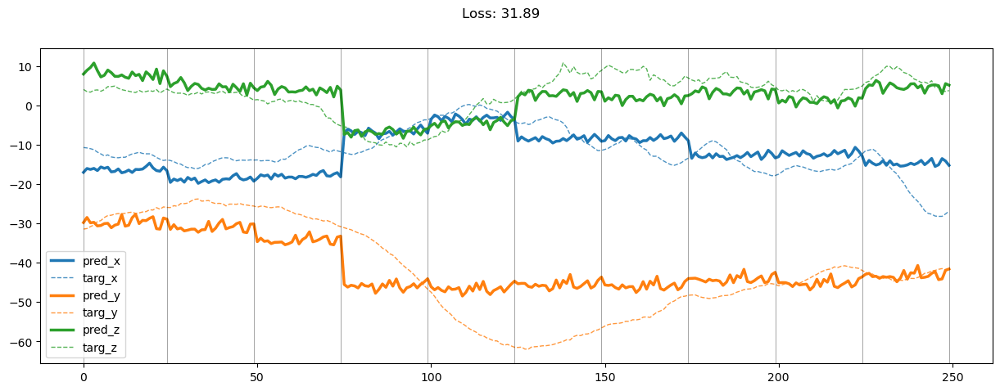

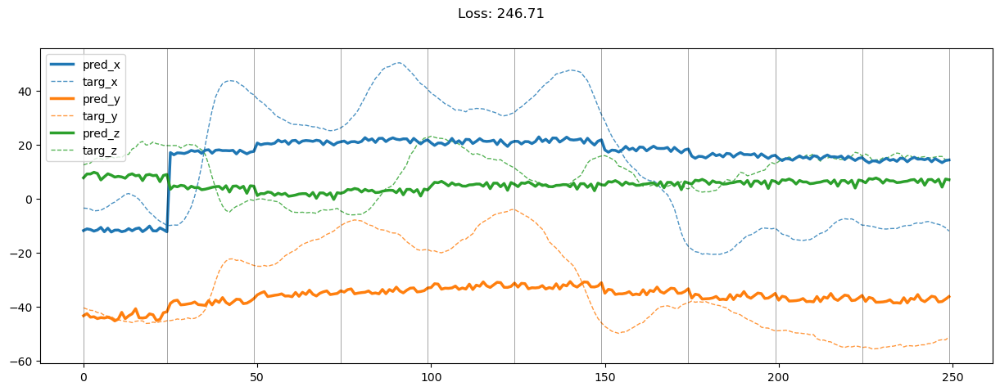

00049: train pred loss:  65.847, g loss:  66.226, d loss:  1.533
       valid pred loss:  175.811, g loss:  176.180, d loss:  1.544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00050: train pred loss:  64.326, g loss:  64.690, d loss:  1.552
       valid pred loss:  203.466, g loss:  203.822, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.08it/s]


00051: train pred loss:  62.155, g loss:  62.506, d loss:  1.568
       valid pred loss:  175.643, g loss:  175.989, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.09it/s]


00052: train pred loss:  60.556, g loss:  60.900, d loss:  1.579
       valid pred loss:  155.036, g loss:  155.377, d loss:  1.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.09it/s]


00053: train pred loss:  56.353, g loss:  56.693, d loss:  1.585
       valid pred loss:  140.325, g loss:  140.661, d loss:  1.590


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00054: train pred loss:  54.987, g loss:  55.321, d loss:  1.593
       valid pred loss:  169.017, g loss:  169.349, d loss:  1.597


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.06it/s]


00055: train pred loss:  53.703, g loss:  54.034, d loss:  1.598
       valid pred loss:  142.768, g loss:  143.097, d loss:  1.601


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.99it/s]


00056: train pred loss:  51.980, g loss:  52.308, d loss:  1.602
       valid pred loss:  161.168, g loss:  161.496, d loss:  1.604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.00it/s]


00057: train pred loss:  49.199, g loss:  49.526, d loss:  1.604
       valid pred loss:  147.657, g loss:  147.983, d loss:  1.604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00058: train pred loss:  48.363, g loss:  48.690, d loss:  1.604
       valid pred loss:  142.791, g loss:  143.118, d loss:  1.604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.00it/s]


00059: train pred loss:  45.998, g loss:  46.326, d loss:  1.603
       valid pred loss:  145.340, g loss:  145.669, d loss:  1.602


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00060: train pred loss:  45.029, g loss:  45.358, d loss:  1.600
       valid pred loss:  165.379, g loss:  165.709, d loss:  1.598


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00061: train pred loss:  44.303, g loss:  44.635, d loss:  1.597
       valid pred loss:  146.068, g loss:  146.402, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00062: train pred loss:  42.949, g loss:  43.284, d loss:  1.592
       valid pred loss:  167.303, g loss:  167.640, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.94it/s]


00063: train pred loss:  43.117, g loss:  43.456, d loss:  1.587
       valid pred loss:  152.330, g loss:  152.670, d loss:  1.584


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00064: train pred loss:  43.975, g loss:  44.317, d loss:  1.581
       valid pred loss:  140.404, g loss:  140.749, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00065: train pred loss:  42.473, g loss:  42.820, d loss:  1.574
       valid pred loss:  141.846, g loss:  142.195, d loss:  1.570


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.02it/s]


00066: train pred loss:  40.539, g loss:  40.890, d loss:  1.567
       valid pred loss:  128.946, g loss:  129.301, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.99it/s]


00067: train pred loss:  40.506, g loss:  40.864, d loss:  1.560
       valid pred loss:  147.477, g loss:  147.838, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.99it/s]


00068: train pred loss:  39.797, g loss:  40.160, d loss:  1.553
       valid pred loss:  134.569, g loss:  134.935, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00069: train pred loss:  39.098, g loss:  39.467, d loss:  1.545
       valid pred loss:  149.308, g loss:  149.680, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00070: train pred loss:  37.878, g loss:  38.253, d loss:  1.538
       valid pred loss:  134.233, g loss:  134.612, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.96it/s]


00071: train pred loss:  38.488, g loss:  38.870, d loss:  1.530
       valid pred loss:  135.188, g loss:  135.573, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00072: train pred loss:  38.902, g loss:  39.289, d loss:  1.523
       valid pred loss:  137.030, g loss:  137.421, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.96it/s]


00073: train pred loss:  37.937, g loss:  38.331, d loss:  1.516
       valid pred loss:  135.385, g loss:  135.782, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00074: train pred loss:  36.761, g loss:  37.161, d loss:  1.510
       valid pred loss:  140.015, g loss:  140.418, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.99it/s]


00075: train pred loss:  37.104, g loss:  37.509, d loss:  1.505
       valid pred loss:  140.080, g loss:  140.488, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.94it/s]


00076: train pred loss:  36.090, g loss:  36.501, d loss:  1.499
       valid pred loss:  153.818, g loss:  154.231, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00077: train pred loss:  36.143, g loss:  36.558, d loss:  1.495
       valid pred loss:  143.549, g loss:  143.967, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00078: train pred loss:  34.422, g loss:  34.842, d loss:  1.490
       valid pred loss:  142.026, g loss:  142.448, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.00it/s]


00079: train pred loss:  34.555, g loss:  34.979, d loss:  1.487
       valid pred loss:  141.082, g loss:  141.507, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00080: train pred loss:  33.544, g loss:  33.970, d loss:  1.485
       valid pred loss:  134.022, g loss:  134.447, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.94it/s]


00081: train pred loss:  34.527, g loss:  34.952, d loss:  1.486
       valid pred loss:  156.332, g loss:  156.755, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.98it/s]


00082: train pred loss:  33.778, g loss:  34.199, d loss:  1.489
       valid pred loss:  137.874, g loss:  138.292, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00083: train pred loss:  33.631, g loss:  34.046, d loss:  1.495
       valid pred loss:  138.412, g loss:  138.822, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.98it/s]


00084: train pred loss:  32.509, g loss:  32.916, d loss:  1.503
       valid pred loss:  141.706, g loss:  142.107, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.50it/s]


00085: train pred loss:  31.872, g loss:  32.269, d loss:  1.512
       valid pred loss:  144.291, g loss:  144.683, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.01it/s]


00086: train pred loss:  31.852, g loss:  32.240, d loss:  1.522
       valid pred loss:  137.356, g loss:  137.739, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 16.02it/s]


00087: train pred loss:  32.413, g loss:  32.794, d loss:  1.531
       valid pred loss:  123.133, g loss:  123.509, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.96it/s]


00088: train pred loss:  31.145, g loss:  31.520, d loss:  1.538
       valid pred loss:  129.204, g loss:  129.577, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00089: train pred loss:  30.704, g loss:  31.077, d loss:  1.540
       valid pred loss:  135.677, g loss:  136.051, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00090: train pred loss:  31.032, g loss:  31.408, d loss:  1.537
       valid pred loss:  130.719, g loss:  131.098, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.96it/s]


00091: train pred loss:  30.613, g loss:  30.996, d loss:  1.529
       valid pred loss:  125.553, g loss:  125.942, d loss:  1.522


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00092: train pred loss:  30.877, g loss:  31.271, d loss:  1.516
       valid pred loss:  125.338, g loss:  125.740, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.96it/s]


00093: train pred loss:  29.293, g loss:  29.702, d loss:  1.501
       valid pred loss:  144.194, g loss:  144.612, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00094: train pred loss:  29.833, g loss:  30.258, d loss:  1.486
       valid pred loss:  145.406, g loss:  145.841, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00095: train pred loss:  30.295, g loss:  30.737, d loss:  1.472
       valid pred loss:  121.454, g loss:  121.905, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00096: train pred loss:  29.721, g loss:  30.177, d loss:  1.461
       valid pred loss:  132.957, g loss:  133.419, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00097: train pred loss:  29.464, g loss:  29.929, d loss:  1.454
       valid pred loss:  141.023, g loss:  141.491, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.95it/s]


00098: train pred loss:  28.951, g loss:  29.419, d loss:  1.452
       valid pred loss:  118.574, g loss:  119.041, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


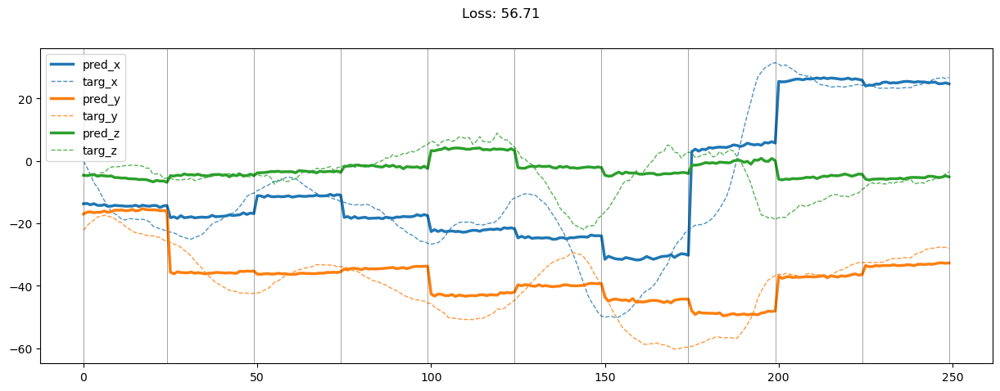

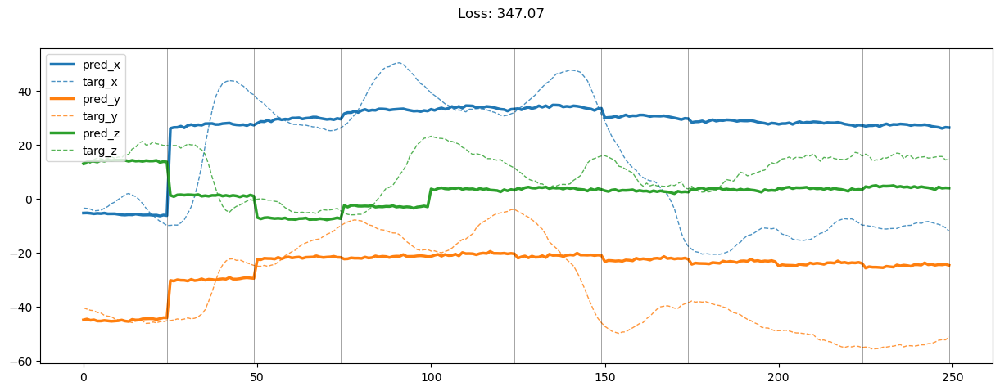

00099: train pred loss:  29.199, g loss:  29.665, d loss:  1.454
       valid pred loss:  119.672, g loss:  120.134, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00100: train pred loss:  28.714, g loss:  29.172, d loss:  1.459
       valid pred loss:  137.030, g loss:  137.483, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.97it/s]


00101: train pred loss:  28.135, g loss:  28.582, d loss:  1.467
       valid pred loss:  120.156, g loss:  120.594, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00102: train pred loss:  27.838, g loss:  28.270, d loss:  1.480
       valid pred loss:  141.279, g loss:  141.701, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00103: train pred loss:  28.380, g loss:  28.794, d loss:  1.495
       valid pred loss:  119.289, g loss:  119.694, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00104: train pred loss:  28.106, g loss:  28.504, d loss:  1.512
       valid pred loss:  122.186, g loss:  122.574, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00105: train pred loss:  27.938, g loss:  28.320, d loss:  1.530
       valid pred loss:  124.244, g loss:  124.616, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00106: train pred loss:  28.394, g loss:  28.760, d loss:  1.548
       valid pred loss:  121.333, g loss:  121.692, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00107: train pred loss:  28.502, g loss:  28.856, d loss:  1.565
       valid pred loss:  119.226, g loss:  119.572, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00108: train pred loss:  29.028, g loss:  29.370, d loss:  1.580
       valid pred loss:  134.595, g loss:  134.932, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.00it/s]


00109: train pred loss:  28.142, g loss:  28.476, d loss:  1.593
       valid pred loss:  116.138, g loss:  116.468, d loss:  1.599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00110: train pred loss:  26.737, g loss:  27.065, d loss:  1.602
       valid pred loss:  131.739, g loss:  132.065, d loss:  1.607


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00111: train pred loss:  27.046, g loss:  27.371, d loss:  1.607
       valid pred loss:  117.241, g loss:  117.565, d loss:  1.609


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00112: train pred loss:  26.326, g loss:  26.651, d loss:  1.607
       valid pred loss:  122.997, g loss:  123.323, d loss:  1.606


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00113: train pred loss:  26.511, g loss:  26.839, d loss:  1.602
       valid pred loss:  133.211, g loss:  133.542, d loss:  1.598


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00114: train pred loss:  26.774, g loss:  27.108, d loss:  1.593
       valid pred loss:  117.915, g loss:  118.255, d loss:  1.586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00115: train pred loss:  25.797, g loss:  26.140, d loss:  1.580
       valid pred loss:  116.929, g loss:  117.278, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00116: train pred loss:  24.944, g loss:  25.298, d loss:  1.564
       valid pred loss:  126.822, g loss:  127.184, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00117: train pred loss:  25.600, g loss:  25.968, d loss:  1.546
       valid pred loss:  122.392, g loss:  122.769, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00118: train pred loss:  24.951, g loss:  25.334, d loss:  1.529
       valid pred loss:  127.366, g loss:  127.758, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00119: train pred loss:  25.108, g loss:  25.506, d loss:  1.511
       valid pred loss:  145.831, g loss:  146.239, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00120: train pred loss:  24.560, g loss:  24.975, d loss:  1.495
       valid pred loss:  120.577, g loss:  121.001, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00121: train pred loss:  24.616, g loss:  25.048, d loss:  1.480
       valid pred loss:  135.053, g loss:  135.494, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00122: train pred loss:  24.563, g loss:  25.011, d loss:  1.467
       valid pred loss:  122.244, g loss:  122.701, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00123: train pred loss:  23.714, g loss:  24.177, d loss:  1.455
       valid pred loss:  127.792, g loss:  128.264, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


00124: train pred loss:  24.120, g loss:  24.598, d loss:  1.446
       valid pred loss:  127.843, g loss:  128.326, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00125: train pred loss:  24.452, g loss:  24.937, d loss:  1.441
       valid pred loss:  134.768, g loss:  135.256, d loss:  1.440


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


00126: train pred loss:  24.044, g loss:  24.534, d loss:  1.438
       valid pred loss:  131.683, g loss:  132.176, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00127: train pred loss:  23.757, g loss:  24.251, d loss:  1.436
       valid pred loss:  121.764, g loss:  122.261, d loss:  1.435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.10it/s]


00128: train pred loss:  23.246, g loss:  23.743, d loss:  1.434
       valid pred loss:  130.170, g loss:  130.669, d loss:  1.434


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.72it/s]


00129: train pred loss:  23.334, g loss:  23.833, d loss:  1.433
       valid pred loss:  131.644, g loss:  132.143, d loss:  1.433


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00130: train pred loss:  23.919, g loss:  24.418, d loss:  1.433
       valid pred loss:  129.428, g loss:  129.927, d loss:  1.433


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00131: train pred loss:  23.686, g loss:  24.184, d loss:  1.434
       valid pred loss:  129.259, g loss:  129.757, d loss:  1.434


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00132: train pred loss:  23.400, g loss:  23.896, d loss:  1.435
       valid pred loss:  127.731, g loss:  128.225, d loss:  1.436


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00133: train pred loss:  23.129, g loss:  23.621, d loss:  1.437
       valid pred loss:  129.294, g loss:  129.784, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00134: train pred loss:  22.808, g loss:  23.296, d loss:  1.440
       valid pred loss:  124.307, g loss:  124.791, d loss:  1.442


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00135: train pred loss:  23.571, g loss:  24.053, d loss:  1.444
       valid pred loss:  129.133, g loss:  129.610, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00136: train pred loss:  23.132, g loss:  23.607, d loss:  1.448
       valid pred loss:  152.115, g loss:  152.586, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


00137: train pred loss:  22.989, g loss:  23.456, d loss:  1.453
       valid pred loss:  110.786, g loss:  111.248, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00138: train pred loss:  23.298, g loss:  23.757, d loss:  1.458
       valid pred loss:  129.905, g loss:  130.359, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00139: train pred loss:  23.318, g loss:  23.769, d loss:  1.464
       valid pred loss:  130.386, g loss:  130.832, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00140: train pred loss:  22.686, g loss:  23.129, d loss:  1.471
       valid pred loss:  122.537, g loss:  122.975, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00141: train pred loss:  22.619, g loss:  23.054, d loss:  1.478
       valid pred loss:  121.900, g loss:  122.329, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00142: train pred loss:  22.587, g loss:  23.013, d loss:  1.485
       valid pred loss:  133.605, g loss:  134.026, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00143: train pred loss:  22.670, g loss:  23.088, d loss:  1.492
       valid pred loss:  141.471, g loss:  141.884, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00144: train pred loss:  21.832, g loss:  22.242, d loss:  1.500
       valid pred loss:  133.029, g loss:  133.434, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00145: train pred loss:  21.775, g loss:  22.177, d loss:  1.507
       valid pred loss:  130.791, g loss:  131.189, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00146: train pred loss:  21.390, g loss:  21.785, d loss:  1.515
       valid pred loss:  124.943, g loss:  125.334, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00147: train pred loss:  21.143, g loss:  21.531, d loss:  1.523
       valid pred loss:  133.197, g loss:  133.581, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00148: train pred loss:  21.518, g loss:  21.899, d loss:  1.530
       valid pred loss:  127.778, g loss:  128.156, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


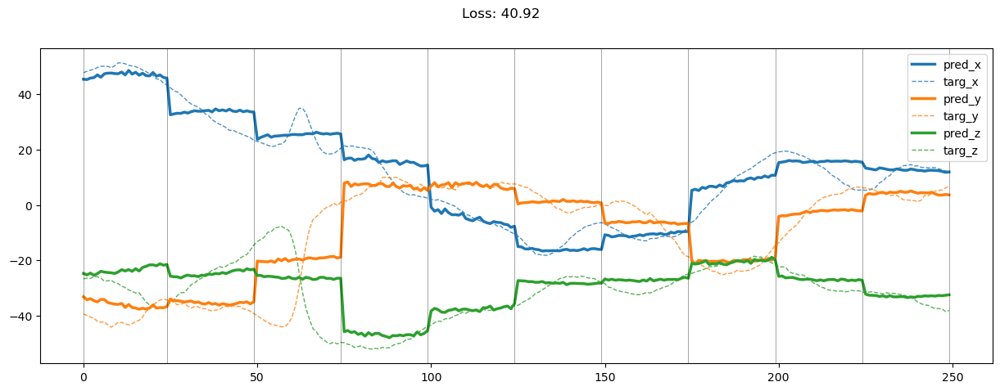

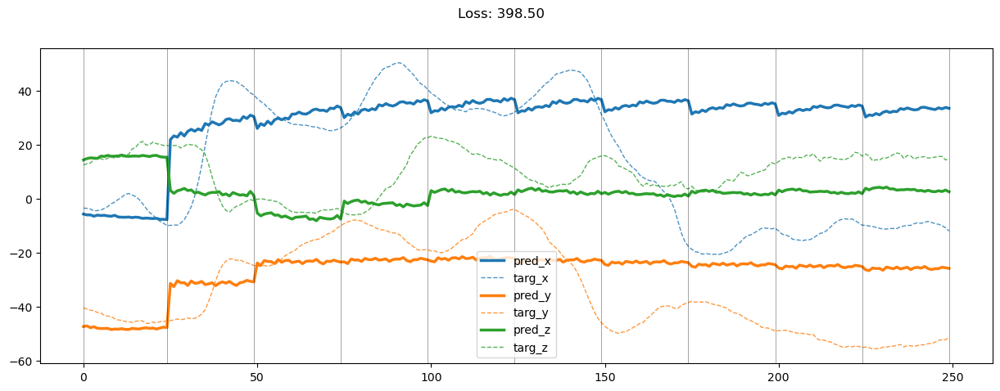

00149: train pred loss:  20.748, g loss:  21.123, d loss:  1.538
       valid pred loss:  119.026, g loss:  119.397, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00150: train pred loss:  20.668, g loss:  21.037, d loss:  1.545
       valid pred loss:  137.872, g loss:  138.238, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


00151: train pred loss:  20.879, g loss:  21.243, d loss:  1.552
       valid pred loss:  123.116, g loss:  123.476, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00152: train pred loss:  20.962, g loss:  21.320, d loss:  1.559
       valid pred loss:  125.190, g loss:  125.545, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00153: train pred loss:  21.152, g loss:  21.505, d loss:  1.566
       valid pred loss:  133.383, g loss:  133.734, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.31it/s]


00154: train pred loss:  21.157, g loss:  21.506, d loss:  1.572
       valid pred loss:  131.613, g loss:  131.960, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00155: train pred loss:  20.852, g loss:  21.197, d loss:  1.577
       valid pred loss:  126.385, g loss:  126.728, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00156: train pred loss:  20.501, g loss:  20.843, d loss:  1.582
       valid pred loss:  136.533, g loss:  136.872, d loss:  1.585


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.31it/s]


00157: train pred loss:  20.359, g loss:  20.698, d loss:  1.587
       valid pred loss:  118.923, g loss:  119.260, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.42it/s]


00158: train pred loss:  20.764, g loss:  21.100, d loss:  1.591
       valid pred loss:  127.632, g loss:  127.966, d loss:  1.593


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


00159: train pred loss:  20.562, g loss:  20.896, d loss:  1.594
       valid pred loss:  132.983, g loss:  133.316, d loss:  1.595


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.61it/s]


00160: train pred loss:  20.857, g loss:  21.189, d loss:  1.596
       valid pred loss:  140.305, g loss:  140.637, d loss:  1.597


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00161: train pred loss:  21.388, g loss:  21.719, d loss:  1.598
       valid pred loss:  137.828, g loss:  138.158, d loss:  1.599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


00162: train pred loss:  20.637, g loss:  20.968, d loss:  1.599
       valid pred loss:  128.086, g loss:  128.416, d loss:  1.599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00163: train pred loss:  20.207, g loss:  20.538, d loss:  1.599
       valid pred loss:  124.711, g loss:  125.041, d loss:  1.599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.46it/s]


00164: train pred loss:  20.723, g loss:  21.054, d loss:  1.598
       valid pred loss:  137.177, g loss:  137.508, d loss:  1.598


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


00165: train pred loss:  19.984, g loss:  20.315, d loss:  1.597
       valid pred loss:  130.137, g loss:  130.469, d loss:  1.596


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


00166: train pred loss:  20.073, g loss:  20.406, d loss:  1.595
       valid pred loss:  124.683, g loss:  125.017, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


00167: train pred loss:  19.944, g loss:  20.278, d loss:  1.593
       valid pred loss:  129.831, g loss:  130.167, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


00168: train pred loss:  19.284, g loss:  19.621, d loss:  1.589
       valid pred loss:  128.046, g loss:  128.384, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.27it/s]


00169: train pred loss:  19.148, g loss:  19.487, d loss:  1.585
       valid pred loss:  126.887, g loss:  127.228, d loss:  1.583


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.23it/s]


00170: train pred loss:  19.460, g loss:  19.803, d loss:  1.581
       valid pred loss:  133.845, g loss:  134.190, d loss:  1.578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.90it/s]


00171: train pred loss:  19.341, g loss:  19.687, d loss:  1.576
       valid pred loss:  118.941, g loss:  119.289, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


00172: train pred loss:  19.420, g loss:  19.770, d loss:  1.571
       valid pred loss:  118.556, g loss:  118.908, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


00173: train pred loss:  18.921, g loss:  19.275, d loss:  1.565
       valid pred loss:  119.064, g loss:  119.420, d loss:  1.561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.21it/s]


00174: train pred loss:  19.060, g loss:  19.419, d loss:  1.559
       valid pred loss:  120.625, g loss:  120.986, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.30it/s]


00175: train pred loss:  18.915, g loss:  19.278, d loss:  1.553
       valid pred loss:  117.081, g loss:  117.447, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.21it/s]


00176: train pred loss:  19.408, g loss:  19.776, d loss:  1.546
       valid pred loss:  120.778, g loss:  121.149, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.22it/s]


00177: train pred loss:  19.473, g loss:  19.846, d loss:  1.540
       valid pred loss:  128.145, g loss:  128.521, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.17it/s]


00178: train pred loss:  19.261, g loss:  19.640, d loss:  1.534
       valid pred loss:  124.236, g loss:  124.618, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.99it/s]


00179: train pred loss:  19.095, g loss:  19.479, d loss:  1.527
       valid pred loss:  123.216, g loss:  123.603, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.97it/s]


00180: train pred loss:  18.180, g loss:  18.569, d loss:  1.521
       valid pred loss:  120.029, g loss:  120.422, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.17it/s]


00181: train pred loss:  18.381, g loss:  18.776, d loss:  1.515
       valid pred loss:  118.552, g loss:  118.951, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.14it/s]


00182: train pred loss:  17.741, g loss:  18.142, d loss:  1.509
       valid pred loss:  125.444, g loss:  125.848, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.19it/s]


00183: train pred loss:  18.372, g loss:  18.778, d loss:  1.503
       valid pred loss:  119.196, g loss:  119.606, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.15it/s]


00184: train pred loss:  17.940, g loss:  18.352, d loss:  1.498
       valid pred loss:  119.988, g loss:  120.403, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.01it/s]


00185: train pred loss:  17.316, g loss:  17.734, d loss:  1.492
       valid pred loss:  123.790, g loss:  124.211, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.87it/s]


00186: train pred loss:  17.290, g loss:  17.713, d loss:  1.487
       valid pred loss:  126.356, g loss:  126.782, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


00187: train pred loss:  17.346, g loss:  17.774, d loss:  1.482
       valid pred loss:  125.694, g loss:  126.126, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


00188: train pred loss:  16.746, g loss:  17.180, d loss:  1.478
       valid pred loss:  127.077, g loss:  127.515, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


00189: train pred loss:  16.845, g loss:  17.284, d loss:  1.474
       valid pred loss:  126.395, g loss:  126.837, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00190: train pred loss:  16.573, g loss:  17.017, d loss:  1.470
       valid pred loss:  121.432, g loss:  121.879, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


00191: train pred loss:  16.481, g loss:  16.930, d loss:  1.466
       valid pred loss:  121.739, g loss:  122.191, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00192: train pred loss:  16.412, g loss:  16.865, d loss:  1.462
       valid pred loss:  121.094, g loss:  121.551, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.47it/s]


00193: train pred loss:  16.382, g loss:  16.840, d loss:  1.459
       valid pred loss:  121.411, g loss:  121.872, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.34it/s]


00194: train pred loss:  16.141, g loss:  16.603, d loss:  1.456
       valid pred loss:  134.011, g loss:  134.476, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.18it/s]


00195: train pred loss:  16.527, g loss:  16.993, d loss:  1.453
       valid pred loss:  123.063, g loss:  123.532, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.87it/s]


00196: train pred loss:  16.084, g loss:  16.554, d loss:  1.451
       valid pred loss:  118.298, g loss:  118.770, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.29it/s]


00197: train pred loss:  15.684, g loss:  16.158, d loss:  1.449
       valid pred loss:  116.638, g loss:  117.113, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.04it/s]


00198: train pred loss:  15.737, g loss:  16.213, d loss:  1.447
       valid pred loss:  124.878, g loss:  125.356, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


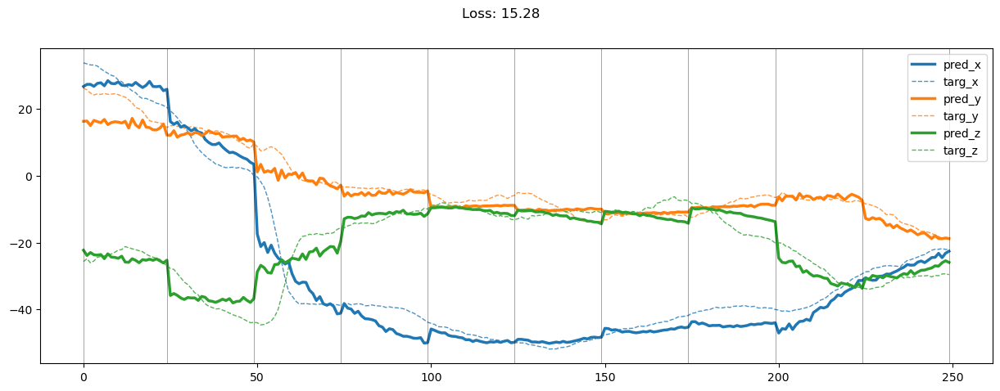

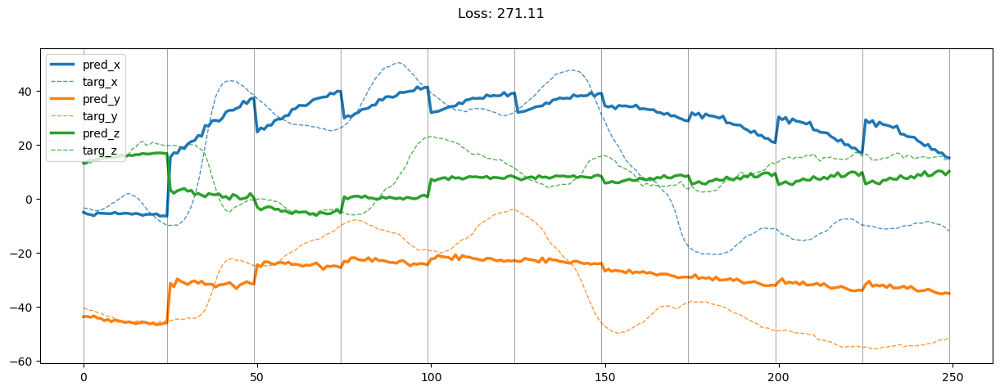

00199: train pred loss:  15.751, g loss:  16.230, d loss:  1.445
       valid pred loss:  122.859, g loss:  123.339, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


00200: train pred loss:  15.620, g loss:  16.101, d loss:  1.443
       valid pred loss:  125.890, g loss:  126.373, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


00201: train pred loss:  16.025, g loss:  16.508, d loss:  1.442
       valid pred loss:  124.971, g loss:  125.455, d loss:  1.442


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00202: train pred loss:  15.962, g loss:  16.447, d loss:  1.441
       valid pred loss:  116.494, g loss:  116.981, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


00203: train pred loss:  15.526, g loss:  16.013, d loss:  1.440
       valid pred loss:  116.176, g loss:  116.663, d loss:  1.440


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.88it/s]


00204: train pred loss:  15.391, g loss:  15.878, d loss:  1.440
       valid pred loss:  117.707, g loss:  118.195, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00205: train pred loss:  15.213, g loss:  15.701, d loss:  1.439
       valid pred loss:  120.546, g loss:  121.034, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.44it/s]


00206: train pred loss:  14.921, g loss:  15.409, d loss:  1.439
       valid pred loss:  113.923, g loss:  114.412, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


00207: train pred loss:  14.920, g loss:  15.409, d loss:  1.439
       valid pred loss:  119.825, g loss:  120.313, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00208: train pred loss:  14.709, g loss:  15.196, d loss:  1.440
       valid pred loss:  119.582, g loss:  120.069, d loss:  1.440


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00209: train pred loss:  14.805, g loss:  15.292, d loss:  1.440
       valid pred loss:  119.028, g loss:  119.514, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.48it/s]


00210: train pred loss:  14.807, g loss:  15.292, d loss:  1.441
       valid pred loss:  115.422, g loss:  115.906, d loss:  1.442


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00211: train pred loss:  14.569, g loss:  15.053, d loss:  1.442
       valid pred loss:  117.170, g loss:  117.652, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00212: train pred loss:  14.762, g loss:  15.244, d loss:  1.443
       valid pred loss:  122.032, g loss:  122.512, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00213: train pred loss:  14.380, g loss:  14.859, d loss:  1.445
       valid pred loss:  123.286, g loss:  123.763, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00214: train pred loss:  14.584, g loss:  15.060, d loss:  1.447
       valid pred loss:  124.909, g loss:  125.383, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00215: train pred loss:  14.371, g loss:  14.844, d loss:  1.449
       valid pred loss:  109.783, g loss:  110.254, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00216: train pred loss:  14.157, g loss:  14.626, d loss:  1.451
       valid pred loss:  123.626, g loss:  124.093, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00217: train pred loss:  14.074, g loss:  14.540, d loss:  1.454
       valid pred loss:  121.216, g loss:  121.679, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.93it/s]


00218: train pred loss:  13.799, g loss:  14.261, d loss:  1.456
       valid pred loss:  119.589, g loss:  120.049, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00219: train pred loss:  13.889, g loss:  14.347, d loss:  1.459
       valid pred loss:  118.816, g loss:  119.271, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00220: train pred loss:  13.515, g loss:  13.968, d loss:  1.462
       valid pred loss:  114.567, g loss:  115.017, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00221: train pred loss:  13.795, g loss:  14.244, d loss:  1.466
       valid pred loss:  126.999, g loss:  127.445, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00222: train pred loss:  13.511, g loss:  13.955, d loss:  1.469
       valid pred loss:  126.613, g loss:  127.054, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00223: train pred loss:  13.338, g loss:  13.777, d loss:  1.473
       valid pred loss:  105.910, g loss:  106.347, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00224: train pred loss:  13.518, g loss:  13.952, d loss:  1.478
       valid pred loss:  121.948, g loss:  122.379, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00225: train pred loss:  13.243, g loss:  13.672, d loss:  1.482
       valid pred loss:  115.045, g loss:  115.472, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00226: train pred loss:  13.141, g loss:  13.566, d loss:  1.486
       valid pred loss:  119.919, g loss:  120.341, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


00227: train pred loss:  13.118, g loss:  13.538, d loss:  1.490
       valid pred loss:  137.725, g loss:  138.142, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00228: train pred loss:  13.107, g loss:  13.522, d loss:  1.494
       valid pred loss:  117.141, g loss:  117.554, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00229: train pred loss:  12.574, g loss:  12.985, d loss:  1.499
       valid pred loss:  128.327, g loss:  128.735, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00230: train pred loss:  12.746, g loss:  13.153, d loss:  1.503
       valid pred loss:  118.872, g loss:  119.276, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00231: train pred loss:  12.685, g loss:  13.087, d loss:  1.508
       valid pred loss:  109.010, g loss:  109.410, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00232: train pred loss:  12.351, g loss:  12.749, d loss:  1.512
       valid pred loss:  128.434, g loss:  128.829, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00233: train pred loss:  12.184, g loss:  12.578, d loss:  1.517
       valid pred loss:  127.205, g loss:  127.596, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


00234: train pred loss:  11.911, g loss:  12.300, d loss:  1.521
       valid pred loss:  123.897, g loss:  124.284, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00235: train pred loss:  11.971, g loss:  12.356, d loss:  1.526
       valid pred loss:  123.987, g loss:  124.370, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00236: train pred loss:  11.990, g loss:  12.372, d loss:  1.530
       valid pred loss:  121.161, g loss:  121.540, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00237: train pred loss:  11.998, g loss:  12.375, d loss:  1.534
       valid pred loss:  124.711, g loss:  125.087, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00238: train pred loss:  12.126, g loss:  12.500, d loss:  1.539
       valid pred loss:  128.731, g loss:  129.103, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00239: train pred loss:  11.914, g loss:  12.285, d loss:  1.543
       valid pred loss:  106.155, g loss:  106.523, d loss:  1.546


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00240: train pred loss:  11.539, g loss:  11.906, d loss:  1.547
       valid pred loss:  108.636, g loss:  109.002, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00241: train pred loss:  11.534, g loss:  11.898, d loss:  1.551
       valid pred loss:  114.447, g loss:  114.809, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.48it/s]


00242: train pred loss:  11.352, g loss:  11.713, d loss:  1.555
       valid pred loss:  121.147, g loss:  121.506, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00243: train pred loss:  11.362, g loss:  11.720, d loss:  1.559
       valid pred loss:  121.488, g loss:  121.845, d loss:  1.561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00244: train pred loss:  11.066, g loss:  11.422, d loss:  1.563
       valid pred loss:  117.987, g loss:  118.341, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00245: train pred loss:  11.085, g loss:  11.438, d loss:  1.566
       valid pred loss:  114.262, g loss:  114.613, d loss:  1.568


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00246: train pred loss:  10.924, g loss:  11.274, d loss:  1.569
       valid pred loss:  113.656, g loss:  114.005, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00247: train pred loss:  10.841, g loss:  11.189, d loss:  1.573
       valid pred loss:  111.863, g loss:  112.210, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00248: train pred loss:  10.791, g loss:  11.137, d loss:  1.575
       valid pred loss:  117.324, g loss:  117.669, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


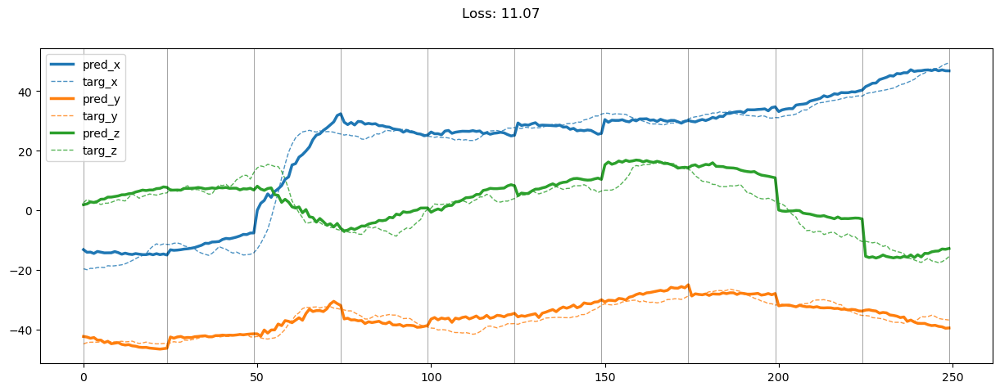

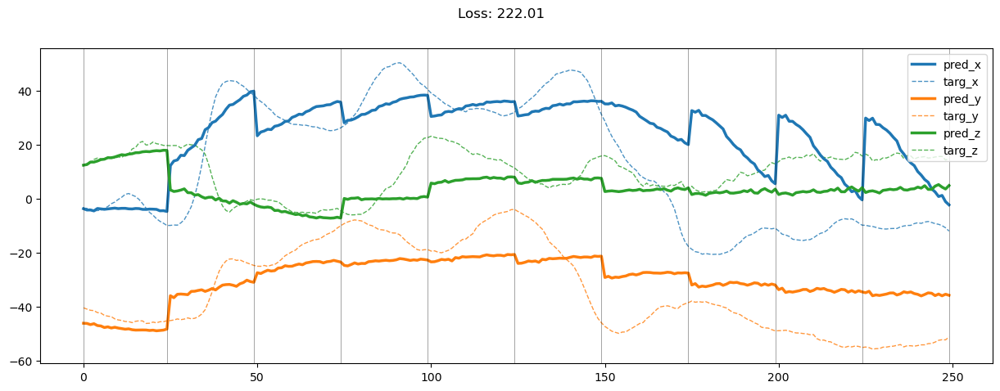

00249: train pred loss:  11.158, g loss:  11.502, d loss:  1.578
       valid pred loss:  113.539, g loss:  113.882, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.95it/s]


00250: train pred loss:  10.980, g loss:  11.323, d loss:  1.581
       valid pred loss:  121.694, g loss:  122.036, d loss:  1.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.69it/s]


00251: train pred loss:  10.647, g loss:  10.988, d loss:  1.583
       valid pred loss:  123.368, g loss:  123.709, d loss:  1.584


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00252: train pred loss:  10.649, g loss:  10.989, d loss:  1.585
       valid pred loss:  112.081, g loss:  112.420, d loss:  1.586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00253: train pred loss:  10.797, g loss:  11.136, d loss:  1.586
       valid pred loss:  108.107, g loss:  108.446, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00254: train pred loss:  10.706, g loss:  11.044, d loss:  1.588
       valid pred loss:  113.025, g loss:  113.362, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00255: train pred loss:  10.558, g loss:  10.895, d loss:  1.589
       valid pred loss:  112.175, g loss:  112.512, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00256: train pred loss:  10.385, g loss:  10.721, d loss:  1.590
       valid pred loss:  121.707, g loss:  122.044, d loss:  1.590


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.06it/s]


00257: train pred loss:  10.277, g loss:  10.613, d loss:  1.590
       valid pred loss:  124.523, g loss:  124.859, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00258: train pred loss:  10.229, g loss:  10.565, d loss:  1.591
       valid pred loss:  110.643, g loss:  110.978, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00259: train pred loss:  10.182, g loss:  10.518, d loss:  1.591
       valid pred loss:  121.477, g loss:  121.813, d loss:  1.590


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00260: train pred loss:  10.218, g loss:  10.554, d loss:  1.590
       valid pred loss:  118.736, g loss:  119.072, d loss:  1.590


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00261: train pred loss:  10.683, g loss:  11.020, d loss:  1.590
       valid pred loss:  134.571, g loss:  134.907, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00262: train pred loss:  10.106, g loss:  10.443, d loss:  1.589
       valid pred loss:  147.205, g loss:  147.542, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00263: train pred loss:  10.239, g loss:  10.577, d loss:  1.588
       valid pred loss:  125.967, g loss:  126.305, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00264: train pred loss:  10.123, g loss:  10.461, d loss:  1.587
       valid pred loss:  117.941, g loss:  118.280, d loss:  1.586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00265: train pred loss:  9.962, g loss:  10.302, d loss:  1.585
       valid pred loss:  127.785, g loss:  128.125, d loss:  1.584


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00266: train pred loss:  9.776, g loss:  10.116, d loss:  1.583
       valid pred loss:  119.904, g loss:  120.246, d loss:  1.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00267: train pred loss:  9.850, g loss:  10.193, d loss:  1.581
       valid pred loss:  115.540, g loss:  115.883, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00268: train pred loss:  9.597, g loss:  9.941, d loss:  1.579
       valid pred loss:  112.664, g loss:  113.009, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00269: train pred loss:  9.824, g loss:  10.170, d loss:  1.576
       valid pred loss:  111.763, g loss:  112.110, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00270: train pred loss:  9.337, g loss:  9.685, d loss:  1.573
       valid pred loss:  113.333, g loss:  113.682, d loss:  1.572


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00271: train pred loss:  9.239, g loss:  9.588, d loss:  1.570
       valid pred loss:  118.948, g loss:  119.299, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00272: train pred loss:  9.445, g loss:  9.797, d loss:  1.567
       valid pred loss:  118.374, g loss:  118.727, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00273: train pred loss:  9.538, g loss:  9.892, d loss:  1.564
       valid pred loss:  111.511, g loss:  111.866, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00274: train pred loss:  9.551, g loss:  9.908, d loss:  1.561
       valid pred loss:  121.814, g loss:  122.173, d loss:  1.559


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00275: train pred loss:  9.580, g loss:  9.939, d loss:  1.557
       valid pred loss:  116.948, g loss:  117.309, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00276: train pred loss:  9.687, g loss:  10.050, d loss:  1.554
       valid pred loss:  117.313, g loss:  117.677, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00277: train pred loss:  9.226, g loss:  9.591, d loss:  1.550
       valid pred loss:  128.281, g loss:  128.648, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00278: train pred loss:  9.289, g loss:  9.657, d loss:  1.546
       valid pred loss:  112.342, g loss:  112.712, d loss:  1.544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00279: train pred loss:  9.418, g loss:  9.789, d loss:  1.542
       valid pred loss:  119.118, g loss:  119.491, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00280: train pred loss:  9.395, g loss:  9.769, d loss:  1.538
       valid pred loss:  119.065, g loss:  119.441, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00281: train pred loss:  9.052, g loss:  9.430, d loss:  1.535
       valid pred loss:  112.323, g loss:  112.703, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00282: train pred loss:  9.141, g loss:  9.522, d loss:  1.531
       valid pred loss:  119.409, g loss:  119.792, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00283: train pred loss:  9.306, g loss:  9.690, d loss:  1.527
       valid pred loss:  125.539, g loss:  125.926, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00284: train pred loss:  8.999, g loss:  9.387, d loss:  1.523
       valid pred loss:  110.957, g loss:  111.346, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00285: train pred loss:  9.090, g loss:  9.481, d loss:  1.519
       valid pred loss:  124.682, g loss:  125.075, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00286: train pred loss:  8.668, g loss:  9.063, d loss:  1.515
       valid pred loss:  117.728, g loss:  118.125, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.48it/s]


00287: train pred loss:  8.863, g loss:  9.261, d loss:  1.512
       valid pred loss:  121.819, g loss:  122.219, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00288: train pred loss:  8.724, g loss:  9.126, d loss:  1.508
       valid pred loss:  121.052, g loss:  121.456, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00289: train pred loss:  8.706, g loss:  9.111, d loss:  1.504
       valid pred loss:  118.455, g loss:  118.862, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00290: train pred loss:  8.796, g loss:  9.205, d loss:  1.501
       valid pred loss:  116.437, g loss:  116.848, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00291: train pred loss:  8.883, g loss:  9.296, d loss:  1.497
       valid pred loss:  116.638, g loss:  117.052, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00292: train pred loss:  8.623, g loss:  9.039, d loss:  1.494
       valid pred loss:  112.904, g loss:  113.322, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00293: train pred loss:  8.503, g loss:  8.922, d loss:  1.491
       valid pred loss:  116.273, g loss:  116.695, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00294: train pred loss:  8.582, g loss:  9.005, d loss:  1.488
       valid pred loss:  115.519, g loss:  115.944, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.04it/s]


00295: train pred loss:  8.583, g loss:  9.009, d loss:  1.485
       valid pred loss:  121.102, g loss:  121.531, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.89it/s]


00296: train pred loss:  8.668, g loss:  9.098, d loss:  1.482
       valid pred loss:  116.367, g loss:  116.798, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.40it/s]


00297: train pred loss:  8.572, g loss:  9.004, d loss:  1.479
       valid pred loss:  115.972, g loss:  116.406, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.21it/s]


00298: train pred loss:  8.133, g loss:  8.569, d loss:  1.476
       valid pred loss:  122.144, g loss:  122.582, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


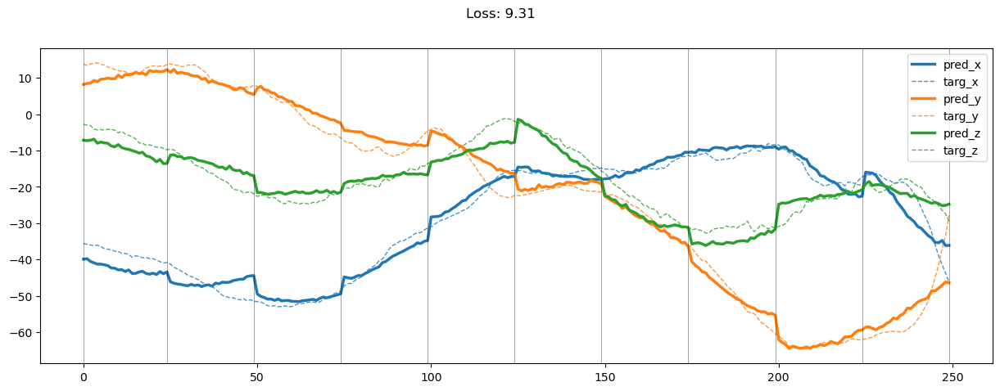

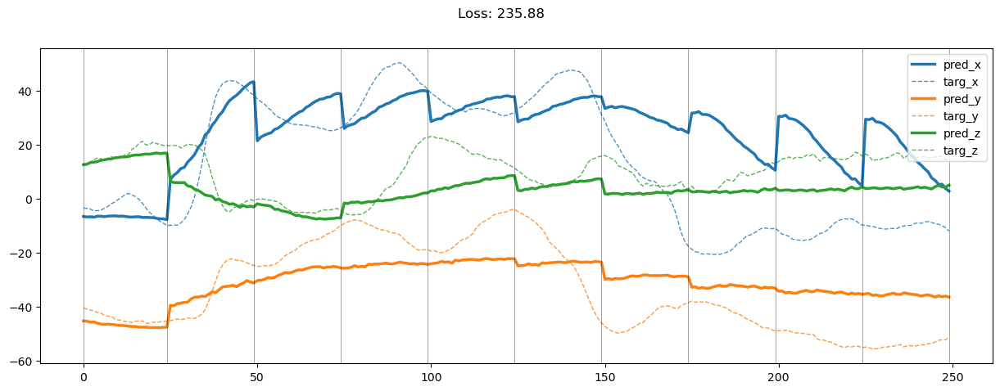

00299: train pred loss:  8.387, g loss:  8.826, d loss:  1.474
       valid pred loss:  119.555, g loss:  119.996, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00300: train pred loss:  8.321, g loss:  8.763, d loss:  1.471
       valid pred loss:  122.806, g loss:  123.250, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00301: train pred loss:  8.434, g loss:  8.879, d loss:  1.469
       valid pred loss:  123.795, g loss:  124.242, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00302: train pred loss:  8.310, g loss:  8.759, d loss:  1.466
       valid pred loss:  124.658, g loss:  125.108, d loss:  1.465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00303: train pred loss:  8.308, g loss:  8.759, d loss:  1.464
       valid pred loss:  121.519, g loss:  121.972, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00304: train pred loss:  8.265, g loss:  8.719, d loss:  1.462
       valid pred loss:  119.372, g loss:  119.828, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.30it/s]


00305: train pred loss:  8.374, g loss:  8.831, d loss:  1.460
       valid pred loss:  126.726, g loss:  127.184, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.07it/s]


00306: train pred loss:  8.360, g loss:  8.819, d loss:  1.458
       valid pred loss:  123.813, g loss:  124.274, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


00307: train pred loss:  8.263, g loss:  8.725, d loss:  1.457
       valid pred loss:  120.815, g loss:  121.278, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00308: train pred loss:  8.094, g loss:  8.557, d loss:  1.455
       valid pred loss:  118.870, g loss:  119.335, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00309: train pred loss:  8.386, g loss:  8.853, d loss:  1.454
       valid pred loss:  115.052, g loss:  115.519, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00310: train pred loss:  8.178, g loss:  8.647, d loss:  1.452
       valid pred loss:  116.561, g loss:  117.030, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.96it/s]


00311: train pred loss:  8.024, g loss:  8.494, d loss:  1.451
       valid pred loss:  118.099, g loss:  118.570, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00312: train pred loss:  7.876, g loss:  8.347, d loss:  1.450
       valid pred loss:  123.244, g loss:  123.717, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00313: train pred loss:  7.819, g loss:  8.292, d loss:  1.449
       valid pred loss:  127.748, g loss:  128.222, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00314: train pred loss:  7.546, g loss:  8.021, d loss:  1.448
       valid pred loss:  123.507, g loss:  123.983, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00315: train pred loss:  7.597, g loss:  8.073, d loss:  1.447
       valid pred loss:  118.141, g loss:  118.619, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00316: train pred loss:  7.625, g loss:  8.102, d loss:  1.446
       valid pred loss:  117.801, g loss:  118.279, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00317: train pred loss:  7.768, g loss:  8.247, d loss:  1.445
       valid pred loss:  116.407, g loss:  116.886, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00318: train pred loss:  7.717, g loss:  8.197, d loss:  1.445
       valid pred loss:  111.701, g loss:  112.181, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00319: train pred loss:  7.714, g loss:  8.194, d loss:  1.444
       valid pred loss:  126.021, g loss:  126.502, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00320: train pred loss:  7.647, g loss:  8.128, d loss:  1.444
       valid pred loss:  127.985, g loss:  128.466, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00321: train pred loss:  7.606, g loss:  8.088, d loss:  1.444
       valid pred loss:  121.057, g loss:  121.539, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00322: train pred loss:  7.409, g loss:  7.890, d loss:  1.443
       valid pred loss:  123.036, g loss:  123.517, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00323: train pred loss:  7.528, g loss:  8.010, d loss:  1.443
       valid pred loss:  127.225, g loss:  127.707, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00324: train pred loss:  7.431, g loss:  7.913, d loss:  1.443
       valid pred loss:  115.051, g loss:  115.532, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00325: train pred loss:  7.746, g loss:  8.227, d loss:  1.443
       valid pred loss:  125.423, g loss:  125.904, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00326: train pred loss:  7.388, g loss:  7.869, d loss:  1.444
       valid pred loss:  117.126, g loss:  117.607, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00327: train pred loss:  7.620, g loss:  8.101, d loss:  1.444
       valid pred loss:  115.095, g loss:  115.576, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00328: train pred loss:  7.503, g loss:  7.982, d loss:  1.445
       valid pred loss:  121.099, g loss:  121.579, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00329: train pred loss:  7.390, g loss:  7.869, d loss:  1.445
       valid pred loss:  125.901, g loss:  126.379, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00330: train pred loss:  7.462, g loss:  7.940, d loss:  1.446
       valid pred loss:  122.760, g loss:  123.237, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


00331: train pred loss:  7.362, g loss:  7.839, d loss:  1.446
       valid pred loss:  121.365, g loss:  121.841, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00332: train pred loss:  7.366, g loss:  7.842, d loss:  1.447
       valid pred loss:  118.622, g loss:  119.096, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00333: train pred loss:  7.331, g loss:  7.805, d loss:  1.448
       valid pred loss:  117.234, g loss:  117.707, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00334: train pred loss:  7.190, g loss:  7.662, d loss:  1.449
       valid pred loss:  120.170, g loss:  120.642, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00335: train pred loss:  7.375, g loss:  7.845, d loss:  1.451
       valid pred loss:  129.105, g loss:  129.575, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00336: train pred loss:  7.490, g loss:  7.959, d loss:  1.452
       valid pred loss:  117.517, g loss:  117.984, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00337: train pred loss:  7.279, g loss:  7.745, d loss:  1.453
       valid pred loss:  116.949, g loss:  117.415, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00338: train pred loss:  7.212, g loss:  7.677, d loss:  1.455
       valid pred loss:  117.983, g loss:  118.446, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00339: train pred loss:  7.091, g loss:  7.553, d loss:  1.456
       valid pred loss:  120.377, g loss:  120.837, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00340: train pred loss:  7.187, g loss:  7.647, d loss:  1.458
       valid pred loss:  117.239, g loss:  117.697, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00341: train pred loss:  7.162, g loss:  7.619, d loss:  1.460
       valid pred loss:  120.480, g loss:  120.936, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00342: train pred loss:  6.968, g loss:  7.423, d loss:  1.461
       valid pred loss:  118.399, g loss:  118.852, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00343: train pred loss:  7.072, g loss:  7.524, d loss:  1.463
       valid pred loss:  119.600, g loss:  120.050, d loss:  1.465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00344: train pred loss:  7.376, g loss:  7.826, d loss:  1.465
       valid pred loss:  129.199, g loss:  129.647, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00345: train pred loss:  7.012, g loss:  7.459, d loss:  1.468
       valid pred loss:  121.005, g loss:  121.450, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00346: train pred loss:  7.202, g loss:  7.646, d loss:  1.470
       valid pred loss:  121.569, g loss:  122.011, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00347: train pred loss:  6.975, g loss:  7.416, d loss:  1.472
       valid pred loss:  122.132, g loss:  122.572, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00348: train pred loss:  6.945, g loss:  7.383, d loss:  1.474
       valid pred loss:  121.813, g loss:  122.249, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


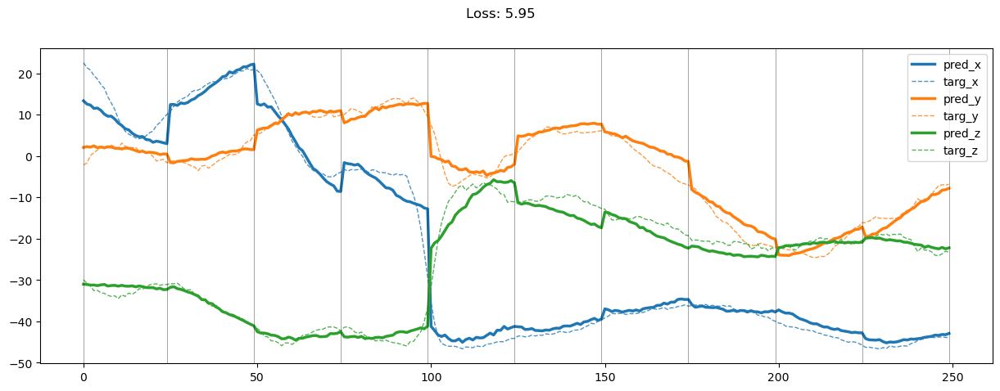

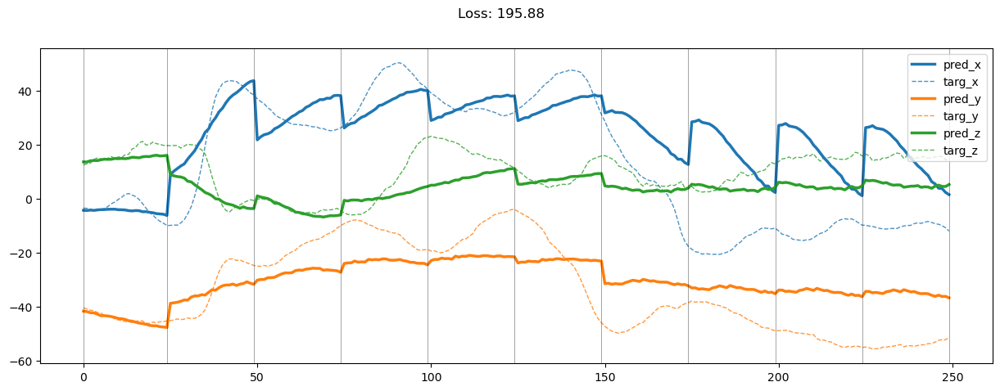

00349: train pred loss:  6.844, g loss:  7.280, d loss:  1.477
       valid pred loss:  115.803, g loss:  116.237, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00350: train pred loss:  6.710, g loss:  7.142, d loss:  1.479
       valid pred loss:  118.250, g loss:  118.681, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00351: train pred loss:  6.880, g loss:  7.309, d loss:  1.482
       valid pred loss:  121.918, g loss:  122.346, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00352: train pred loss:  7.075, g loss:  7.501, d loss:  1.484
       valid pred loss:  123.620, g loss:  124.045, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.19it/s]


00353: train pred loss:  6.816, g loss:  7.239, d loss:  1.487
       valid pred loss:  114.780, g loss:  115.201, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00354: train pred loss:  6.873, g loss:  7.294, d loss:  1.490
       valid pred loss:  117.091, g loss:  117.509, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00355: train pred loss:  6.848, g loss:  7.266, d loss:  1.493
       valid pred loss:  129.615, g loss:  130.030, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00356: train pred loss:  6.952, g loss:  7.367, d loss:  1.495
       valid pred loss:  124.685, g loss:  125.098, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00357: train pred loss:  6.912, g loss:  7.323, d loss:  1.498
       valid pred loss:  118.210, g loss:  118.620, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00358: train pred loss:  6.847, g loss:  7.256, d loss:  1.501
       valid pred loss:  129.329, g loss:  129.736, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00359: train pred loss:  6.975, g loss:  7.381, d loss:  1.504
       valid pred loss:  120.677, g loss:  121.081, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00360: train pred loss:  6.661, g loss:  7.064, d loss:  1.507
       valid pred loss:  119.006, g loss:  119.408, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00361: train pred loss:  6.655, g loss:  7.056, d loss:  1.510
       valid pred loss:  120.706, g loss:  121.104, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00362: train pred loss:  6.494, g loss:  6.891, d loss:  1.512
       valid pred loss:  117.168, g loss:  117.564, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00363: train pred loss:  6.605, g loss:  7.000, d loss:  1.515
       valid pred loss:  120.597, g loss:  120.990, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00364: train pred loss:  6.761, g loss:  7.153, d loss:  1.518
       valid pred loss:  116.843, g loss:  117.233, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00365: train pred loss:  6.816, g loss:  7.205, d loss:  1.521
       valid pred loss:  118.296, g loss:  118.684, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00366: train pred loss:  6.589, g loss:  6.976, d loss:  1.524
       valid pred loss:  120.937, g loss:  121.323, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00367: train pred loss:  6.701, g loss:  7.085, d loss:  1.527
       valid pred loss:  119.785, g loss:  120.168, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00368: train pred loss:  6.552, g loss:  6.934, d loss:  1.530
       valid pred loss:  115.443, g loss:  115.824, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00369: train pred loss:  6.621, g loss:  7.000, d loss:  1.532
       valid pred loss:  125.393, g loss:  125.771, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.13it/s]


00370: train pred loss:  6.545, g loss:  6.922, d loss:  1.535
       valid pred loss:  122.785, g loss:  123.161, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


00371: train pred loss:  6.566, g loss:  6.941, d loss:  1.538
       valid pred loss:  124.790, g loss:  125.163, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00372: train pred loss:  6.699, g loss:  7.071, d loss:  1.541
       valid pred loss:  126.770, g loss:  127.142, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00373: train pred loss:  6.505, g loss:  6.875, d loss:  1.543
       valid pred loss:  120.697, g loss:  121.066, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00374: train pred loss:  6.716, g loss:  7.085, d loss:  1.546
       valid pred loss:  123.266, g loss:  123.633, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.25it/s]


00375: train pred loss:  6.317, g loss:  6.684, d loss:  1.548
       valid pred loss:  124.589, g loss:  124.955, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.29it/s]


00376: train pred loss:  6.261, g loss:  6.625, d loss:  1.551
       valid pred loss:  123.937, g loss:  124.301, d loss:  1.552


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00377: train pred loss:  6.188, g loss:  6.551, d loss:  1.553
       valid pred loss:  119.913, g loss:  120.274, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00378: train pred loss:  6.464, g loss:  6.825, d loss:  1.555
       valid pred loss:  118.373, g loss:  118.733, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.67it/s]


00379: train pred loss:  6.215, g loss:  6.574, d loss:  1.557
       valid pred loss:  127.073, g loss:  127.432, d loss:  1.559


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.65it/s]


00380: train pred loss:  6.315, g loss:  6.673, d loss:  1.560
       valid pred loss:  119.154, g loss:  119.511, d loss:  1.561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00381: train pred loss:  6.193, g loss:  6.549, d loss:  1.562
       valid pred loss:  116.420, g loss:  116.775, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00382: train pred loss:  6.065, g loss:  6.420, d loss:  1.564
       valid pred loss:  122.550, g loss:  122.904, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00383: train pred loss:  6.193, g loss:  6.546, d loss:  1.565
       valid pred loss:  119.218, g loss:  119.570, d loss:  1.566


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00384: train pred loss:  6.015, g loss:  6.367, d loss:  1.567
       valid pred loss:  116.564, g loss:  116.915, d loss:  1.568


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00385: train pred loss:  6.276, g loss:  6.626, d loss:  1.569
       valid pred loss:  117.382, g loss:  117.732, d loss:  1.570


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


00386: train pred loss:  6.130, g loss:  6.480, d loss:  1.570
       valid pred loss:  117.321, g loss:  117.670, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00387: train pred loss:  6.058, g loss:  6.406, d loss:  1.572
       valid pred loss:  119.581, g loss:  119.929, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00388: train pred loss:  6.034, g loss:  6.382, d loss:  1.573
       valid pred loss:  110.594, g loss:  110.941, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00389: train pred loss:  5.993, g loss:  6.340, d loss:  1.574
       valid pred loss:  113.191, g loss:  113.538, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00390: train pred loss:  6.024, g loss:  6.370, d loss:  1.576
       valid pred loss:  120.167, g loss:  120.513, d loss:  1.576


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00391: train pred loss:  6.021, g loss:  6.366, d loss:  1.577
       valid pred loss:  112.239, g loss:  112.584, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00392: train pred loss:  5.932, g loss:  6.276, d loss:  1.577
       valid pred loss:  116.946, g loss:  117.291, d loss:  1.578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00393: train pred loss:  5.997, g loss:  6.341, d loss:  1.578
       valid pred loss:  114.739, g loss:  115.083, d loss:  1.578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.50it/s]


00394: train pred loss:  6.031, g loss:  6.374, d loss:  1.579
       valid pred loss:  119.564, g loss:  119.907, d loss:  1.579


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.50it/s]


00395: train pred loss:  5.953, g loss:  6.296, d loss:  1.579
       valid pred loss:  118.604, g loss:  118.947, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00396: train pred loss:  5.815, g loss:  6.158, d loss:  1.580
       valid pred loss:  120.863, g loss:  121.206, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00397: train pred loss:  5.898, g loss:  6.241, d loss:  1.580
       valid pred loss:  113.751, g loss:  114.094, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.25it/s]


00398: train pred loss:  5.870, g loss:  6.213, d loss:  1.580
       valid pred loss:  117.052, g loss:  117.395, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


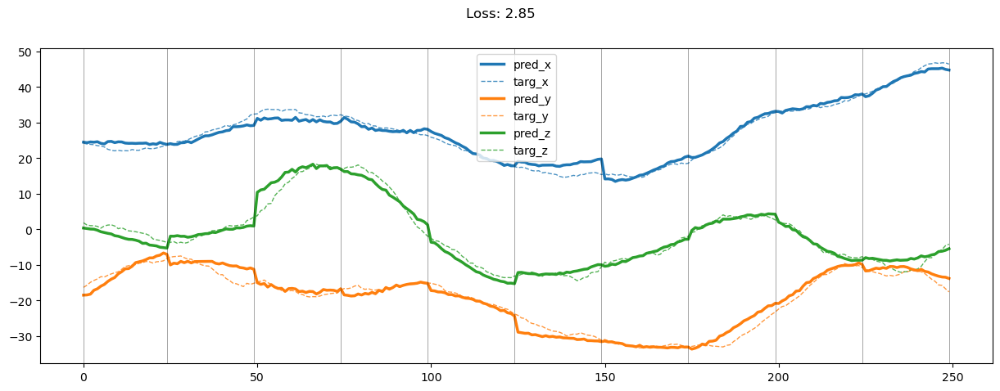

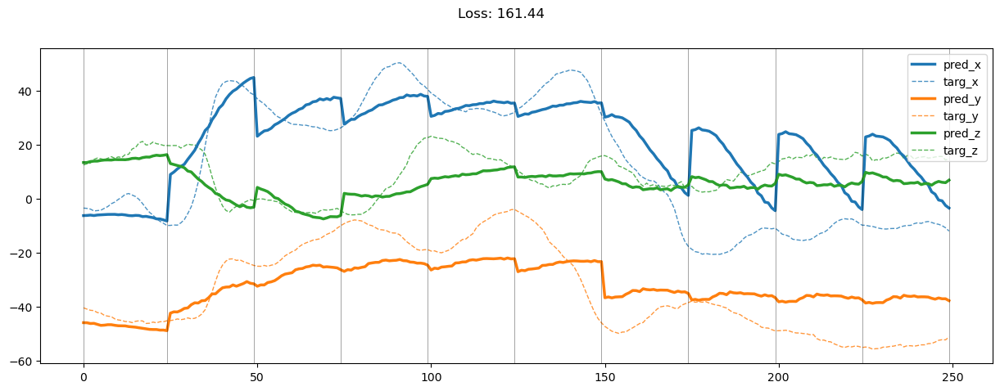

00399: train pred loss:  5.880, g loss:  6.223, d loss:  1.580
       valid pred loss:  117.838, g loss:  118.181, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00400: train pred loss:  5.843, g loss:  6.186, d loss:  1.580
       valid pred loss:  120.931, g loss:  121.274, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00401: train pred loss:  5.925, g loss:  6.268, d loss:  1.580
       valid pred loss:  110.717, g loss:  111.060, d loss:  1.579


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00402: train pred loss:  5.789, g loss:  6.132, d loss:  1.579
       valid pred loss:  108.744, g loss:  109.088, d loss:  1.579


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00403: train pred loss:  5.818, g loss:  6.162, d loss:  1.579
       valid pred loss:  121.549, g loss:  121.893, d loss:  1.579


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00404: train pred loss:  5.600, g loss:  5.944, d loss:  1.578
       valid pred loss:  122.414, g loss:  122.758, d loss:  1.578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00405: train pred loss:  5.824, g loss:  6.169, d loss:  1.577
       valid pred loss:  121.462, g loss:  121.807, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


00406: train pred loss:  5.745, g loss:  6.090, d loss:  1.577
       valid pred loss:  116.469, g loss:  116.814, d loss:  1.576


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00407: train pred loss:  5.921, g loss:  6.267, d loss:  1.576
       valid pred loss:  116.742, g loss:  117.088, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.41it/s]


00408: train pred loss:  5.874, g loss:  6.220, d loss:  1.575
       valid pred loss:  120.594, g loss:  120.941, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00409: train pred loss:  5.847, g loss:  6.194, d loss:  1.573
       valid pred loss:  121.199, g loss:  121.547, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


00410: train pred loss:  6.104, g loss:  6.452, d loss:  1.572
       valid pred loss:  119.101, g loss:  119.450, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.15it/s]


00411: train pred loss:  5.924, g loss:  6.273, d loss:  1.571
       valid pred loss:  117.643, g loss:  117.993, d loss:  1.570


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.48it/s]


00412: train pred loss:  6.117, g loss:  6.468, d loss:  1.569
       valid pred loss:  116.046, g loss:  116.397, d loss:  1.568


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.50it/s]


00413: train pred loss:  5.815, g loss:  6.166, d loss:  1.568
       valid pred loss:  126.068, g loss:  126.420, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00414: train pred loss:  5.723, g loss:  6.076, d loss:  1.566
       valid pred loss:  115.633, g loss:  115.987, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00415: train pred loss:  5.716, g loss:  6.070, d loss:  1.564
       valid pred loss:  118.031, g loss:  118.385, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00416: train pred loss:  5.548, g loss:  5.904, d loss:  1.562
       valid pred loss:  117.098, g loss:  117.455, d loss:  1.561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00417: train pred loss:  5.345, g loss:  5.702, d loss:  1.561
       valid pred loss:  114.896, g loss:  115.253, d loss:  1.560


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00418: train pred loss:  5.542, g loss:  5.900, d loss:  1.559
       valid pred loss:  120.155, g loss:  120.514, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.22it/s]


00419: train pred loss:  5.461, g loss:  5.821, d loss:  1.557
       valid pred loss:  121.044, g loss:  121.405, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.12it/s]


00420: train pred loss:  5.302, g loss:  5.664, d loss:  1.554
       valid pred loss:  118.647, g loss:  119.010, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.26it/s]


00421: train pred loss:  5.397, g loss:  5.760, d loss:  1.552
       valid pred loss:  119.590, g loss:  119.954, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.66it/s]


00422: train pred loss:  5.361, g loss:  5.726, d loss:  1.550
       valid pred loss:  123.260, g loss:  123.626, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.98it/s]


00423: train pred loss:  5.255, g loss:  5.622, d loss:  1.548
       valid pred loss:  119.860, g loss:  120.228, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00424: train pred loss:  5.376, g loss:  5.744, d loss:  1.546
       valid pred loss:  126.380, g loss:  126.749, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00425: train pred loss:  5.520, g loss:  5.890, d loss:  1.544
       valid pred loss:  120.193, g loss:  120.564, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00426: train pred loss:  5.262, g loss:  5.634, d loss:  1.541
       valid pred loss:  119.221, g loss:  119.595, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.59it/s]


00427: train pred loss:  5.373, g loss:  5.747, d loss:  1.539
       valid pred loss:  121.047, g loss:  121.422, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00428: train pred loss:  5.358, g loss:  5.734, d loss:  1.537
       valid pred loss:  124.074, g loss:  124.451, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00429: train pred loss:  5.642, g loss:  6.020, d loss:  1.534
       valid pred loss:  123.606, g loss:  123.985, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00430: train pred loss:  5.358, g loss:  5.738, d loss:  1.532
       valid pred loss:  118.176, g loss:  118.557, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00431: train pred loss:  5.456, g loss:  5.838, d loss:  1.529
       valid pred loss:  118.681, g loss:  119.064, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.46it/s]


00432: train pred loss:  5.382, g loss:  5.766, d loss:  1.527
       valid pred loss:  124.165, g loss:  124.551, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00433: train pred loss:  5.358, g loss:  5.744, d loss:  1.525
       valid pred loss:  122.305, g loss:  122.692, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00434: train pred loss:  5.185, g loss:  5.573, d loss:  1.522
       valid pred loss:  123.372, g loss:  123.762, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00435: train pred loss:  5.267, g loss:  5.658, d loss:  1.520
       valid pred loss:  121.807, g loss:  122.198, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


00436: train pred loss:  5.248, g loss:  5.640, d loss:  1.518
       valid pred loss:  123.183, g loss:  123.576, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00437: train pred loss:  5.268, g loss:  5.663, d loss:  1.515
       valid pred loss:  119.161, g loss:  119.557, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00438: train pred loss:  5.318, g loss:  5.714, d loss:  1.513
       valid pred loss:  119.006, g loss:  119.404, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00439: train pred loss:  5.300, g loss:  5.699, d loss:  1.511
       valid pred loss:  118.847, g loss:  119.247, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00440: train pred loss:  5.400, g loss:  5.801, d loss:  1.509
       valid pred loss:  117.816, g loss:  118.218, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00441: train pred loss:  5.403, g loss:  5.806, d loss:  1.506
       valid pred loss:  120.803, g loss:  121.207, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00442: train pred loss:  5.173, g loss:  5.578, d loss:  1.504
       valid pred loss:  117.698, g loss:  118.105, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00443: train pred loss:  5.186, g loss:  5.593, d loss:  1.502
       valid pred loss:  120.427, g loss:  120.836, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00444: train pred loss:  5.002, g loss:  5.411, d loss:  1.500
       valid pred loss:  114.618, g loss:  115.029, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00445: train pred loss:  5.175, g loss:  5.587, d loss:  1.498
       valid pred loss:  117.284, g loss:  117.697, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00446: train pred loss:  5.071, g loss:  5.485, d loss:  1.496
       valid pred loss:  127.788, g loss:  128.203, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00447: train pred loss:  5.075, g loss:  5.491, d loss:  1.494
       valid pred loss:  123.443, g loss:  123.860, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00448: train pred loss:  4.989, g loss:  5.408, d loss:  1.492
       valid pred loss:  118.673, g loss:  119.092, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


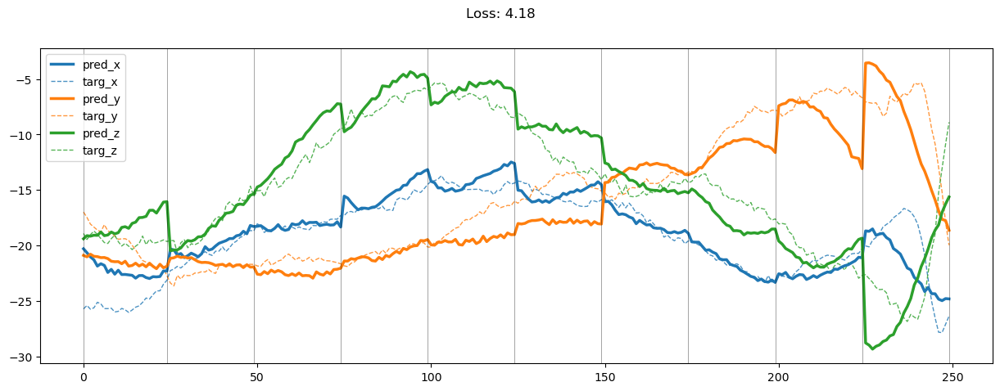

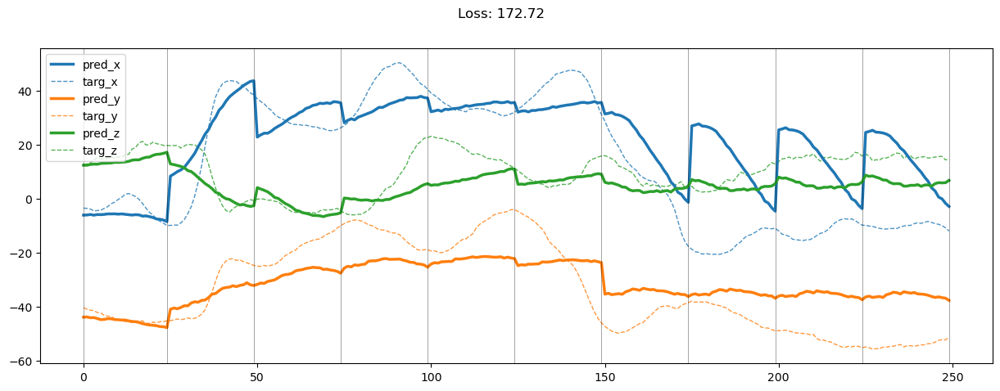

00449: train pred loss:  5.191, g loss:  5.611, d loss:  1.490
       valid pred loss:  116.554, g loss:  116.975, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00450: train pred loss:  5.117, g loss:  5.539, d loss:  1.488
       valid pred loss:  121.983, g loss:  122.406, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00451: train pred loss:  4.988, g loss:  5.412, d loss:  1.486
       valid pred loss:  126.642, g loss:  127.067, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.10it/s]


00452: train pred loss:  4.888, g loss:  5.315, d loss:  1.484
       valid pred loss:  128.641, g loss:  129.068, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00453: train pred loss:  4.791, g loss:  5.220, d loss:  1.483
       valid pred loss:  121.915, g loss:  122.344, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


00454: train pred loss:  5.003, g loss:  5.434, d loss:  1.481
       valid pred loss:  122.961, g loss:  123.392, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00455: train pred loss:  4.926, g loss:  5.358, d loss:  1.479
       valid pred loss:  125.368, g loss:  125.801, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00456: train pred loss:  5.031, g loss:  5.465, d loss:  1.478
       valid pred loss:  124.737, g loss:  125.172, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00457: train pred loss:  4.924, g loss:  5.360, d loss:  1.476
       valid pred loss:  116.180, g loss:  116.617, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00458: train pred loss:  5.005, g loss:  5.443, d loss:  1.475
       valid pred loss:  122.634, g loss:  123.073, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00459: train pred loss:  5.133, g loss:  5.573, d loss:  1.473
       valid pred loss:  121.138, g loss:  121.579, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00460: train pred loss:  5.163, g loss:  5.605, d loss:  1.472
       valid pred loss:  121.635, g loss:  122.078, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00461: train pred loss:  5.259, g loss:  5.702, d loss:  1.471
       valid pred loss:  121.310, g loss:  121.754, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.46it/s]


00462: train pred loss:  5.141, g loss:  5.586, d loss:  1.469
       valid pred loss:  112.608, g loss:  113.054, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00463: train pred loss:  5.179, g loss:  5.625, d loss:  1.468
       valid pred loss:  120.481, g loss:  120.928, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00464: train pred loss:  5.344, g loss:  5.792, d loss:  1.467
       valid pred loss:  118.734, g loss:  119.183, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00465: train pred loss:  5.332, g loss:  5.781, d loss:  1.466
       valid pred loss:  117.310, g loss:  117.760, d loss:  1.465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00466: train pred loss:  5.562, g loss:  6.013, d loss:  1.465
       valid pred loss:  119.481, g loss:  119.932, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00467: train pred loss:  5.387, g loss:  5.840, d loss:  1.463
       valid pred loss:  120.211, g loss:  120.664, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


00468: train pred loss:  5.150, g loss:  5.604, d loss:  1.462
       valid pred loss:  118.219, g loss:  118.674, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00469: train pred loss:  5.164, g loss:  5.619, d loss:  1.461
       valid pred loss:  116.312, g loss:  116.768, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


00470: train pred loss:  5.218, g loss:  5.674, d loss:  1.460
       valid pred loss:  128.090, g loss:  128.547, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00471: train pred loss:  5.210, g loss:  5.667, d loss:  1.460
       valid pred loss:  128.161, g loss:  128.619, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00472: train pred loss:  5.003, g loss:  5.462, d loss:  1.459
       valid pred loss:  124.318, g loss:  124.777, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00473: train pred loss:  4.890, g loss:  5.349, d loss:  1.458
       valid pred loss:  124.882, g loss:  125.342, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.44it/s]


00474: train pred loss:  4.817, g loss:  5.278, d loss:  1.457
       valid pred loss:  118.985, g loss:  119.446, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.00it/s]


00475: train pred loss:  4.870, g loss:  5.332, d loss:  1.457
       valid pred loss:  126.040, g loss:  126.503, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00476: train pred loss:  4.799, g loss:  5.262, d loss:  1.456
       valid pred loss:  117.674, g loss:  118.137, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00477: train pred loss:  4.742, g loss:  5.206, d loss:  1.455
       valid pred loss:  124.294, g loss:  124.758, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00478: train pred loss:  4.740, g loss:  5.205, d loss:  1.455
       valid pred loss:  120.468, g loss:  120.933, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


00479: train pred loss:  4.548, g loss:  5.013, d loss:  1.454
       valid pred loss:  126.518, g loss:  126.983, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00480: train pred loss:  4.672, g loss:  5.138, d loss:  1.454
       valid pred loss:  132.878, g loss:  133.344, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00481: train pred loss:  4.730, g loss:  5.197, d loss:  1.453
       valid pred loss:  120.055, g loss:  120.522, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


00482: train pred loss:  4.517, g loss:  4.985, d loss:  1.453
       valid pred loss:  124.498, g loss:  124.965, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00483: train pred loss:  4.674, g loss:  5.142, d loss:  1.452
       valid pred loss:  122.304, g loss:  122.772, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.12it/s]


00484: train pred loss:  4.606, g loss:  5.075, d loss:  1.452
       valid pred loss:  122.166, g loss:  122.634, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00485: train pred loss:  4.552, g loss:  5.021, d loss:  1.452
       valid pred loss:  123.783, g loss:  124.251, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00486: train pred loss:  4.506, g loss:  4.975, d loss:  1.452
       valid pred loss:  120.274, g loss:  120.743, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00487: train pred loss:  4.524, g loss:  4.993, d loss:  1.451
       valid pred loss:  122.081, g loss:  122.550, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00488: train pred loss:  4.496, g loss:  4.966, d loss:  1.451
       valid pred loss:  121.618, g loss:  122.088, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00489: train pred loss:  4.472, g loss:  4.941, d loss:  1.451
       valid pred loss:  122.214, g loss:  122.684, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00490: train pred loss:  4.548, g loss:  5.018, d loss:  1.451
       valid pred loss:  123.125, g loss:  123.595, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00491: train pred loss:  4.493, g loss:  4.963, d loss:  1.451
       valid pred loss:  119.983, g loss:  120.453, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.41it/s]


00492: train pred loss:  4.399, g loss:  4.868, d loss:  1.451
       valid pred loss:  121.752, g loss:  122.222, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00493: train pred loss:  4.477, g loss:  4.946, d loss:  1.451
       valid pred loss:  129.814, g loss:  130.283, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00494: train pred loss:  4.247, g loss:  4.717, d loss:  1.451
       valid pred loss:  126.557, g loss:  127.026, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00495: train pred loss:  4.290, g loss:  4.759, d loss:  1.452
       valid pred loss:  126.851, g loss:  127.320, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00496: train pred loss:  4.283, g loss:  4.752, d loss:  1.452
       valid pred loss:  124.305, g loss:  124.773, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00497: train pred loss:  4.406, g loss:  4.874, d loss:  1.452
       valid pred loss:  123.734, g loss:  124.202, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00498: train pred loss:  4.369, g loss:  4.837, d loss:  1.452
       valid pred loss:  122.411, g loss:  122.878, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


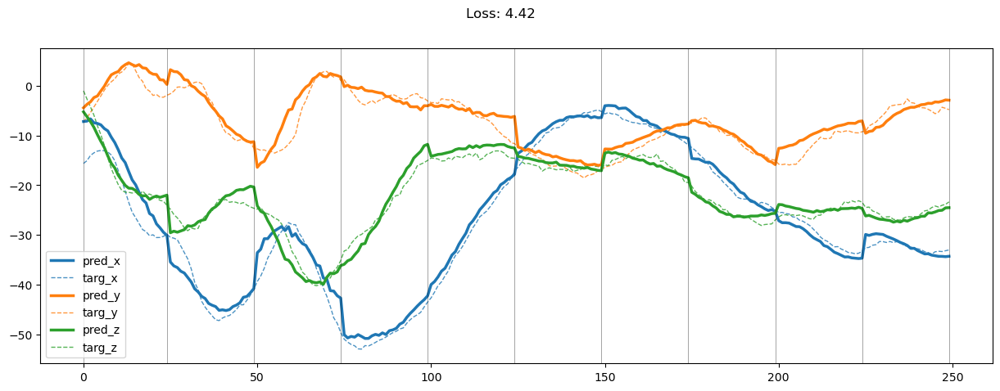

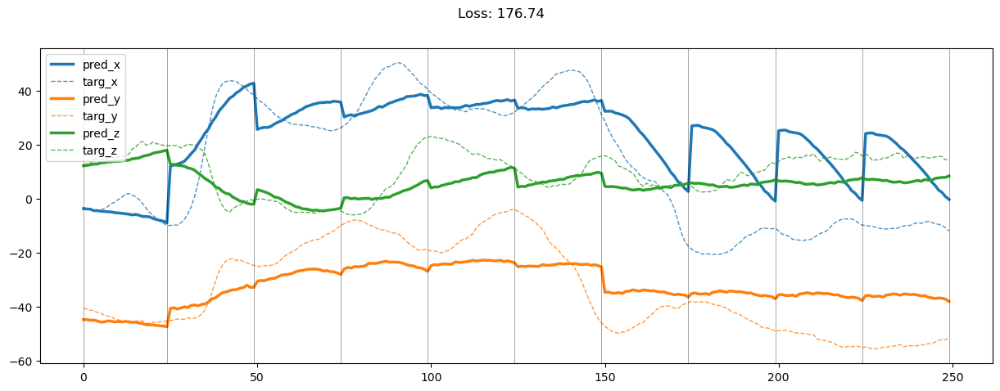

00499: train pred loss:  4.314, g loss:  4.782, d loss:  1.453
       valid pred loss:  123.127, g loss:  123.594, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00500: train pred loss:  4.398, g loss:  4.865, d loss:  1.453
       valid pred loss:  127.571, g loss:  128.038, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00501: train pred loss:  4.415, g loss:  4.881, d loss:  1.453
       valid pred loss:  130.849, g loss:  131.315, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00502: train pred loss:  4.322, g loss:  4.787, d loss:  1.454
       valid pred loss:  124.644, g loss:  125.109, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00503: train pred loss:  4.358, g loss:  4.823, d loss:  1.454
       valid pred loss:  127.304, g loss:  127.769, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00504: train pred loss:  4.326, g loss:  4.790, d loss:  1.455
       valid pred loss:  131.028, g loss:  131.492, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00505: train pred loss:  4.342, g loss:  4.805, d loss:  1.455
       valid pred loss:  128.897, g loss:  129.360, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.69it/s]


00506: train pred loss:  4.432, g loss:  4.895, d loss:  1.456
       valid pred loss:  132.177, g loss:  132.639, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00507: train pred loss:  4.472, g loss:  4.934, d loss:  1.457
       valid pred loss:  129.216, g loss:  129.677, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00508: train pred loss:  4.560, g loss:  5.021, d loss:  1.457
       valid pred loss:  125.143, g loss:  125.603, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00509: train pred loss:  4.200, g loss:  4.660, d loss:  1.458
       valid pred loss:  124.119, g loss:  124.578, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00510: train pred loss:  4.240, g loss:  4.698, d loss:  1.459
       valid pred loss:  125.525, g loss:  125.983, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00511: train pred loss:  4.261, g loss:  4.719, d loss:  1.460
       valid pred loss:  122.407, g loss:  122.865, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00512: train pred loss:  4.244, g loss:  4.701, d loss:  1.460
       valid pred loss:  129.073, g loss:  129.529, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


00513: train pred loss:  4.146, g loss:  4.601, d loss:  1.461
       valid pred loss:  123.773, g loss:  124.227, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.74it/s]


00514: train pred loss:  4.227, g loss:  4.681, d loss:  1.462
       valid pred loss:  123.792, g loss:  124.246, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00515: train pred loss:  4.163, g loss:  4.615, d loss:  1.463
       valid pred loss:  127.681, g loss:  128.132, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00516: train pred loss:  4.153, g loss:  4.605, d loss:  1.464
       valid pred loss:  128.034, g loss:  128.485, d loss:  1.465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00517: train pred loss:  4.206, g loss:  4.656, d loss:  1.465
       valid pred loss:  126.547, g loss:  126.996, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00518: train pred loss:  4.204, g loss:  4.653, d loss:  1.466
       valid pred loss:  126.509, g loss:  126.957, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


00519: train pred loss:  4.272, g loss:  4.719, d loss:  1.467
       valid pred loss:  125.086, g loss:  125.532, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.98it/s]


00520: train pred loss:  4.160, g loss:  4.606, d loss:  1.468
       valid pred loss:  123.998, g loss:  124.443, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00521: train pred loss:  4.190, g loss:  4.634, d loss:  1.470
       valid pred loss:  123.529, g loss:  123.973, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00522: train pred loss:  4.017, g loss:  4.460, d loss:  1.471
       valid pred loss:  122.693, g loss:  123.135, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00523: train pred loss:  4.144, g loss:  4.585, d loss:  1.472
       valid pred loss:  120.431, g loss:  120.872, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00524: train pred loss:  4.185, g loss:  4.625, d loss:  1.473
       valid pred loss:  124.599, g loss:  125.038, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


00525: train pred loss:  4.248, g loss:  4.686, d loss:  1.474
       valid pred loss:  113.145, g loss:  113.582, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00526: train pred loss:  4.242, g loss:  4.679, d loss:  1.476
       valid pred loss:  121.771, g loss:  122.207, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00527: train pred loss:  4.129, g loss:  4.564, d loss:  1.477
       valid pred loss:  123.918, g loss:  124.352, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00528: train pred loss:  4.075, g loss:  4.508, d loss:  1.478
       valid pred loss:  116.968, g loss:  117.401, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00529: train pred loss:  4.157, g loss:  4.589, d loss:  1.480
       valid pred loss:  117.409, g loss:  117.840, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00530: train pred loss:  4.127, g loss:  4.557, d loss:  1.481
       valid pred loss:  129.185, g loss:  129.615, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00531: train pred loss:  4.023, g loss:  4.452, d loss:  1.482
       valid pred loss:  135.741, g loss:  136.169, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00532: train pred loss:  4.197, g loss:  4.625, d loss:  1.484
       valid pred loss:  128.460, g loss:  128.886, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00533: train pred loss:  4.159, g loss:  4.585, d loss:  1.485
       valid pred loss:  126.916, g loss:  127.340, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00534: train pred loss:  4.223, g loss:  4.647, d loss:  1.487
       valid pred loss:  124.082, g loss:  124.505, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00535: train pred loss:  4.025, g loss:  4.447, d loss:  1.488
       valid pred loss:  122.798, g loss:  123.220, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00536: train pred loss:  4.194, g loss:  4.615, d loss:  1.490
       valid pred loss:  121.680, g loss:  122.100, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00537: train pred loss:  4.051, g loss:  4.470, d loss:  1.491
       valid pred loss:  121.576, g loss:  121.995, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.17it/s]


00538: train pred loss:  3.953, g loss:  4.371, d loss:  1.493
       valid pred loss:  117.981, g loss:  118.397, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.30it/s]


00539: train pred loss:  3.863, g loss:  4.279, d loss:  1.494
       valid pred loss:  127.817, g loss:  128.232, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00540: train pred loss:  3.911, g loss:  4.325, d loss:  1.496
       valid pred loss:  133.469, g loss:  133.883, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00541: train pred loss:  3.884, g loss:  4.297, d loss:  1.497
       valid pred loss:  123.963, g loss:  124.375, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00542: train pred loss:  3.909, g loss:  4.320, d loss:  1.499
       valid pred loss:  125.011, g loss:  125.421, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.83it/s]


00543: train pred loss:  3.873, g loss:  4.283, d loss:  1.500
       valid pred loss:  122.680, g loss:  123.088, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00544: train pred loss:  3.795, g loss:  4.203, d loss:  1.502
       valid pred loss:  118.358, g loss:  118.765, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00545: train pred loss:  3.888, g loss:  4.295, d loss:  1.503
       valid pred loss:  122.236, g loss:  122.642, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00546: train pred loss:  3.800, g loss:  4.205, d loss:  1.505
       valid pred loss:  119.562, g loss:  119.966, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00547: train pred loss:  3.895, g loss:  4.298, d loss:  1.506
       valid pred loss:  123.227, g loss:  123.629, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00548: train pred loss:  3.797, g loss:  4.198, d loss:  1.508
       valid pred loss:  117.126, g loss:  117.528, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


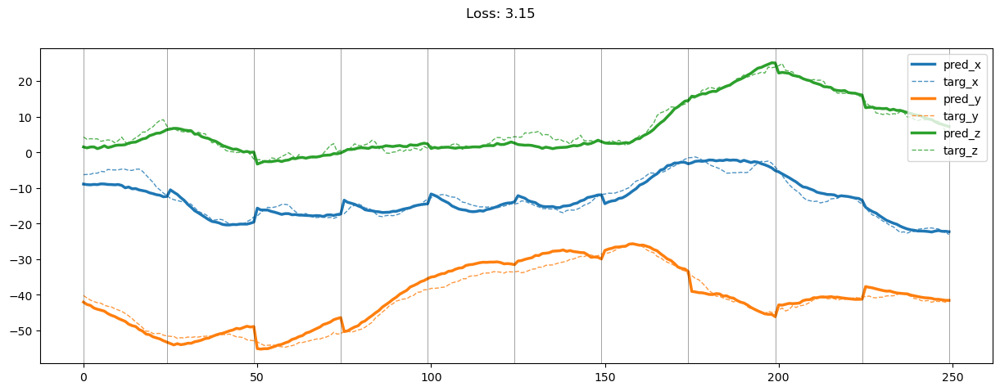

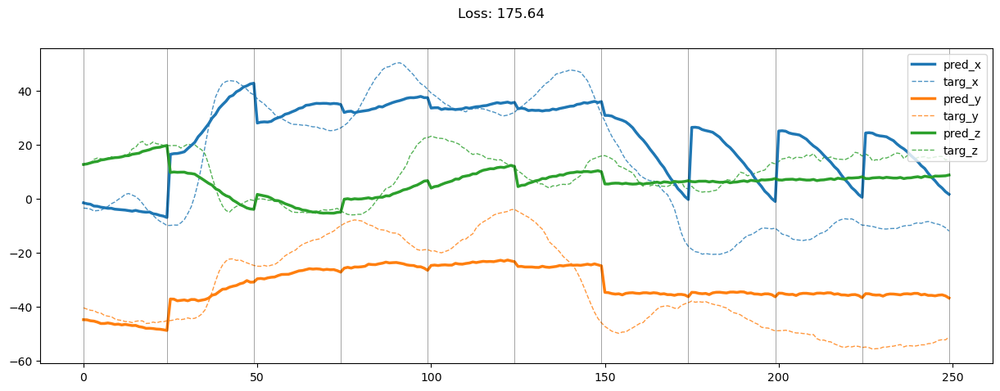

00549: train pred loss:  3.882, g loss:  4.282, d loss:  1.509
       valid pred loss:  118.118, g loss:  118.517, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00550: train pred loss:  3.774, g loss:  4.173, d loss:  1.511
       valid pred loss:  122.104, g loss:  122.503, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


00551: train pred loss:  3.805, g loss:  4.202, d loss:  1.513
       valid pred loss:  118.549, g loss:  118.946, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00552: train pred loss:  3.715, g loss:  4.111, d loss:  1.514
       valid pred loss:  114.627, g loss:  115.023, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00553: train pred loss:  3.624, g loss:  4.018, d loss:  1.516
       valid pred loss:  119.988, g loss:  120.382, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00554: train pred loss:  3.800, g loss:  4.193, d loss:  1.517
       valid pred loss:  122.060, g loss:  122.452, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00555: train pred loss:  3.918, g loss:  4.309, d loss:  1.519
       valid pred loss:  121.696, g loss:  122.087, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.36it/s]


00556: train pred loss:  3.742, g loss:  4.132, d loss:  1.520
       valid pred loss:  120.534, g loss:  120.924, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00557: train pred loss:  3.566, g loss:  3.955, d loss:  1.522
       valid pred loss:  123.681, g loss:  124.069, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00558: train pred loss:  3.589, g loss:  3.977, d loss:  1.523
       valid pred loss:  116.640, g loss:  117.027, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00559: train pred loss:  3.628, g loss:  4.014, d loss:  1.525
       valid pred loss:  118.273, g loss:  118.658, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00560: train pred loss:  3.690, g loss:  4.075, d loss:  1.526
       valid pred loss:  122.609, g loss:  122.994, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00561: train pred loss:  3.710, g loss:  4.094, d loss:  1.527
       valid pred loss:  118.333, g loss:  118.716, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00562: train pred loss:  3.734, g loss:  4.116, d loss:  1.529
       valid pred loss:  122.455, g loss:  122.837, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00563: train pred loss:  3.822, g loss:  4.203, d loss:  1.530
       valid pred loss:  124.481, g loss:  124.861, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00564: train pred loss:  3.857, g loss:  4.237, d loss:  1.531
       valid pred loss:  125.228, g loss:  125.607, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00565: train pred loss:  3.642, g loss:  4.021, d loss:  1.533
       valid pred loss:  123.384, g loss:  123.762, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00566: train pred loss:  3.594, g loss:  3.972, d loss:  1.534
       valid pred loss:  124.613, g loss:  124.990, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00567: train pred loss:  3.675, g loss:  4.052, d loss:  1.535
       valid pred loss:  126.643, g loss:  127.020, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00568: train pred loss:  3.709, g loss:  4.085, d loss:  1.537
       valid pred loss:  122.312, g loss:  122.687, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00569: train pred loss:  3.661, g loss:  4.036, d loss:  1.538
       valid pred loss:  121.219, g loss:  121.593, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.60it/s]


00570: train pred loss:  3.651, g loss:  4.025, d loss:  1.539
       valid pred loss:  122.657, g loss:  123.031, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00571: train pred loss:  3.586, g loss:  3.959, d loss:  1.540
       valid pred loss:  123.793, g loss:  124.166, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00572: train pred loss:  3.593, g loss:  3.965, d loss:  1.541
       valid pred loss:  125.334, g loss:  125.705, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00573: train pred loss:  3.495, g loss:  3.866, d loss:  1.542
       valid pred loss:  123.103, g loss:  123.473, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


00574: train pred loss:  3.482, g loss:  3.853, d loss:  1.544
       valid pred loss:  124.500, g loss:  124.869, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00575: train pred loss:  3.521, g loss:  3.891, d loss:  1.545
       valid pred loss:  123.178, g loss:  123.547, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00576: train pred loss:  3.475, g loss:  3.844, d loss:  1.546
       valid pred loss:  123.424, g loss:  123.792, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00577: train pred loss:  3.547, g loss:  3.915, d loss:  1.546
       valid pred loss:  126.165, g loss:  126.533, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00578: train pred loss:  3.537, g loss:  3.904, d loss:  1.548
       valid pred loss:  122.846, g loss:  123.213, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00579: train pred loss:  3.558, g loss:  3.925, d loss:  1.548
       valid pred loss:  120.861, g loss:  121.227, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00580: train pred loss:  3.497, g loss:  3.863, d loss:  1.549
       valid pred loss:  122.654, g loss:  123.019, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00581: train pred loss:  3.650, g loss:  4.015, d loss:  1.550
       valid pred loss:  115.571, g loss:  115.935, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.31it/s]


00582: train pred loss:  3.617, g loss:  3.982, d loss:  1.551
       valid pred loss:  123.752, g loss:  124.116, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00583: train pred loss:  3.704, g loss:  4.068, d loss:  1.552
       valid pred loss:  117.299, g loss:  117.663, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.89it/s]


00584: train pred loss:  3.632, g loss:  3.996, d loss:  1.552
       valid pred loss:  117.862, g loss:  118.225, d loss:  1.552


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00585: train pred loss:  3.542, g loss:  3.905, d loss:  1.553
       valid pred loss:  122.820, g loss:  123.182, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.94it/s]


00586: train pred loss:  3.558, g loss:  3.920, d loss:  1.554
       valid pred loss:  121.716, g loss:  122.078, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.18it/s]


00587: train pred loss:  3.449, g loss:  3.811, d loss:  1.554
       valid pred loss:  119.448, g loss:  119.810, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00588: train pred loss:  3.469, g loss:  3.830, d loss:  1.555
       valid pred loss:  117.821, g loss:  118.182, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00589: train pred loss:  3.522, g loss:  3.883, d loss:  1.555
       valid pred loss:  126.846, g loss:  127.207, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00590: train pred loss:  3.691, g loss:  4.051, d loss:  1.556
       valid pred loss:  118.709, g loss:  119.069, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00591: train pred loss:  3.799, g loss:  4.159, d loss:  1.556
       valid pred loss:  120.579, g loss:  120.939, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00592: train pred loss:  3.763, g loss:  4.122, d loss:  1.557
       valid pred loss:  121.114, g loss:  121.474, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.51it/s]


00593: train pred loss:  3.508, g loss:  3.867, d loss:  1.557
       valid pred loss:  119.272, g loss:  119.632, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.86it/s]


00594: train pred loss:  3.669, g loss:  4.028, d loss:  1.557
       valid pred loss:  121.436, g loss:  121.795, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00595: train pred loss:  3.760, g loss:  4.119, d loss:  1.557
       valid pred loss:  124.554, g loss:  124.913, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00596: train pred loss:  3.577, g loss:  3.936, d loss:  1.558
       valid pred loss:  119.810, g loss:  120.169, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00597: train pred loss:  3.584, g loss:  3.943, d loss:  1.558
       valid pred loss:  124.551, g loss:  124.910, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00598: train pred loss:  3.544, g loss:  3.903, d loss:  1.558
       valid pred loss:  120.372, g loss:  120.731, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


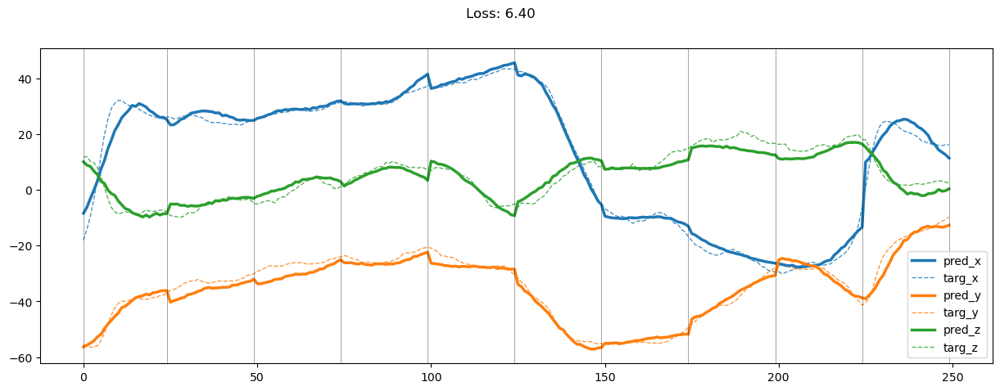

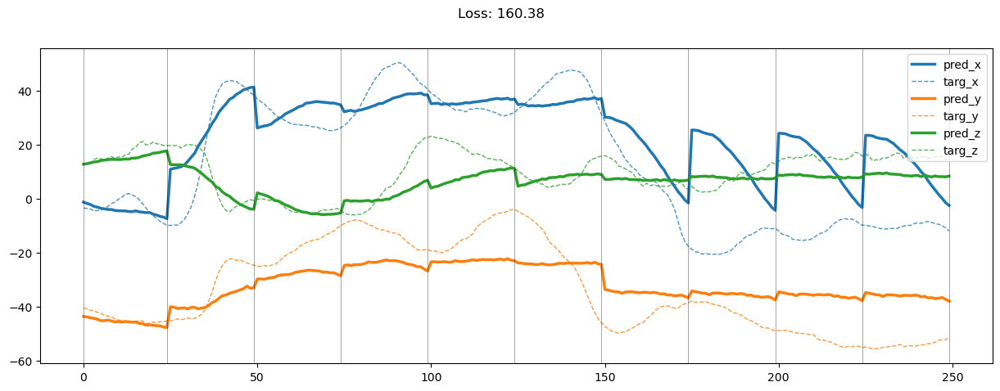

00599: train pred loss:  3.631, g loss:  3.990, d loss:  1.558
       valid pred loss:  121.973, g loss:  122.332, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.15it/s]


00600: train pred loss:  3.653, g loss:  4.012, d loss:  1.558
       valid pred loss:  126.012, g loss:  126.371, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00601: train pred loss:  3.635, g loss:  3.994, d loss:  1.558
       valid pred loss:  127.611, g loss:  127.970, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00602: train pred loss:  3.602, g loss:  3.961, d loss:  1.558
       valid pred loss:  131.181, g loss:  131.540, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00603: train pred loss:  3.485, g loss:  3.844, d loss:  1.558
       valid pred loss:  125.674, g loss:  126.033, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00604: train pred loss:  3.727, g loss:  4.086, d loss:  1.558
       valid pred loss:  121.980, g loss:  122.339, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


00605: train pred loss:  3.519, g loss:  3.879, d loss:  1.558
       valid pred loss:  121.992, g loss:  122.352, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00606: train pred loss:  3.453, g loss:  3.813, d loss:  1.557
       valid pred loss:  123.378, g loss:  123.738, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00607: train pred loss:  3.348, g loss:  3.707, d loss:  1.557
       valid pred loss:  122.664, g loss:  123.024, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00608: train pred loss:  3.503, g loss:  3.862, d loss:  1.557
       valid pred loss:  125.803, g loss:  126.163, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00609: train pred loss:  3.459, g loss:  3.819, d loss:  1.556
       valid pred loss:  125.274, g loss:  125.634, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00610: train pred loss:  3.369, g loss:  3.729, d loss:  1.556
       valid pred loss:  125.407, g loss:  125.767, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00611: train pred loss:  3.369, g loss:  3.730, d loss:  1.556
       valid pred loss:  126.092, g loss:  126.453, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00612: train pred loss:  3.346, g loss:  3.707, d loss:  1.555
       valid pred loss:  122.404, g loss:  122.766, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00613: train pred loss:  3.384, g loss:  3.746, d loss:  1.555
       valid pred loss:  124.592, g loss:  124.953, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00614: train pred loss:  3.297, g loss:  3.659, d loss:  1.554
       valid pred loss:  122.694, g loss:  123.056, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00615: train pred loss:  3.309, g loss:  3.671, d loss:  1.554
       valid pred loss:  121.509, g loss:  121.872, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00616: train pred loss:  3.336, g loss:  3.698, d loss:  1.553
       valid pred loss:  124.288, g loss:  124.651, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00617: train pred loss:  3.225, g loss:  3.588, d loss:  1.552
       valid pred loss:  126.986, g loss:  127.350, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00618: train pred loss:  3.255, g loss:  3.619, d loss:  1.552
       valid pred loss:  126.071, g loss:  126.435, d loss:  1.552


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00619: train pred loss:  3.245, g loss:  3.610, d loss:  1.551
       valid pred loss:  133.238, g loss:  133.602, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00620: train pred loss:  3.278, g loss:  3.642, d loss:  1.550
       valid pred loss:  126.354, g loss:  126.720, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00621: train pred loss:  3.320, g loss:  3.685, d loss:  1.549
       valid pred loss:  124.277, g loss:  124.643, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00622: train pred loss:  3.414, g loss:  3.780, d loss:  1.549
       valid pred loss:  117.198, g loss:  117.565, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


00623: train pred loss:  3.342, g loss:  3.708, d loss:  1.548
       valid pred loss:  123.012, g loss:  123.379, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00624: train pred loss:  3.342, g loss:  3.709, d loss:  1.547
       valid pred loss:  120.257, g loss:  120.625, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00625: train pred loss:  3.506, g loss:  3.874, d loss:  1.546
       valid pred loss:  119.852, g loss:  120.220, d loss:  1.546


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00626: train pred loss:  3.607, g loss:  3.975, d loss:  1.545
       valid pred loss:  126.826, g loss:  127.196, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.65it/s]


00627: train pred loss:  3.536, g loss:  3.905, d loss:  1.544
       valid pred loss:  128.155, g loss:  128.526, d loss:  1.544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.14it/s]


00628: train pred loss:  3.467, g loss:  3.837, d loss:  1.543
       valid pred loss:  114.949, g loss:  115.320, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00629: train pred loss:  3.588, g loss:  3.960, d loss:  1.542
       valid pred loss:  120.402, g loss:  120.774, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00630: train pred loss:  3.943, g loss:  4.316, d loss:  1.540
       valid pred loss:  122.647, g loss:  123.021, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00631: train pred loss:  3.788, g loss:  4.163, d loss:  1.538
       valid pred loss:  117.396, g loss:  117.771, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00632: train pred loss:  3.384, g loss:  3.761, d loss:  1.536
       valid pred loss:  119.481, g loss:  119.859, d loss:  1.535


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


00633: train pred loss:  3.422, g loss:  3.800, d loss:  1.533
       valid pred loss:  121.171, g loss:  121.551, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


00634: train pred loss:  3.268, g loss:  3.649, d loss:  1.531
       valid pred loss:  115.985, g loss:  116.367, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.88it/s]


00635: train pred loss:  3.379, g loss:  3.762, d loss:  1.528
       valid pred loss:  122.575, g loss:  122.960, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00636: train pred loss:  3.509, g loss:  3.895, d loss:  1.526
       valid pred loss:  122.313, g loss:  122.700, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.24it/s]


00637: train pred loss:  3.371, g loss:  3.759, d loss:  1.523
       valid pred loss:  123.275, g loss:  123.665, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00638: train pred loss:  3.318, g loss:  3.709, d loss:  1.520
       valid pred loss:  117.818, g loss:  118.210, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00639: train pred loss:  3.186, g loss:  3.579, d loss:  1.517
       valid pred loss:  124.468, g loss:  124.863, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00640: train pred loss:  3.184, g loss:  3.580, d loss:  1.514
       valid pred loss:  121.047, g loss:  121.444, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00641: train pred loss:  3.242, g loss:  3.641, d loss:  1.511
       valid pred loss:  118.400, g loss:  118.801, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


00642: train pred loss:  3.206, g loss:  3.608, d loss:  1.508
       valid pred loss:  125.796, g loss:  126.199, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00643: train pred loss:  3.164, g loss:  3.568, d loss:  1.505
       valid pred loss:  118.923, g loss:  119.329, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00644: train pred loss:  3.119, g loss:  3.527, d loss:  1.502
       valid pred loss:  114.296, g loss:  114.705, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00645: train pred loss:  3.131, g loss:  3.541, d loss:  1.499
       valid pred loss:  117.439, g loss:  117.851, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00646: train pred loss:  3.148, g loss:  3.561, d loss:  1.497
       valid pred loss:  116.007, g loss:  116.422, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00647: train pred loss:  3.092, g loss:  3.508, d loss:  1.494
       valid pred loss:  118.060, g loss:  118.478, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00648: train pred loss:  3.165, g loss:  3.584, d loss:  1.491
       valid pred loss:  119.706, g loss:  120.126, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


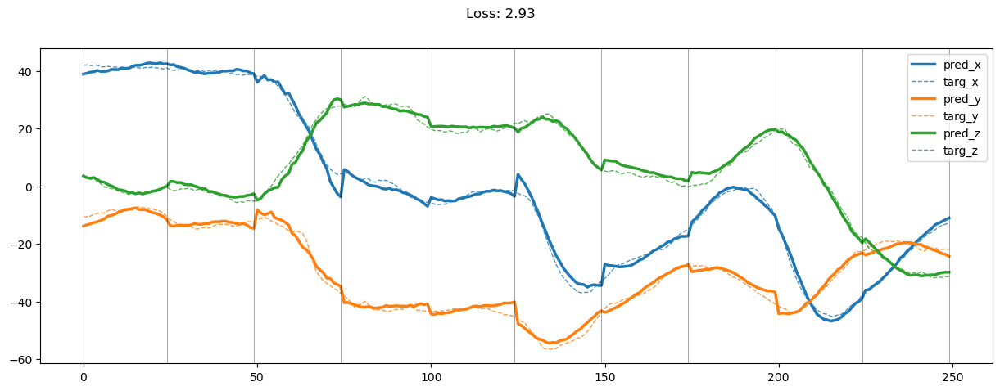

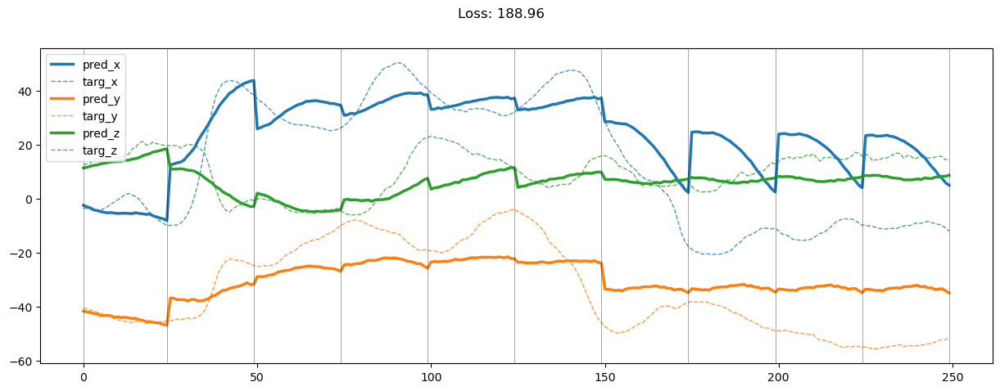

00649: train pred loss:  3.178, g loss:  3.599, d loss:  1.489
       valid pred loss:  119.623, g loss:  120.046, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.05it/s]


00650: train pred loss:  2.987, g loss:  3.411, d loss:  1.486
       valid pred loss:  121.610, g loss:  122.036, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


00651: train pred loss:  3.076, g loss:  3.503, d loss:  1.484
       valid pred loss:  121.692, g loss:  122.120, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00652: train pred loss:  3.032, g loss:  3.461, d loss:  1.482
       valid pred loss:  117.999, g loss:  118.429, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00653: train pred loss:  2.917, g loss:  3.347, d loss:  1.481
       valid pred loss:  116.765, g loss:  117.197, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


00654: train pred loss:  3.120, g loss:  3.552, d loss:  1.479
       valid pred loss:  114.762, g loss:  115.195, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00655: train pred loss:  3.030, g loss:  3.464, d loss:  1.478
       valid pred loss:  115.271, g loss:  115.705, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00656: train pred loss:  2.962, g loss:  3.397, d loss:  1.478
       valid pred loss:  119.889, g loss:  120.324, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00657: train pred loss:  3.120, g loss:  3.555, d loss:  1.477
       valid pred loss:  115.707, g loss:  116.142, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00658: train pred loss:  3.028, g loss:  3.464, d loss:  1.477
       valid pred loss:  113.306, g loss:  113.741, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00659: train pred loss:  3.119, g loss:  3.554, d loss:  1.477
       valid pred loss:  122.943, g loss:  123.378, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00660: train pred loss:  3.104, g loss:  3.538, d loss:  1.478
       valid pred loss:  123.024, g loss:  123.458, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00661: train pred loss:  3.029, g loss:  3.462, d loss:  1.478
       valid pred loss:  111.500, g loss:  111.933, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00662: train pred loss:  3.101, g loss:  3.534, d loss:  1.479
       valid pred loss:  116.928, g loss:  117.360, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00663: train pred loss:  2.949, g loss:  3.381, d loss:  1.480
       valid pred loss:  123.178, g loss:  123.609, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00664: train pred loss:  3.016, g loss:  3.447, d loss:  1.481
       valid pred loss:  113.751, g loss:  114.182, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00665: train pred loss:  2.976, g loss:  3.405, d loss:  1.481
       valid pred loss:  117.241, g loss:  117.670, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.30it/s]


00666: train pred loss:  2.990, g loss:  3.419, d loss:  1.482
       valid pred loss:  122.891, g loss:  123.319, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00667: train pred loss:  2.875, g loss:  3.302, d loss:  1.483
       valid pred loss:  116.251, g loss:  116.678, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00668: train pred loss:  2.854, g loss:  3.281, d loss:  1.484
       valid pred loss:  120.084, g loss:  120.510, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00669: train pred loss:  2.850, g loss:  3.275, d loss:  1.485
       valid pred loss:  125.755, g loss:  126.179, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00670: train pred loss:  2.818, g loss:  3.243, d loss:  1.486
       valid pred loss:  118.966, g loss:  119.390, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00671: train pred loss:  2.810, g loss:  3.233, d loss:  1.487
       valid pred loss:  118.248, g loss:  118.670, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00672: train pred loss:  2.821, g loss:  3.243, d loss:  1.488
       valid pred loss:  123.857, g loss:  124.279, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


00673: train pred loss:  2.937, g loss:  3.358, d loss:  1.489
       valid pred loss:  121.930, g loss:  122.351, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00674: train pred loss:  2.832, g loss:  3.253, d loss:  1.490
       valid pred loss:  116.166, g loss:  116.586, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.30it/s]


00675: train pred loss:  2.904, g loss:  3.323, d loss:  1.491
       valid pred loss:  115.977, g loss:  116.396, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00676: train pred loss:  2.898, g loss:  3.317, d loss:  1.491
       valid pred loss:  123.355, g loss:  123.774, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00677: train pred loss:  2.865, g loss:  3.283, d loss:  1.492
       valid pred loss:  120.782, g loss:  121.200, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00678: train pred loss:  3.034, g loss:  3.452, d loss:  1.492
       valid pred loss:  136.773, g loss:  137.190, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00679: train pred loss:  3.510, g loss:  3.927, d loss:  1.493
       valid pred loss:  128.053, g loss:  128.469, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00680: train pred loss:  3.560, g loss:  3.977, d loss:  1.494
       valid pred loss:  131.292, g loss:  131.708, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.16it/s]


00681: train pred loss:  3.905, g loss:  4.321, d loss:  1.494
       valid pred loss:  134.331, g loss:  134.746, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.20it/s]


00682: train pred loss:  3.714, g loss:  4.130, d loss:  1.494
       valid pred loss:  144.605, g loss:  145.020, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00683: train pred loss:  3.545, g loss:  3.960, d loss:  1.495
       valid pred loss:  144.941, g loss:  145.356, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00684: train pred loss:  3.440, g loss:  3.854, d loss:  1.495
       valid pred loss:  142.621, g loss:  143.036, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00685: train pred loss:  3.422, g loss:  3.837, d loss:  1.495
       valid pred loss:  126.806, g loss:  127.220, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00686: train pred loss:  3.447, g loss:  3.861, d loss:  1.496
       valid pred loss:  131.033, g loss:  131.447, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00687: train pred loss:  3.336, g loss:  3.750, d loss:  1.496
       valid pred loss:  138.922, g loss:  139.336, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00688: train pred loss:  3.137, g loss:  3.551, d loss:  1.496
       valid pred loss:  132.630, g loss:  133.044, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.13it/s]


00689: train pred loss:  3.062, g loss:  3.476, d loss:  1.496
       valid pred loss:  130.888, g loss:  131.302, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00690: train pred loss:  3.071, g loss:  3.485, d loss:  1.496
       valid pred loss:  136.465, g loss:  136.879, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00691: train pred loss:  3.056, g loss:  3.470, d loss:  1.496
       valid pred loss:  139.382, g loss:  139.796, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00692: train pred loss:  3.089, g loss:  3.503, d loss:  1.496
       valid pred loss:  133.020, g loss:  133.434, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00693: train pred loss:  3.116, g loss:  3.530, d loss:  1.496
       valid pred loss:  132.048, g loss:  132.462, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00694: train pred loss:  2.986, g loss:  3.400, d loss:  1.496
       valid pred loss:  135.265, g loss:  135.679, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00695: train pred loss:  3.028, g loss:  3.442, d loss:  1.496
       valid pred loss:  132.526, g loss:  132.940, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00696: train pred loss:  3.069, g loss:  3.484, d loss:  1.496
       valid pred loss:  130.006, g loss:  130.421, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00697: train pred loss:  3.050, g loss:  3.464, d loss:  1.496
       valid pred loss:  132.928, g loss:  133.343, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00698: train pred loss:  3.014, g loss:  3.429, d loss:  1.495
       valid pred loss:  125.907, g loss:  126.322, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


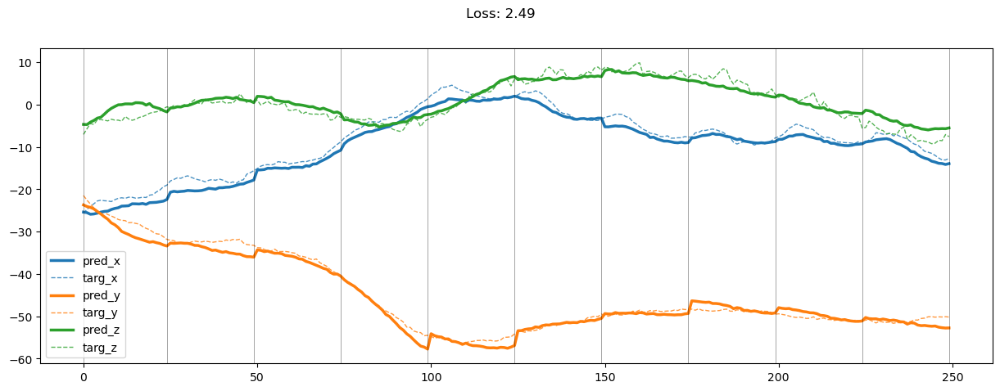

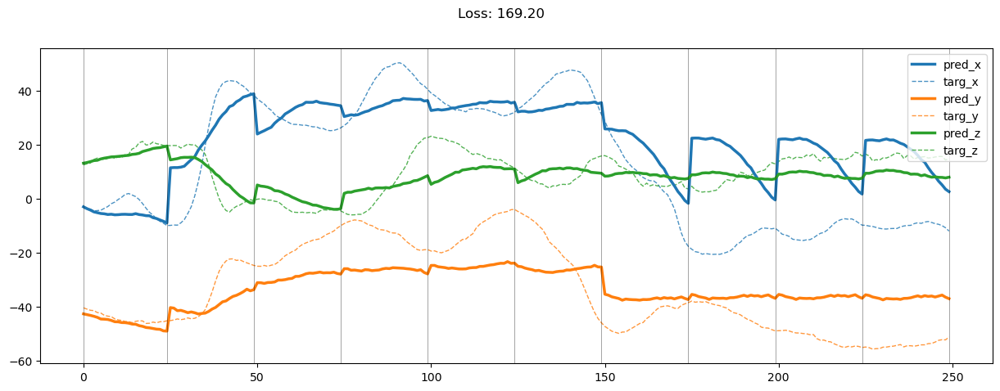

00699: train pred loss:  3.008, g loss:  3.423, d loss:  1.495
       valid pred loss:  124.777, g loss:  125.192, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00700: train pred loss:  3.058, g loss:  3.473, d loss:  1.495
       valid pred loss:  126.640, g loss:  127.055, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


00701: train pred loss:  2.946, g loss:  3.361, d loss:  1.495
       valid pred loss:  133.041, g loss:  133.457, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


00702: train pred loss:  2.904, g loss:  3.320, d loss:  1.494
       valid pred loss:  127.819, g loss:  128.235, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


00703: train pred loss:  3.005, g loss:  3.421, d loss:  1.494
       valid pred loss:  123.508, g loss:  123.925, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.18it/s]


00704: train pred loss:  2.976, g loss:  3.392, d loss:  1.494
       valid pred loss:  128.308, g loss:  128.725, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00705: train pred loss:  2.932, g loss:  3.349, d loss:  1.493
       valid pred loss:  124.315, g loss:  124.732, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00706: train pred loss:  3.024, g loss:  3.441, d loss:  1.493
       valid pred loss:  124.483, g loss:  124.900, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00707: train pred loss:  2.957, g loss:  3.374, d loss:  1.493
       valid pred loss:  137.618, g loss:  138.035, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00708: train pred loss:  3.092, g loss:  3.510, d loss:  1.492
       valid pred loss:  129.475, g loss:  129.893, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00709: train pred loss:  2.980, g loss:  3.398, d loss:  1.492
       valid pred loss:  124.420, g loss:  124.838, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00710: train pred loss:  2.871, g loss:  3.289, d loss:  1.492
       valid pred loss:  132.307, g loss:  132.726, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00711: train pred loss:  2.884, g loss:  3.302, d loss:  1.491
       valid pred loss:  128.678, g loss:  129.097, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00712: train pred loss:  2.834, g loss:  3.253, d loss:  1.491
       valid pred loss:  128.057, g loss:  128.476, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00713: train pred loss:  2.795, g loss:  3.214, d loss:  1.491
       valid pred loss:  131.037, g loss:  131.457, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00714: train pred loss:  2.785, g loss:  3.205, d loss:  1.491
       valid pred loss:  132.250, g loss:  132.670, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00715: train pred loss:  2.905, g loss:  3.324, d loss:  1.490
       valid pred loss:  125.346, g loss:  125.766, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00716: train pred loss:  2.819, g loss:  3.239, d loss:  1.490
       valid pred loss:  125.618, g loss:  126.039, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00717: train pred loss:  2.876, g loss:  3.296, d loss:  1.490
       valid pred loss:  126.684, g loss:  127.105, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00718: train pred loss:  2.824, g loss:  3.244, d loss:  1.490
       valid pred loss:  131.922, g loss:  132.343, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00719: train pred loss:  2.818, g loss:  3.239, d loss:  1.489
       valid pred loss:  126.577, g loss:  126.998, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00720: train pred loss:  2.825, g loss:  3.246, d loss:  1.489
       valid pred loss:  127.703, g loss:  128.124, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00721: train pred loss:  2.753, g loss:  3.175, d loss:  1.489
       valid pred loss:  132.225, g loss:  132.647, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00722: train pred loss:  2.744, g loss:  3.166, d loss:  1.489
       valid pred loss:  126.616, g loss:  127.038, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00723: train pred loss:  2.728, g loss:  3.150, d loss:  1.488
       valid pred loss:  127.004, g loss:  127.426, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00724: train pred loss:  2.698, g loss:  3.120, d loss:  1.488
       valid pred loss:  125.549, g loss:  125.971, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00725: train pred loss:  2.669, g loss:  3.091, d loss:  1.488
       valid pred loss:  123.268, g loss:  123.691, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00726: train pred loss:  2.703, g loss:  3.126, d loss:  1.488
       valid pred loss:  121.517, g loss:  121.940, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00727: train pred loss:  2.728, g loss:  3.151, d loss:  1.488
       valid pred loss:  129.755, g loss:  130.178, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00728: train pred loss:  2.638, g loss:  3.061, d loss:  1.487
       valid pred loss:  127.803, g loss:  128.226, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.62it/s]


00729: train pred loss:  2.753, g loss:  3.177, d loss:  1.487
       valid pred loss:  128.237, g loss:  128.661, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00730: train pred loss:  2.697, g loss:  3.120, d loss:  1.487
       valid pred loss:  131.863, g loss:  132.287, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00731: train pred loss:  2.683, g loss:  3.107, d loss:  1.487
       valid pred loss:  128.739, g loss:  129.163, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00732: train pred loss:  2.683, g loss:  3.107, d loss:  1.487
       valid pred loss:  129.278, g loss:  129.702, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00733: train pred loss:  2.746, g loss:  3.170, d loss:  1.487
       valid pred loss:  126.464, g loss:  126.889, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00734: train pred loss:  2.737, g loss:  3.162, d loss:  1.486
       valid pred loss:  124.904, g loss:  125.328, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00735: train pred loss:  2.810, g loss:  3.234, d loss:  1.486
       valid pred loss:  128.169, g loss:  128.594, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00736: train pred loss:  2.719, g loss:  3.143, d loss:  1.486
       valid pred loss:  127.606, g loss:  128.030, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


00737: train pred loss:  2.684, g loss:  3.109, d loss:  1.486
       valid pred loss:  121.432, g loss:  121.857, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00738: train pred loss:  2.692, g loss:  3.117, d loss:  1.486
       valid pred loss:  132.261, g loss:  132.686, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00739: train pred loss:  2.695, g loss:  3.120, d loss:  1.486
       valid pred loss:  124.326, g loss:  124.751, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00740: train pred loss:  2.646, g loss:  3.071, d loss:  1.486
       valid pred loss:  121.651, g loss:  122.076, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00741: train pred loss:  2.683, g loss:  3.108, d loss:  1.485
       valid pred loss:  123.084, g loss:  123.509, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00742: train pred loss:  2.753, g loss:  3.178, d loss:  1.485
       valid pred loss:  123.081, g loss:  123.506, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00743: train pred loss:  2.774, g loss:  3.200, d loss:  1.485
       valid pred loss:  125.601, g loss:  126.027, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00744: train pred loss:  2.792, g loss:  3.218, d loss:  1.485
       valid pred loss:  134.038, g loss:  134.464, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.15it/s]


00745: train pred loss:  2.760, g loss:  3.186, d loss:  1.485
       valid pred loss:  130.287, g loss:  130.713, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.11it/s]


00746: train pred loss:  2.713, g loss:  3.139, d loss:  1.485
       valid pred loss:  129.943, g loss:  130.369, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00747: train pred loss:  2.726, g loss:  3.152, d loss:  1.485
       valid pred loss:  132.492, g loss:  132.918, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00748: train pred loss:  2.866, g loss:  3.292, d loss:  1.485
       valid pred loss:  126.316, g loss:  126.742, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


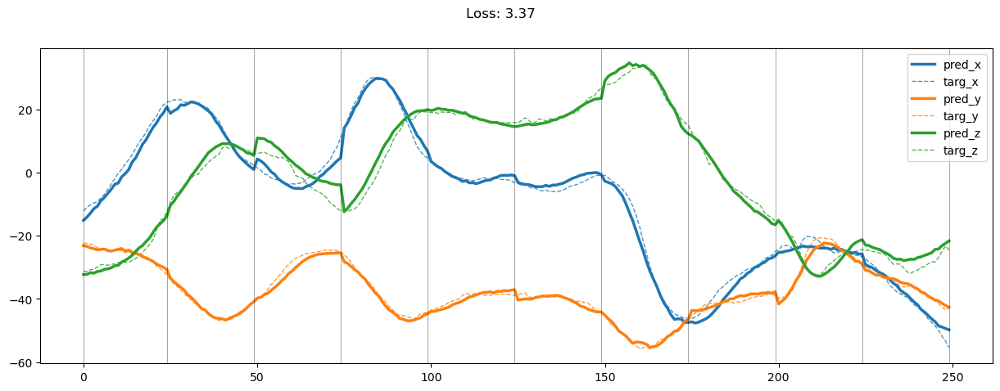

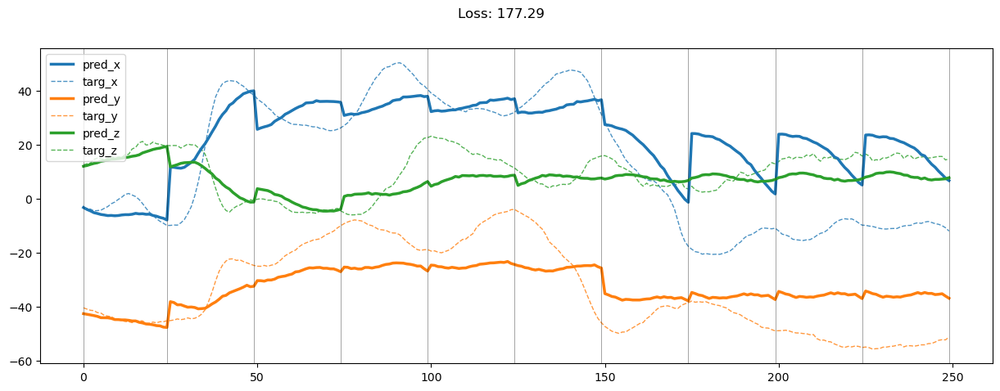

00749: train pred loss:  2.771, g loss:  3.197, d loss:  1.485
       valid pred loss:  121.488, g loss:  121.914, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00750: train pred loss:  2.736, g loss:  3.162, d loss:  1.485
       valid pred loss:  122.600, g loss:  123.026, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00751: train pred loss:  2.636, g loss:  3.062, d loss:  1.485
       valid pred loss:  131.740, g loss:  132.167, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.75it/s]


00752: train pred loss:  2.604, g loss:  3.030, d loss:  1.485
       valid pred loss:  127.669, g loss:  128.095, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00753: train pred loss:  2.592, g loss:  3.018, d loss:  1.485
       valid pred loss:  127.323, g loss:  127.749, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00754: train pred loss:  2.660, g loss:  3.086, d loss:  1.485
       valid pred loss:  132.554, g loss:  132.981, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00755: train pred loss:  2.589, g loss:  3.016, d loss:  1.485
       valid pred loss:  132.358, g loss:  132.784, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00756: train pred loss:  2.551, g loss:  2.977, d loss:  1.485
       valid pred loss:  127.077, g loss:  127.503, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00757: train pred loss:  2.568, g loss:  2.994, d loss:  1.485
       valid pred loss:  124.697, g loss:  125.124, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00758: train pred loss:  2.497, g loss:  2.923, d loss:  1.485
       valid pred loss:  119.019, g loss:  119.445, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00759: train pred loss:  2.536, g loss:  2.963, d loss:  1.485
       valid pred loss:  128.128, g loss:  128.554, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


00760: train pred loss:  2.544, g loss:  2.970, d loss:  1.485
       valid pred loss:  128.002, g loss:  128.429, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00761: train pred loss:  2.437, g loss:  2.863, d loss:  1.485
       valid pred loss:  128.634, g loss:  129.060, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00762: train pred loss:  2.518, g loss:  2.945, d loss:  1.485
       valid pred loss:  127.979, g loss:  128.405, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00763: train pred loss:  2.453, g loss:  2.879, d loss:  1.485
       valid pred loss:  125.798, g loss:  126.224, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00764: train pred loss:  2.492, g loss:  2.918, d loss:  1.485
       valid pred loss:  123.286, g loss:  123.712, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00765: train pred loss:  2.465, g loss:  2.891, d loss:  1.485
       valid pred loss:  125.893, g loss:  126.319, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00766: train pred loss:  2.442, g loss:  2.868, d loss:  1.485
       valid pred loss:  129.031, g loss:  129.457, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00767: train pred loss:  2.492, g loss:  2.918, d loss:  1.485
       valid pred loss:  130.185, g loss:  130.611, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00768: train pred loss:  2.425, g loss:  2.851, d loss:  1.485
       valid pred loss:  131.905, g loss:  132.331, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00769: train pred loss:  2.384, g loss:  2.810, d loss:  1.485
       valid pred loss:  127.869, g loss:  128.295, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


00770: train pred loss:  2.451, g loss:  2.876, d loss:  1.485
       valid pred loss:  128.389, g loss:  128.815, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.05it/s]


00771: train pred loss:  2.408, g loss:  2.834, d loss:  1.485
       valid pred loss:  127.128, g loss:  127.554, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00772: train pred loss:  2.381, g loss:  2.807, d loss:  1.485
       valid pred loss:  130.146, g loss:  130.572, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00773: train pred loss:  2.331, g loss:  2.757, d loss:  1.485
       valid pred loss:  124.490, g loss:  124.916, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00774: train pred loss:  2.320, g loss:  2.745, d loss:  1.485
       valid pred loss:  122.780, g loss:  123.206, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00775: train pred loss:  2.440, g loss:  2.865, d loss:  1.485
       valid pred loss:  123.214, g loss:  123.640, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00776: train pred loss:  2.338, g loss:  2.763, d loss:  1.485
       valid pred loss:  128.099, g loss:  128.524, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00777: train pred loss:  2.401, g loss:  2.826, d loss:  1.485
       valid pred loss:  130.920, g loss:  131.345, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00778: train pred loss:  2.379, g loss:  2.804, d loss:  1.486
       valid pred loss:  126.676, g loss:  127.101, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00779: train pred loss:  2.391, g loss:  2.816, d loss:  1.486
       valid pred loss:  125.438, g loss:  125.863, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00780: train pred loss:  2.453, g loss:  2.877, d loss:  1.486
       valid pred loss:  120.631, g loss:  121.056, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00781: train pred loss:  2.447, g loss:  2.871, d loss:  1.486
       valid pred loss:  128.235, g loss:  128.660, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


00782: train pred loss:  2.452, g loss:  2.877, d loss:  1.486
       valid pred loss:  124.724, g loss:  125.149, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00783: train pred loss:  2.460, g loss:  2.885, d loss:  1.486
       valid pred loss:  127.250, g loss:  127.674, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00784: train pred loss:  2.462, g loss:  2.887, d loss:  1.486
       valid pred loss:  129.606, g loss:  130.030, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00785: train pred loss:  2.448, g loss:  2.872, d loss:  1.486
       valid pred loss:  131.614, g loss:  132.039, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00786: train pred loss:  2.492, g loss:  2.916, d loss:  1.487
       valid pred loss:  132.754, g loss:  133.178, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00787: train pred loss:  2.467, g loss:  2.891, d loss:  1.487
       valid pred loss:  130.891, g loss:  131.315, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00788: train pred loss:  2.416, g loss:  2.840, d loss:  1.487
       valid pred loss:  135.811, g loss:  136.235, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00789: train pred loss:  2.477, g loss:  2.901, d loss:  1.487
       valid pred loss:  135.265, g loss:  135.688, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00790: train pred loss:  2.451, g loss:  2.875, d loss:  1.487
       valid pred loss:  134.595, g loss:  135.018, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00791: train pred loss:  2.436, g loss:  2.859, d loss:  1.487
       valid pred loss:  133.742, g loss:  134.165, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00792: train pred loss:  2.491, g loss:  2.914, d loss:  1.488
       valid pred loss:  139.732, g loss:  140.155, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00793: train pred loss:  2.468, g loss:  2.891, d loss:  1.488
       valid pred loss:  130.834, g loss:  131.257, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00794: train pred loss:  2.500, g loss:  2.923, d loss:  1.488
       valid pred loss:  129.067, g loss:  129.489, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00795: train pred loss:  2.512, g loss:  2.934, d loss:  1.488
       valid pred loss:  128.822, g loss:  129.244, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00796: train pred loss:  2.613, g loss:  3.036, d loss:  1.488
       valid pred loss:  127.005, g loss:  127.427, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00797: train pred loss:  2.592, g loss:  3.014, d loss:  1.488
       valid pred loss:  127.504, g loss:  127.926, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00798: train pred loss:  2.457, g loss:  2.878, d loss:  1.489
       valid pred loss:  128.904, g loss:  129.326, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


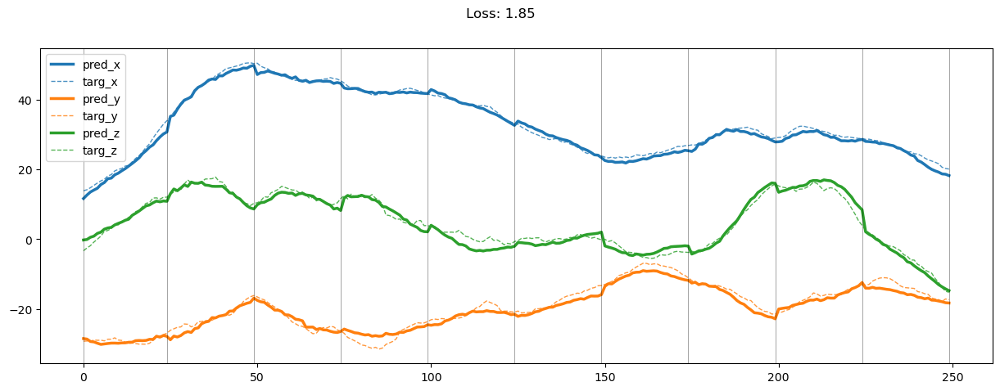

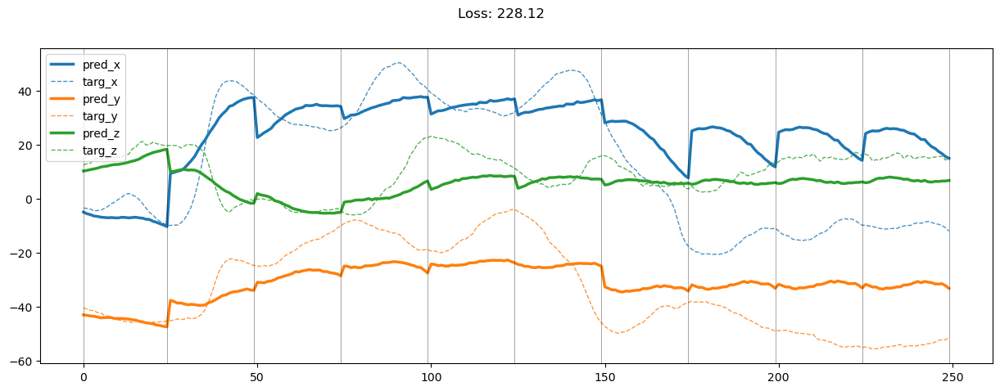

00799: train pred loss:  2.628, g loss:  3.049, d loss:  1.489
       valid pred loss:  128.417, g loss:  128.838, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00800: train pred loss:  2.574, g loss:  2.996, d loss:  1.489
       valid pred loss:  134.295, g loss:  134.716, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00801: train pred loss:  2.642, g loss:  3.063, d loss:  1.489
       valid pred loss:  129.640, g loss:  130.061, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00802: train pred loss:  2.546, g loss:  2.967, d loss:  1.489
       valid pred loss:  125.558, g loss:  125.979, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00803: train pred loss:  2.491, g loss:  2.912, d loss:  1.490
       valid pred loss:  130.965, g loss:  131.385, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00804: train pred loss:  2.534, g loss:  2.954, d loss:  1.490
       valid pred loss:  135.134, g loss:  135.554, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00805: train pred loss:  2.521, g loss:  2.941, d loss:  1.490
       valid pred loss:  129.438, g loss:  129.858, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00806: train pred loss:  2.475, g loss:  2.895, d loss:  1.490
       valid pred loss:  120.825, g loss:  121.244, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


00807: train pred loss:  2.411, g loss:  2.831, d loss:  1.491
       valid pred loss:  123.110, g loss:  123.530, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00808: train pred loss:  2.439, g loss:  2.858, d loss:  1.491
       valid pred loss:  128.619, g loss:  129.039, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00809: train pred loss:  2.365, g loss:  2.784, d loss:  1.491
       valid pred loss:  129.709, g loss:  130.128, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00810: train pred loss:  2.376, g loss:  2.795, d loss:  1.491
       valid pred loss:  135.048, g loss:  135.467, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00811: train pred loss:  2.372, g loss:  2.791, d loss:  1.491
       valid pred loss:  129.764, g loss:  130.183, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00812: train pred loss:  2.299, g loss:  2.718, d loss:  1.492
       valid pred loss:  124.592, g loss:  125.010, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00813: train pred loss:  2.356, g loss:  2.774, d loss:  1.492
       valid pred loss:  124.329, g loss:  124.747, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00814: train pred loss:  2.404, g loss:  2.821, d loss:  1.492
       valid pred loss:  126.769, g loss:  127.187, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00815: train pred loss:  2.311, g loss:  2.728, d loss:  1.493
       valid pred loss:  125.293, g loss:  125.711, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00816: train pred loss:  2.393, g loss:  2.811, d loss:  1.493
       valid pred loss:  131.457, g loss:  131.874, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00817: train pred loss:  2.387, g loss:  2.804, d loss:  1.493
       valid pred loss:  126.694, g loss:  127.111, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.31it/s]


00818: train pred loss:  2.482, g loss:  2.898, d loss:  1.493
       valid pred loss:  125.753, g loss:  126.170, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00819: train pred loss:  2.396, g loss:  2.812, d loss:  1.494
       valid pred loss:  127.626, g loss:  128.042, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00820: train pred loss:  2.356, g loss:  2.772, d loss:  1.494
       valid pred loss:  127.533, g loss:  127.949, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00821: train pred loss:  2.356, g loss:  2.772, d loss:  1.494
       valid pred loss:  127.302, g loss:  127.718, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00822: train pred loss:  2.300, g loss:  2.715, d loss:  1.494
       valid pred loss:  125.162, g loss:  125.577, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00823: train pred loss:  2.225, g loss:  2.640, d loss:  1.495
       valid pred loss:  125.628, g loss:  126.043, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00824: train pred loss:  2.199, g loss:  2.614, d loss:  1.495
       valid pred loss:  126.977, g loss:  127.392, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00825: train pred loss:  2.281, g loss:  2.695, d loss:  1.495
       valid pred loss:  127.007, g loss:  127.422, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00826: train pred loss:  2.348, g loss:  2.763, d loss:  1.495
       valid pred loss:  123.794, g loss:  124.208, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00827: train pred loss:  2.287, g loss:  2.701, d loss:  1.496
       valid pred loss:  127.698, g loss:  128.112, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00828: train pred loss:  2.369, g loss:  2.783, d loss:  1.496
       valid pred loss:  124.626, g loss:  125.040, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00829: train pred loss:  2.335, g loss:  2.749, d loss:  1.496
       valid pred loss:  120.516, g loss:  120.929, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00830: train pred loss:  2.236, g loss:  2.649, d loss:  1.496
       valid pred loss:  124.362, g loss:  124.775, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


00831: train pred loss:  2.282, g loss:  2.695, d loss:  1.497
       valid pred loss:  122.999, g loss:  123.412, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00832: train pred loss:  2.304, g loss:  2.716, d loss:  1.497
       valid pred loss:  125.635, g loss:  126.048, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00833: train pred loss:  2.313, g loss:  2.725, d loss:  1.497
       valid pred loss:  120.855, g loss:  121.268, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00834: train pred loss:  2.312, g loss:  2.724, d loss:  1.498
       valid pred loss:  130.090, g loss:  130.502, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00835: train pred loss:  2.339, g loss:  2.751, d loss:  1.498
       valid pred loss:  131.647, g loss:  132.059, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00836: train pred loss:  2.392, g loss:  2.803, d loss:  1.498
       valid pred loss:  128.066, g loss:  128.477, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00837: train pred loss:  2.470, g loss:  2.881, d loss:  1.498
       valid pred loss:  126.802, g loss:  127.213, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00838: train pred loss:  2.338, g loss:  2.749, d loss:  1.499
       valid pred loss:  122.691, g loss:  123.101, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00839: train pred loss:  2.291, g loss:  2.701, d loss:  1.499
       valid pred loss:  123.499, g loss:  123.910, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00840: train pred loss:  2.304, g loss:  2.715, d loss:  1.499
       valid pred loss:  128.760, g loss:  129.171, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00841: train pred loss:  2.242, g loss:  2.652, d loss:  1.500
       valid pred loss:  127.964, g loss:  128.374, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00842: train pred loss:  2.311, g loss:  2.721, d loss:  1.500
       valid pred loss:  128.732, g loss:  129.141, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00843: train pred loss:  2.184, g loss:  2.593, d loss:  1.500
       valid pred loss:  124.618, g loss:  125.027, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00844: train pred loss:  2.283, g loss:  2.692, d loss:  1.500
       valid pred loss:  122.905, g loss:  123.314, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00845: train pred loss:  2.207, g loss:  2.616, d loss:  1.501
       valid pred loss:  126.764, g loss:  127.173, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


00846: train pred loss:  2.238, g loss:  2.647, d loss:  1.501
       valid pred loss:  131.872, g loss:  132.280, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00847: train pred loss:  2.231, g loss:  2.639, d loss:  1.501
       valid pred loss:  127.673, g loss:  128.081, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00848: train pred loss:  2.223, g loss:  2.631, d loss:  1.501
       valid pred loss:  124.021, g loss:  124.429, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


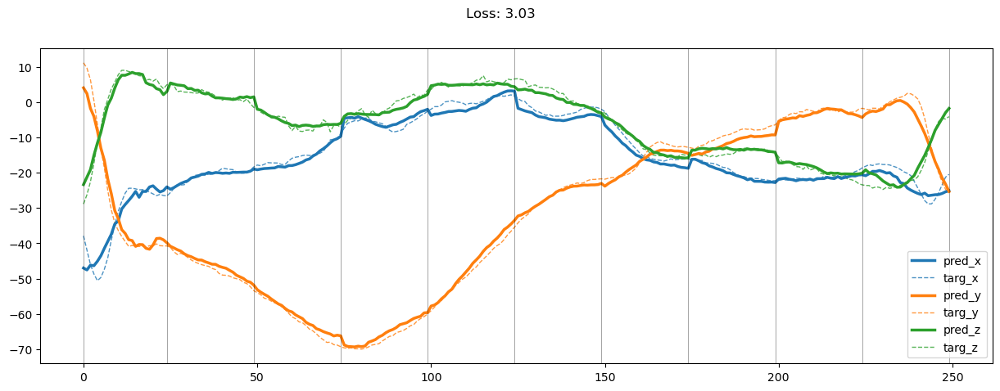

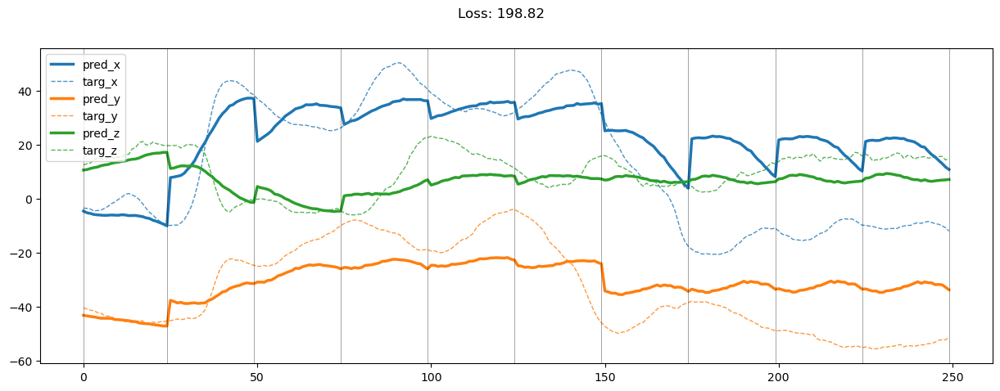

00849: train pred loss:  2.249, g loss:  2.657, d loss:  1.502
       valid pred loss:  129.394, g loss:  129.802, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00850: train pred loss:  2.314, g loss:  2.722, d loss:  1.502
       valid pred loss:  126.969, g loss:  127.377, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00851: train pred loss:  2.201, g loss:  2.608, d loss:  1.502
       valid pred loss:  120.327, g loss:  120.734, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00852: train pred loss:  2.292, g loss:  2.699, d loss:  1.503
       valid pred loss:  123.641, g loss:  124.048, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00853: train pred loss:  2.166, g loss:  2.572, d loss:  1.503
       valid pred loss:  118.920, g loss:  119.327, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00854: train pred loss:  2.207, g loss:  2.613, d loss:  1.503
       valid pred loss:  119.716, g loss:  120.123, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00855: train pred loss:  2.307, g loss:  2.714, d loss:  1.503
       valid pred loss:  123.087, g loss:  123.494, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00856: train pred loss:  2.250, g loss:  2.656, d loss:  1.504
       valid pred loss:  123.590, g loss:  123.996, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00857: train pred loss:  2.277, g loss:  2.683, d loss:  1.504
       valid pred loss:  127.682, g loss:  128.088, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


00858: train pred loss:  2.267, g loss:  2.672, d loss:  1.504
       valid pred loss:  126.970, g loss:  127.375, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00859: train pred loss:  2.268, g loss:  2.674, d loss:  1.504
       valid pred loss:  128.019, g loss:  128.424, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00860: train pred loss:  2.270, g loss:  2.675, d loss:  1.505
       valid pred loss:  130.976, g loss:  131.381, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00861: train pred loss:  2.270, g loss:  2.674, d loss:  1.505
       valid pred loss:  135.106, g loss:  135.511, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00862: train pred loss:  2.166, g loss:  2.570, d loss:  1.505
       valid pred loss:  128.461, g loss:  128.866, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00863: train pred loss:  2.154, g loss:  2.558, d loss:  1.505
       valid pred loss:  127.265, g loss:  127.669, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


00864: train pred loss:  2.177, g loss:  2.581, d loss:  1.506
       valid pred loss:  131.123, g loss:  131.527, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.50it/s]


00865: train pred loss:  2.213, g loss:  2.617, d loss:  1.506
       valid pred loss:  133.635, g loss:  134.039, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00866: train pred loss:  2.209, g loss:  2.612, d loss:  1.506
       valid pred loss:  130.312, g loss:  130.716, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00867: train pred loss:  2.297, g loss:  2.700, d loss:  1.506
       valid pred loss:  128.527, g loss:  128.931, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00868: train pred loss:  2.248, g loss:  2.652, d loss:  1.506
       valid pred loss:  126.173, g loss:  126.576, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


00869: train pred loss:  2.308, g loss:  2.711, d loss:  1.507
       valid pred loss:  127.614, g loss:  128.016, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00870: train pred loss:  2.215, g loss:  2.618, d loss:  1.507
       valid pred loss:  127.328, g loss:  127.731, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00871: train pred loss:  2.231, g loss:  2.634, d loss:  1.507
       valid pred loss:  124.352, g loss:  124.755, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


00872: train pred loss:  2.232, g loss:  2.634, d loss:  1.507
       valid pred loss:  128.276, g loss:  128.678, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.02it/s]


00873: train pred loss:  2.251, g loss:  2.653, d loss:  1.507
       valid pred loss:  136.088, g loss:  136.490, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


00874: train pred loss:  2.258, g loss:  2.660, d loss:  1.508
       valid pred loss:  138.840, g loss:  139.242, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


00875: train pred loss:  2.241, g loss:  2.642, d loss:  1.508
       valid pred loss:  131.010, g loss:  131.412, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00876: train pred loss:  2.230, g loss:  2.632, d loss:  1.508
       valid pred loss:  131.329, g loss:  131.730, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00877: train pred loss:  2.300, g loss:  2.702, d loss:  1.508
       valid pred loss:  124.166, g loss:  124.567, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00878: train pred loss:  2.221, g loss:  2.623, d loss:  1.508
       valid pred loss:  122.069, g loss:  122.470, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00879: train pred loss:  2.178, g loss:  2.579, d loss:  1.508
       valid pred loss:  131.041, g loss:  131.442, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00880: train pred loss:  2.236, g loss:  2.637, d loss:  1.509
       valid pred loss:  125.764, g loss:  126.165, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.44it/s]


00881: train pred loss:  2.133, g loss:  2.534, d loss:  1.509
       valid pred loss:  127.330, g loss:  127.730, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.59it/s]


00882: train pred loss:  2.207, g loss:  2.608, d loss:  1.509
       valid pred loss:  136.656, g loss:  137.057, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00883: train pred loss:  2.130, g loss:  2.531, d loss:  1.509
       valid pred loss:  127.348, g loss:  127.748, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00884: train pred loss:  2.127, g loss:  2.527, d loss:  1.509
       valid pred loss:  122.066, g loss:  122.466, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00885: train pred loss:  2.134, g loss:  2.534, d loss:  1.509
       valid pred loss:  126.049, g loss:  126.449, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00886: train pred loss:  1.997, g loss:  2.397, d loss:  1.509
       valid pred loss:  131.049, g loss:  131.450, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00887: train pred loss:  2.040, g loss:  2.440, d loss:  1.510
       valid pred loss:  127.000, g loss:  127.400, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00888: train pred loss:  2.028, g loss:  2.428, d loss:  1.510
       valid pred loss:  125.266, g loss:  125.666, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00889: train pred loss:  2.113, g loss:  2.513, d loss:  1.510
       valid pred loss:  133.990, g loss:  134.390, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00890: train pred loss:  2.052, g loss:  2.452, d loss:  1.510
       valid pred loss:  129.960, g loss:  130.360, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00891: train pred loss:  2.092, g loss:  2.492, d loss:  1.510
       valid pred loss:  125.032, g loss:  125.432, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00892: train pred loss:  2.075, g loss:  2.474, d loss:  1.510
       valid pred loss:  124.218, g loss:  124.618, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00893: train pred loss:  2.073, g loss:  2.473, d loss:  1.510
       valid pred loss:  124.054, g loss:  124.453, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


00894: train pred loss:  2.151, g loss:  2.551, d loss:  1.510
       valid pred loss:  127.601, g loss:  128.000, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00895: train pred loss:  2.061, g loss:  2.460, d loss:  1.510
       valid pred loss:  128.346, g loss:  128.746, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00896: train pred loss:  1.994, g loss:  2.394, d loss:  1.510
       valid pred loss:  129.843, g loss:  130.243, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00897: train pred loss:  2.023, g loss:  2.423, d loss:  1.510
       valid pred loss:  122.585, g loss:  122.984, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00898: train pred loss:  2.035, g loss:  2.434, d loss:  1.510
       valid pred loss:  127.500, g loss:  127.900, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


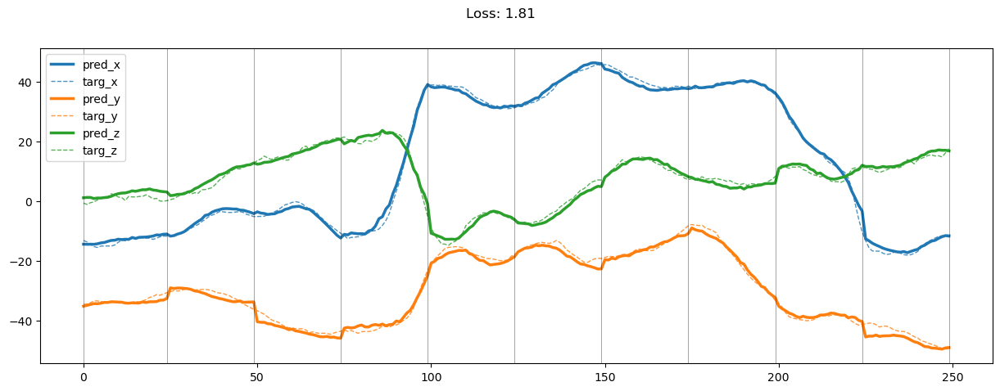

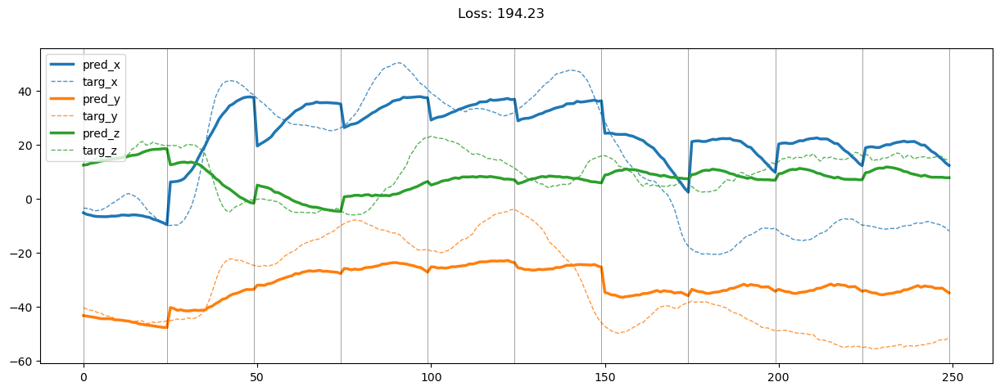

00899: train pred loss:  2.032, g loss:  2.432, d loss:  1.510
       valid pred loss:  126.217, g loss:  126.616, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00900: train pred loss:  2.014, g loss:  2.413, d loss:  1.510
       valid pred loss:  126.519, g loss:  126.918, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00901: train pred loss:  1.975, g loss:  2.374, d loss:  1.510
       valid pred loss:  130.983, g loss:  131.383, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00902: train pred loss:  2.019, g loss:  2.418, d loss:  1.510
       valid pred loss:  129.461, g loss:  129.861, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00903: train pred loss:  1.982, g loss:  2.381, d loss:  1.510
       valid pred loss:  133.368, g loss:  133.767, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00904: train pred loss:  2.023, g loss:  2.423, d loss:  1.510
       valid pred loss:  132.734, g loss:  133.133, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00905: train pred loss:  2.104, g loss:  2.504, d loss:  1.510
       valid pred loss:  132.482, g loss:  132.881, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00906: train pred loss:  2.152, g loss:  2.551, d loss:  1.510
       valid pred loss:  130.642, g loss:  131.042, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00907: train pred loss:  2.111, g loss:  2.510, d loss:  1.510
       valid pred loss:  131.250, g loss:  131.649, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00908: train pred loss:  2.121, g loss:  2.521, d loss:  1.510
       valid pred loss:  125.631, g loss:  126.031, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00909: train pred loss:  2.081, g loss:  2.481, d loss:  1.510
       valid pred loss:  126.591, g loss:  126.991, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00910: train pred loss:  2.114, g loss:  2.513, d loss:  1.510
       valid pred loss:  130.206, g loss:  130.606, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00911: train pred loss:  2.050, g loss:  2.449, d loss:  1.510
       valid pred loss:  130.539, g loss:  130.939, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00912: train pred loss:  2.050, g loss:  2.450, d loss:  1.510
       valid pred loss:  127.944, g loss:  128.344, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.41it/s]


00913: train pred loss:  1.956, g loss:  2.356, d loss:  1.510
       valid pred loss:  126.299, g loss:  126.699, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


00914: train pred loss:  2.052, g loss:  2.451, d loss:  1.510
       valid pred loss:  119.578, g loss:  119.978, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


00915: train pred loss:  1.959, g loss:  2.359, d loss:  1.510
       valid pred loss:  120.229, g loss:  120.629, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00916: train pred loss:  2.013, g loss:  2.413, d loss:  1.510
       valid pred loss:  126.241, g loss:  126.641, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00917: train pred loss:  1.963, g loss:  2.363, d loss:  1.510
       valid pred loss:  123.249, g loss:  123.649, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00918: train pred loss:  1.986, g loss:  2.386, d loss:  1.509
       valid pred loss:  123.452, g loss:  123.853, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00919: train pred loss:  1.940, g loss:  2.340, d loss:  1.509
       valid pred loss:  127.721, g loss:  128.122, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00920: train pred loss:  1.975, g loss:  2.376, d loss:  1.509
       valid pred loss:  122.610, g loss:  123.011, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00921: train pred loss:  1.924, g loss:  2.324, d loss:  1.509
       valid pred loss:  124.348, g loss:  124.749, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00922: train pred loss:  1.887, g loss:  2.288, d loss:  1.509
       valid pred loss:  120.748, g loss:  121.149, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00923: train pred loss:  1.957, g loss:  2.358, d loss:  1.509
       valid pred loss:  121.081, g loss:  121.482, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


00924: train pred loss:  1.957, g loss:  2.358, d loss:  1.509
       valid pred loss:  123.861, g loss:  124.262, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00925: train pred loss:  1.924, g loss:  2.326, d loss:  1.508
       valid pred loss:  135.056, g loss:  135.458, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


00926: train pred loss:  1.952, g loss:  2.354, d loss:  1.508
       valid pred loss:  130.193, g loss:  130.594, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00927: train pred loss:  1.941, g loss:  2.342, d loss:  1.508
       valid pred loss:  127.723, g loss:  128.124, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


00928: train pred loss:  2.017, g loss:  2.419, d loss:  1.508
       valid pred loss:  124.251, g loss:  124.652, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.44it/s]


00929: train pred loss:  1.933, g loss:  2.335, d loss:  1.508
       valid pred loss:  132.086, g loss:  132.489, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.29it/s]


00930: train pred loss:  2.006, g loss:  2.408, d loss:  1.507
       valid pred loss:  126.791, g loss:  127.194, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


00931: train pred loss:  1.910, g loss:  2.312, d loss:  1.507
       valid pred loss:  132.475, g loss:  132.878, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


00932: train pred loss:  1.854, g loss:  2.256, d loss:  1.507
       valid pred loss:  128.395, g loss:  128.797, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00933: train pred loss:  1.877, g loss:  2.280, d loss:  1.507
       valid pred loss:  128.305, g loss:  128.708, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00934: train pred loss:  1.874, g loss:  2.277, d loss:  1.507
       valid pred loss:  129.423, g loss:  129.826, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


00935: train pred loss:  1.912, g loss:  2.315, d loss:  1.506
       valid pred loss:  123.368, g loss:  123.771, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00936: train pred loss:  1.966, g loss:  2.369, d loss:  1.506
       valid pred loss:  126.932, g loss:  127.335, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00937: train pred loss:  2.009, g loss:  2.412, d loss:  1.506
       valid pred loss:  129.024, g loss:  129.428, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00938: train pred loss:  1.971, g loss:  2.375, d loss:  1.506
       valid pred loss:  119.861, g loss:  120.265, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00939: train pred loss:  1.902, g loss:  2.307, d loss:  1.505
       valid pred loss:  130.257, g loss:  130.661, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.86it/s]


00940: train pred loss:  1.882, g loss:  2.287, d loss:  1.505
       valid pred loss:  127.400, g loss:  127.805, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00941: train pred loss:  1.966, g loss:  2.371, d loss:  1.505
       valid pred loss:  125.602, g loss:  126.007, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00942: train pred loss:  1.955, g loss:  2.360, d loss:  1.505
       valid pred loss:  128.867, g loss:  129.272, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00943: train pred loss:  1.894, g loss:  2.299, d loss:  1.504
       valid pred loss:  127.493, g loss:  127.898, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00944: train pred loss:  1.961, g loss:  2.367, d loss:  1.504
       valid pred loss:  128.066, g loss:  128.472, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00945: train pred loss:  1.972, g loss:  2.378, d loss:  1.504
       valid pred loss:  126.530, g loss:  126.936, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


00946: train pred loss:  2.101, g loss:  2.507, d loss:  1.504
       valid pred loss:  121.569, g loss:  121.975, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00947: train pred loss:  2.170, g loss:  2.577, d loss:  1.503
       valid pred loss:  125.051, g loss:  125.457, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


00948: train pred loss:  2.137, g loss:  2.544, d loss:  1.503
       valid pred loss:  122.377, g loss:  122.784, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


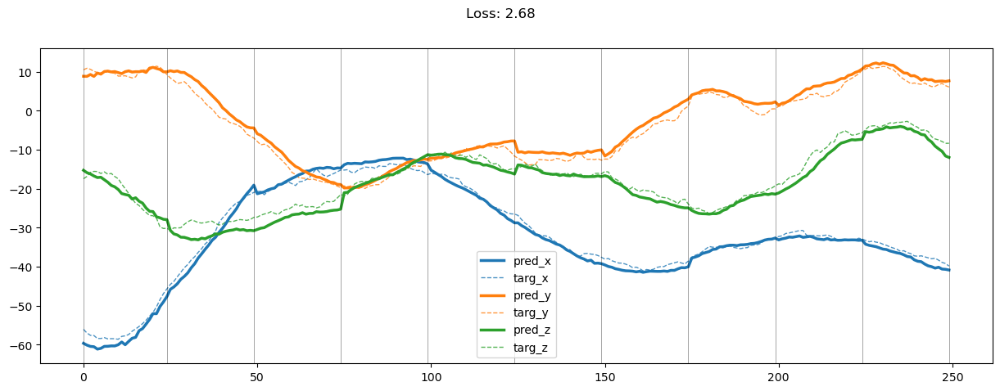

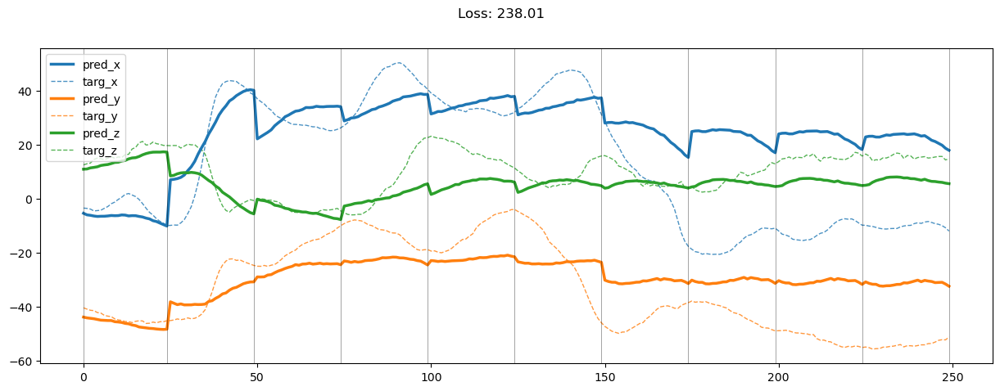

00949: train pred loss:  2.102, g loss:  2.509, d loss:  1.503
       valid pred loss:  126.589, g loss:  126.996, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00950: train pred loss:  2.089, g loss:  2.496, d loss:  1.502
       valid pred loss:  126.472, g loss:  126.879, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00951: train pred loss:  2.050, g loss:  2.458, d loss:  1.502
       valid pred loss:  128.368, g loss:  128.776, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00952: train pred loss:  2.118, g loss:  2.526, d loss:  1.502
       valid pred loss:  124.599, g loss:  125.007, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


00953: train pred loss:  2.110, g loss:  2.518, d loss:  1.501
       valid pred loss:  122.537, g loss:  122.946, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00954: train pred loss:  1.992, g loss:  2.401, d loss:  1.501
       valid pred loss:  123.491, g loss:  123.900, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00955: train pred loss:  1.937, g loss:  2.345, d loss:  1.501
       valid pred loss:  127.233, g loss:  127.642, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.09it/s]


00956: train pred loss:  1.963, g loss:  2.372, d loss:  1.501
       valid pred loss:  127.556, g loss:  127.965, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00957: train pred loss:  1.993, g loss:  2.403, d loss:  1.500
       valid pred loss:  124.575, g loss:  124.985, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00958: train pred loss:  1.968, g loss:  2.378, d loss:  1.500
       valid pred loss:  128.459, g loss:  128.869, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00959: train pred loss:  1.950, g loss:  2.360, d loss:  1.500
       valid pred loss:  129.459, g loss:  129.869, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00960: train pred loss:  1.890, g loss:  2.300, d loss:  1.499
       valid pred loss:  125.308, g loss:  125.718, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00961: train pred loss:  1.888, g loss:  2.299, d loss:  1.499
       valid pred loss:  124.055, g loss:  124.466, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.48it/s]


00962: train pred loss:  1.919, g loss:  2.330, d loss:  1.499
       valid pred loss:  124.659, g loss:  125.071, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00963: train pred loss:  1.951, g loss:  2.363, d loss:  1.498
       valid pred loss:  121.058, g loss:  121.469, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00964: train pred loss:  1.910, g loss:  2.321, d loss:  1.498
       valid pred loss:  126.525, g loss:  126.936, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


00965: train pred loss:  1.858, g loss:  2.270, d loss:  1.498
       valid pred loss:  121.971, g loss:  122.383, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00966: train pred loss:  1.874, g loss:  2.286, d loss:  1.498
       valid pred loss:  123.136, g loss:  123.548, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00967: train pred loss:  1.795, g loss:  2.207, d loss:  1.497
       valid pred loss:  125.086, g loss:  125.499, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00968: train pred loss:  1.774, g loss:  2.187, d loss:  1.497
       valid pred loss:  125.186, g loss:  125.599, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00969: train pred loss:  1.881, g loss:  2.294, d loss:  1.497
       valid pred loss:  125.734, g loss:  126.147, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


00970: train pred loss:  1.884, g loss:  2.298, d loss:  1.496
       valid pred loss:  133.412, g loss:  133.826, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00971: train pred loss:  1.851, g loss:  2.265, d loss:  1.496
       valid pred loss:  129.228, g loss:  129.642, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00972: train pred loss:  1.907, g loss:  2.321, d loss:  1.496
       valid pred loss:  130.502, g loss:  130.916, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.19it/s]


00973: train pred loss:  1.875, g loss:  2.289, d loss:  1.496
       valid pred loss:  127.808, g loss:  128.223, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00974: train pred loss:  1.909, g loss:  2.324, d loss:  1.495
       valid pred loss:  126.489, g loss:  126.904, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


00975: train pred loss:  1.900, g loss:  2.315, d loss:  1.495
       valid pred loss:  124.755, g loss:  125.170, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


00976: train pred loss:  1.888, g loss:  2.303, d loss:  1.495
       valid pred loss:  130.263, g loss:  130.678, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00977: train pred loss:  1.870, g loss:  2.285, d loss:  1.494
       valid pred loss:  123.875, g loss:  124.291, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


00978: train pred loss:  1.856, g loss:  2.272, d loss:  1.494
       valid pred loss:  122.508, g loss:  122.924, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.74it/s]


00979: train pred loss:  1.858, g loss:  2.274, d loss:  1.494
       valid pred loss:  126.655, g loss:  127.072, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


00980: train pred loss:  1.901, g loss:  2.317, d loss:  1.494
       valid pred loss:  128.286, g loss:  128.702, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00981: train pred loss:  1.928, g loss:  2.344, d loss:  1.493
       valid pred loss:  130.126, g loss:  130.542, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


00982: train pred loss:  1.888, g loss:  2.304, d loss:  1.493
       valid pred loss:  132.633, g loss:  133.050, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


00983: train pred loss:  1.902, g loss:  2.319, d loss:  1.493
       valid pred loss:  128.435, g loss:  128.852, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00984: train pred loss:  1.911, g loss:  2.329, d loss:  1.493
       valid pred loss:  121.608, g loss:  122.025, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00985: train pred loss:  1.861, g loss:  2.279, d loss:  1.493
       valid pred loss:  131.231, g loss:  131.648, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


00986: train pred loss:  1.888, g loss:  2.306, d loss:  1.492
       valid pred loss:  130.542, g loss:  130.959, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


00987: train pred loss:  1.965, g loss:  2.383, d loss:  1.492
       valid pred loss:  128.904, g loss:  129.322, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


00988: train pred loss:  1.907, g loss:  2.326, d loss:  1.492
       valid pred loss:  128.158, g loss:  128.577, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


00989: train pred loss:  1.833, g loss:  2.251, d loss:  1.492
       valid pred loss:  134.107, g loss:  134.525, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


00990: train pred loss:  1.783, g loss:  2.202, d loss:  1.492
       valid pred loss:  132.331, g loss:  132.749, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00991: train pred loss:  1.817, g loss:  2.236, d loss:  1.491
       valid pred loss:  137.134, g loss:  137.553, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


00992: train pred loss:  1.791, g loss:  2.210, d loss:  1.491
       valid pred loss:  137.037, g loss:  137.456, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


00993: train pred loss:  1.821, g loss:  2.240, d loss:  1.491
       valid pred loss:  130.034, g loss:  130.453, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


00994: train pred loss:  1.842, g loss:  2.261, d loss:  1.491
       valid pred loss:  130.496, g loss:  130.916, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


00995: train pred loss:  1.786, g loss:  2.206, d loss:  1.491
       valid pred loss:  127.751, g loss:  128.170, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


00996: train pred loss:  1.749, g loss:  2.168, d loss:  1.491
       valid pred loss:  126.429, g loss:  126.849, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


00997: train pred loss:  1.728, g loss:  2.148, d loss:  1.491
       valid pred loss:  134.949, g loss:  135.368, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


00998: train pred loss:  1.777, g loss:  2.196, d loss:  1.490
       valid pred loss:  136.464, g loss:  136.884, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


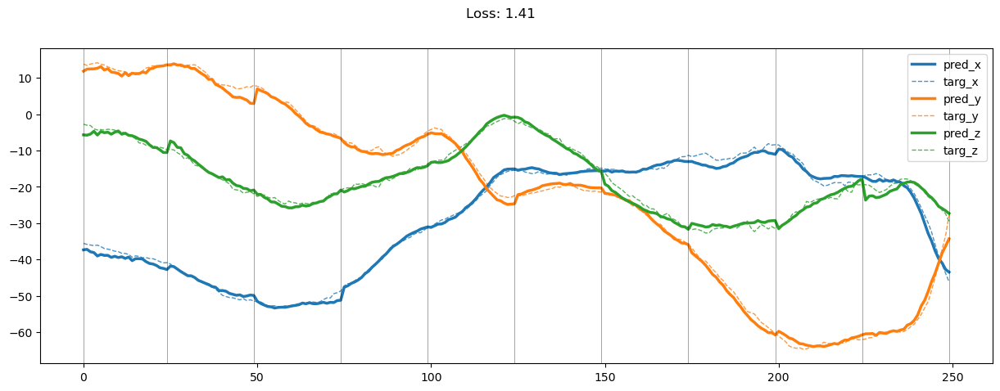

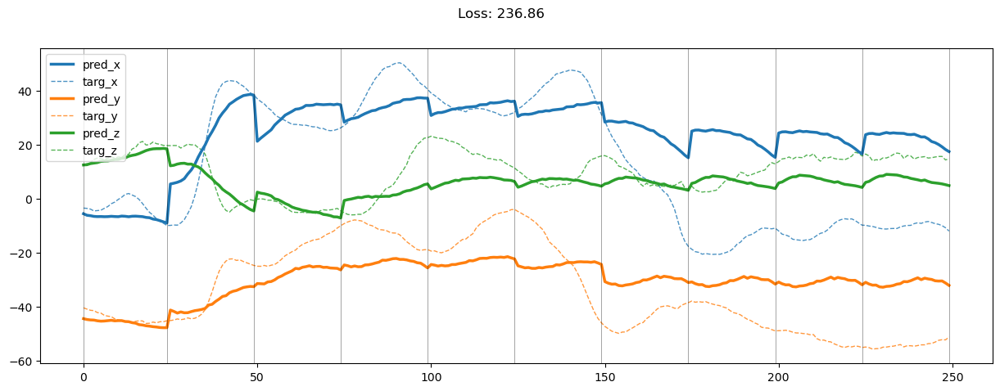

00999: train pred loss:  1.714, g loss:  2.134, d loss:  1.490
       valid pred loss:  132.037, g loss:  132.457, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01000: train pred loss:  1.693, g loss:  2.113, d loss:  1.490
       valid pred loss:  132.458, g loss:  132.878, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01001: train pred loss:  1.741, g loss:  2.161, d loss:  1.490
       valid pred loss:  133.955, g loss:  134.375, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01002: train pred loss:  1.738, g loss:  2.158, d loss:  1.490
       valid pred loss:  132.022, g loss:  132.442, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01003: train pred loss:  1.797, g loss:  2.217, d loss:  1.490
       valid pred loss:  131.105, g loss:  131.526, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01004: train pred loss:  1.755, g loss:  2.175, d loss:  1.490
       valid pred loss:  135.277, g loss:  135.698, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01005: train pred loss:  1.731, g loss:  2.151, d loss:  1.490
       valid pred loss:  137.524, g loss:  137.944, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01006: train pred loss:  1.739, g loss:  2.159, d loss:  1.490
       valid pred loss:  134.423, g loss:  134.844, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


01007: train pred loss:  1.772, g loss:  2.193, d loss:  1.490
       valid pred loss:  130.731, g loss:  131.152, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01008: train pred loss:  1.748, g loss:  2.168, d loss:  1.490
       valid pred loss:  136.545, g loss:  136.965, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01009: train pred loss:  1.799, g loss:  2.219, d loss:  1.490
       valid pred loss:  131.187, g loss:  131.607, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01010: train pred loss:  1.809, g loss:  2.229, d loss:  1.490
       valid pred loss:  128.411, g loss:  128.831, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01011: train pred loss:  1.843, g loss:  2.263, d loss:  1.490
       valid pred loss:  122.447, g loss:  122.867, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01012: train pred loss:  1.834, g loss:  2.255, d loss:  1.490
       valid pred loss:  127.990, g loss:  128.410, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01013: train pred loss:  1.887, g loss:  2.307, d loss:  1.490
       valid pred loss:  124.697, g loss:  125.117, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01014: train pred loss:  1.814, g loss:  2.234, d loss:  1.490
       valid pred loss:  128.620, g loss:  129.040, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01015: train pred loss:  1.845, g loss:  2.265, d loss:  1.490
       valid pred loss:  133.642, g loss:  134.061, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01016: train pred loss:  1.852, g loss:  2.272, d loss:  1.491
       valid pred loss:  125.471, g loss:  125.891, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01017: train pred loss:  1.806, g loss:  2.226, d loss:  1.491
       valid pred loss:  117.433, g loss:  117.853, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01018: train pred loss:  1.791, g loss:  2.210, d loss:  1.491
       valid pred loss:  125.048, g loss:  125.467, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01019: train pred loss:  1.755, g loss:  2.174, d loss:  1.491
       valid pred loss:  124.358, g loss:  124.777, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


01020: train pred loss:  1.731, g loss:  2.150, d loss:  1.491
       valid pred loss:  129.241, g loss:  129.660, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01021: train pred loss:  1.720, g loss:  2.139, d loss:  1.491
       valid pred loss:  132.328, g loss:  132.746, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01022: train pred loss:  1.843, g loss:  2.261, d loss:  1.491
       valid pred loss:  131.788, g loss:  132.207, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01023: train pred loss:  1.779, g loss:  2.197, d loss:  1.492
       valid pred loss:  127.306, g loss:  127.725, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


01024: train pred loss:  1.787, g loss:  2.205, d loss:  1.492
       valid pred loss:  133.527, g loss:  133.946, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01025: train pred loss:  1.761, g loss:  2.179, d loss:  1.492
       valid pred loss:  134.914, g loss:  135.332, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01026: train pred loss:  1.678, g loss:  2.095, d loss:  1.492
       valid pred loss:  141.033, g loss:  141.450, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01027: train pred loss:  1.731, g loss:  2.148, d loss:  1.493
       valid pred loss:  141.060, g loss:  141.477, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01028: train pred loss:  1.708, g loss:  2.125, d loss:  1.493
       valid pred loss:  136.562, g loss:  136.979, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01029: train pred loss:  1.700, g loss:  2.117, d loss:  1.493
       valid pred loss:  138.899, g loss:  139.315, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01030: train pred loss:  1.723, g loss:  2.140, d loss:  1.493
       valid pred loss:  134.663, g loss:  135.079, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01031: train pred loss:  1.836, g loss:  2.252, d loss:  1.494
       valid pred loss:  135.150, g loss:  135.566, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01032: train pred loss:  1.810, g loss:  2.226, d loss:  1.494
       valid pred loss:  134.257, g loss:  134.673, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.10it/s]


01033: train pred loss:  1.801, g loss:  2.216, d loss:  1.494
       valid pred loss:  132.344, g loss:  132.759, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01034: train pred loss:  1.808, g loss:  2.223, d loss:  1.494
       valid pred loss:  137.179, g loss:  137.594, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01035: train pred loss:  1.982, g loss:  2.397, d loss:  1.495
       valid pred loss:  136.919, g loss:  137.333, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01036: train pred loss:  2.078, g loss:  2.492, d loss:  1.495
       valid pred loss:  133.976, g loss:  134.390, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01037: train pred loss:  1.847, g loss:  2.262, d loss:  1.495
       valid pred loss:  134.939, g loss:  135.353, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01038: train pred loss:  1.831, g loss:  2.245, d loss:  1.496
       valid pred loss:  135.449, g loss:  135.863, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01039: train pred loss:  1.859, g loss:  2.272, d loss:  1.496
       valid pred loss:  127.796, g loss:  128.209, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01040: train pred loss:  1.849, g loss:  2.263, d loss:  1.497
       valid pred loss:  130.666, g loss:  131.079, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01041: train pred loss:  1.840, g loss:  2.253, d loss:  1.497
       valid pred loss:  125.481, g loss:  125.893, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01042: train pred loss:  1.953, g loss:  2.365, d loss:  1.497
       valid pred loss:  123.170, g loss:  123.582, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01043: train pred loss:  1.920, g loss:  2.332, d loss:  1.498
       valid pred loss:  127.724, g loss:  128.135, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01044: train pred loss:  1.879, g loss:  2.291, d loss:  1.498
       valid pred loss:  134.567, g loss:  134.979, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01045: train pred loss:  1.864, g loss:  2.275, d loss:  1.499
       valid pred loss:  131.795, g loss:  132.206, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


01046: train pred loss:  1.846, g loss:  2.256, d loss:  1.499
       valid pred loss:  140.669, g loss:  141.080, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01047: train pred loss:  1.774, g loss:  2.184, d loss:  1.499
       valid pred loss:  136.445, g loss:  136.855, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


01048: train pred loss:  1.787, g loss:  2.196, d loss:  1.500
       valid pred loss:  132.946, g loss:  133.355, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


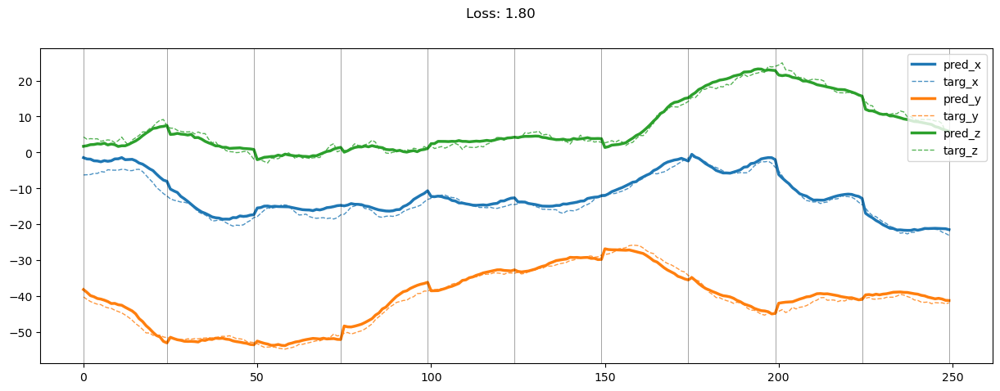

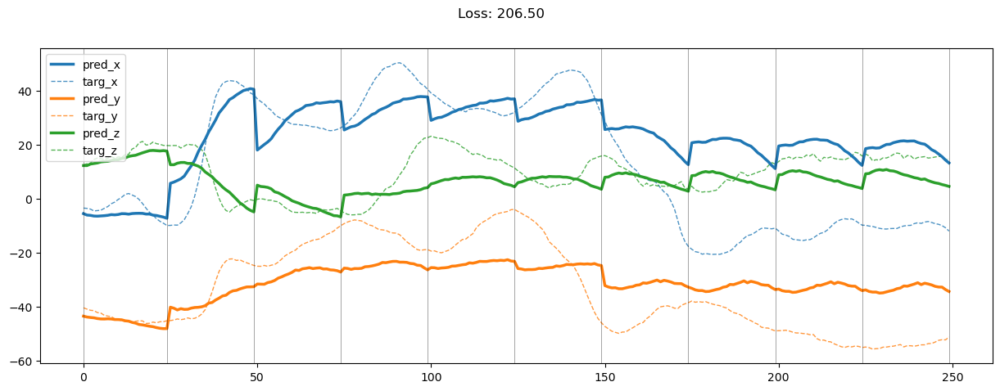

01049: train pred loss:  1.728, g loss:  2.138, d loss:  1.500
       valid pred loss:  134.157, g loss:  134.566, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.67it/s]


01050: train pred loss:  1.695, g loss:  2.104, d loss:  1.501
       valid pred loss:  132.670, g loss:  133.079, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01051: train pred loss:  1.653, g loss:  2.062, d loss:  1.501
       valid pred loss:  127.627, g loss:  128.035, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01052: train pred loss:  1.659, g loss:  2.067, d loss:  1.502
       valid pred loss:  122.684, g loss:  123.091, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01053: train pred loss:  1.644, g loss:  2.052, d loss:  1.502
       valid pred loss:  125.476, g loss:  125.883, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01054: train pred loss:  1.656, g loss:  2.063, d loss:  1.503
       valid pred loss:  129.697, g loss:  130.104, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01055: train pred loss:  1.648, g loss:  2.054, d loss:  1.503
       valid pred loss:  129.579, g loss:  129.985, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01056: train pred loss:  1.690, g loss:  2.096, d loss:  1.504
       valid pred loss:  129.820, g loss:  130.226, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


01057: train pred loss:  1.652, g loss:  2.058, d loss:  1.504
       valid pred loss:  133.544, g loss:  133.949, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01058: train pred loss:  1.637, g loss:  2.043, d loss:  1.504
       valid pred loss:  136.019, g loss:  136.423, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01059: train pred loss:  1.622, g loss:  2.027, d loss:  1.505
       valid pred loss:  133.763, g loss:  134.167, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01060: train pred loss:  1.666, g loss:  2.070, d loss:  1.505
       valid pred loss:  126.268, g loss:  126.672, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01061: train pred loss:  1.697, g loss:  2.100, d loss:  1.506
       valid pred loss:  131.552, g loss:  131.956, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01062: train pred loss:  1.692, g loss:  2.096, d loss:  1.506
       valid pred loss:  133.154, g loss:  133.557, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01063: train pred loss:  1.692, g loss:  2.095, d loss:  1.507
       valid pred loss:  127.031, g loss:  127.434, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.70it/s]


01064: train pred loss:  1.719, g loss:  2.122, d loss:  1.507
       valid pred loss:  135.532, g loss:  135.935, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.80it/s]


01065: train pred loss:  1.732, g loss:  2.134, d loss:  1.508
       valid pred loss:  134.510, g loss:  134.912, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.73it/s]


01066: train pred loss:  1.704, g loss:  2.106, d loss:  1.508
       valid pred loss:  134.010, g loss:  134.411, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.79it/s]


01067: train pred loss:  1.664, g loss:  2.065, d loss:  1.508
       valid pred loss:  131.776, g loss:  132.177, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.87it/s]


01068: train pred loss:  1.709, g loss:  2.110, d loss:  1.509
       valid pred loss:  137.812, g loss:  138.213, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.17it/s]


01069: train pred loss:  1.653, g loss:  2.054, d loss:  1.509
       valid pred loss:  129.578, g loss:  129.978, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


01070: train pred loss:  1.672, g loss:  2.072, d loss:  1.510
       valid pred loss:  130.666, g loss:  131.066, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.89it/s]


01071: train pred loss:  1.731, g loss:  2.131, d loss:  1.510
       valid pred loss:  130.169, g loss:  130.568, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01072: train pred loss:  1.742, g loss:  2.141, d loss:  1.510
       valid pred loss:  129.205, g loss:  129.604, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01073: train pred loss:  1.619, g loss:  2.018, d loss:  1.511
       valid pred loss:  132.941, g loss:  133.340, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01074: train pred loss:  1.654, g loss:  2.053, d loss:  1.511
       valid pred loss:  138.506, g loss:  138.904, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01075: train pred loss:  1.626, g loss:  2.025, d loss:  1.512
       valid pred loss:  132.876, g loss:  133.274, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01076: train pred loss:  1.577, g loss:  1.975, d loss:  1.512
       valid pred loss:  128.172, g loss:  128.570, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01077: train pred loss:  1.629, g loss:  2.027, d loss:  1.512
       valid pred loss:  134.862, g loss:  135.260, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01078: train pred loss:  1.671, g loss:  2.068, d loss:  1.513
       valid pred loss:  133.259, g loss:  133.656, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01079: train pred loss:  1.621, g loss:  2.018, d loss:  1.513
       valid pred loss:  132.767, g loss:  133.163, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01080: train pred loss:  1.627, g loss:  2.024, d loss:  1.513
       valid pred loss:  138.475, g loss:  138.871, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01081: train pred loss:  1.635, g loss:  2.031, d loss:  1.513
       valid pred loss:  136.610, g loss:  137.006, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.25it/s]


01082: train pred loss:  1.643, g loss:  2.040, d loss:  1.514
       valid pred loss:  126.637, g loss:  127.033, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01083: train pred loss:  1.660, g loss:  2.056, d loss:  1.514
       valid pred loss:  128.894, g loss:  129.290, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01084: train pred loss:  1.669, g loss:  2.065, d loss:  1.514
       valid pred loss:  126.062, g loss:  126.458, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01085: train pred loss:  1.657, g loss:  2.053, d loss:  1.514
       valid pred loss:  132.598, g loss:  132.993, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01086: train pred loss:  1.618, g loss:  2.014, d loss:  1.515
       valid pred loss:  129.229, g loss:  129.624, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01087: train pred loss:  1.694, g loss:  2.089, d loss:  1.515
       valid pred loss:  132.071, g loss:  132.466, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


01088: train pred loss:  1.591, g loss:  1.986, d loss:  1.515
       valid pred loss:  137.597, g loss:  137.992, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01089: train pred loss:  1.600, g loss:  1.995, d loss:  1.515
       valid pred loss:  134.948, g loss:  135.343, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01090: train pred loss:  1.591, g loss:  1.986, d loss:  1.515
       valid pred loss:  128.902, g loss:  129.297, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01091: train pred loss:  1.614, g loss:  2.009, d loss:  1.515
       valid pred loss:  133.995, g loss:  134.390, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01092: train pred loss:  1.607, g loss:  2.001, d loss:  1.515
       valid pred loss:  134.576, g loss:  134.971, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01093: train pred loss:  1.626, g loss:  2.021, d loss:  1.515
       valid pred loss:  129.765, g loss:  130.160, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01094: train pred loss:  1.619, g loss:  2.014, d loss:  1.515
       valid pred loss:  131.010, g loss:  131.405, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


01095: train pred loss:  1.635, g loss:  2.030, d loss:  1.515
       valid pred loss:  133.745, g loss:  134.140, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01096: train pred loss:  1.624, g loss:  2.019, d loss:  1.515
       valid pred loss:  128.490, g loss:  128.885, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.73it/s]


01097: train pred loss:  1.658, g loss:  2.053, d loss:  1.515
       valid pred loss:  137.385, g loss:  137.780, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.22it/s]


01098: train pred loss:  1.617, g loss:  2.012, d loss:  1.515
       valid pred loss:  137.277, g loss:  137.672, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


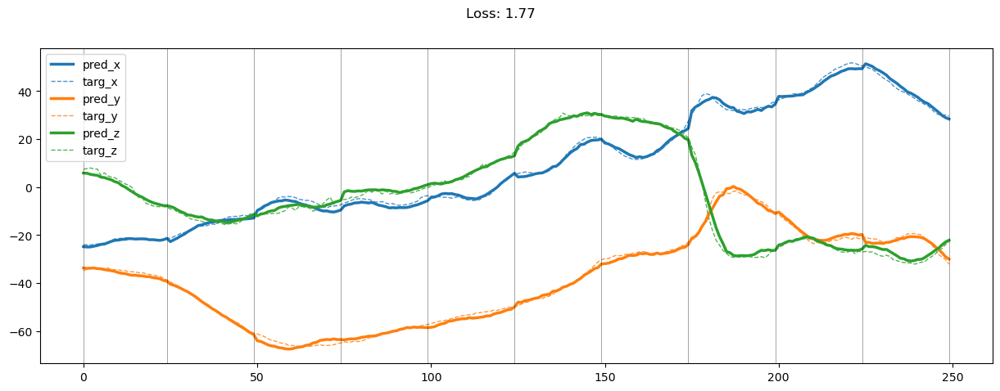

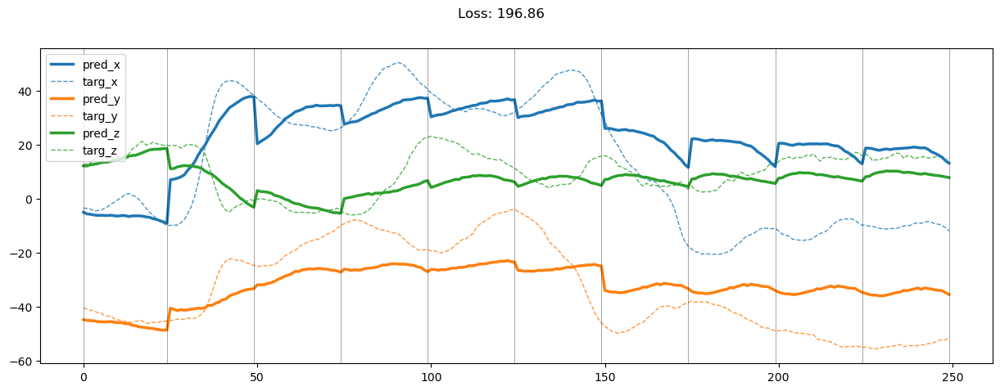

01099: train pred loss:  1.596, g loss:  1.991, d loss:  1.515
       valid pred loss:  129.203, g loss:  129.598, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01100: train pred loss:  1.609, g loss:  2.005, d loss:  1.515
       valid pred loss:  132.978, g loss:  133.373, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01101: train pred loss:  1.555, g loss:  1.950, d loss:  1.515
       valid pred loss:  134.788, g loss:  135.184, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01102: train pred loss:  1.508, g loss:  1.903, d loss:  1.515
       valid pred loss:  135.934, g loss:  136.329, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01103: train pred loss:  1.552, g loss:  1.947, d loss:  1.514
       valid pred loss:  135.488, g loss:  135.884, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01104: train pred loss:  1.591, g loss:  1.986, d loss:  1.514
       valid pred loss:  127.998, g loss:  128.393, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.28it/s]


01105: train pred loss:  1.566, g loss:  1.962, d loss:  1.514
       valid pred loss:  128.260, g loss:  128.657, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01106: train pred loss:  1.568, g loss:  1.965, d loss:  1.514
       valid pred loss:  132.819, g loss:  133.215, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01107: train pred loss:  1.564, g loss:  1.960, d loss:  1.513
       valid pred loss:  132.588, g loss:  132.985, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01108: train pred loss:  1.542, g loss:  1.939, d loss:  1.513
       valid pred loss:  136.519, g loss:  136.916, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.21it/s]


01109: train pred loss:  1.593, g loss:  1.990, d loss:  1.513
       valid pred loss:  127.851, g loss:  128.248, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01110: train pred loss:  1.562, g loss:  1.960, d loss:  1.512
       valid pred loss:  122.558, g loss:  122.956, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01111: train pred loss:  1.520, g loss:  1.918, d loss:  1.512
       valid pred loss:  127.359, g loss:  127.757, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01112: train pred loss:  1.499, g loss:  1.898, d loss:  1.512
       valid pred loss:  123.323, g loss:  123.721, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01113: train pred loss:  1.568, g loss:  1.967, d loss:  1.511
       valid pred loss:  128.061, g loss:  128.460, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01114: train pred loss:  1.557, g loss:  1.956, d loss:  1.511
       valid pred loss:  130.164, g loss:  130.563, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01115: train pred loss:  1.487, g loss:  1.887, d loss:  1.510
       valid pred loss:  127.751, g loss:  128.150, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01116: train pred loss:  1.564, g loss:  1.964, d loss:  1.510
       valid pred loss:  126.230, g loss:  126.630, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01117: train pred loss:  1.600, g loss:  2.000, d loss:  1.509
       valid pred loss:  127.964, g loss:  128.365, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01118: train pred loss:  1.657, g loss:  2.058, d loss:  1.509
       valid pred loss:  126.596, g loss:  126.997, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01119: train pred loss:  1.638, g loss:  2.039, d loss:  1.508
       valid pred loss:  129.381, g loss:  129.783, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01120: train pred loss:  1.580, g loss:  1.982, d loss:  1.508
       valid pred loss:  129.594, g loss:  129.996, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


01121: train pred loss:  1.606, g loss:  2.008, d loss:  1.507
       valid pred loss:  129.308, g loss:  129.710, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


01122: train pred loss:  1.576, g loss:  1.979, d loss:  1.507
       valid pred loss:  126.174, g loss:  126.578, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


01123: train pred loss:  1.497, g loss:  1.900, d loss:  1.506
       valid pred loss:  126.371, g loss:  126.775, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


01124: train pred loss:  1.573, g loss:  1.977, d loss:  1.506
       valid pred loss:  125.649, g loss:  126.054, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01125: train pred loss:  1.569, g loss:  1.974, d loss:  1.505
       valid pred loss:  132.852, g loss:  133.257, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01126: train pred loss:  1.543, g loss:  1.948, d loss:  1.504
       valid pred loss:  129.593, g loss:  129.999, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01127: train pred loss:  1.496, g loss:  1.902, d loss:  1.504
       valid pred loss:  126.446, g loss:  126.852, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01128: train pred loss:  1.520, g loss:  1.927, d loss:  1.503
       valid pred loss:  135.569, g loss:  135.975, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01129: train pred loss:  1.504, g loss:  1.911, d loss:  1.503
       valid pred loss:  130.415, g loss:  130.822, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01130: train pred loss:  1.492, g loss:  1.899, d loss:  1.502
       valid pred loss:  132.085, g loss:  132.493, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01131: train pred loss:  1.527, g loss:  1.935, d loss:  1.502
       valid pred loss:  132.489, g loss:  132.897, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01132: train pred loss:  1.520, g loss:  1.928, d loss:  1.501
       valid pred loss:  129.671, g loss:  130.080, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01133: train pred loss:  1.533, g loss:  1.942, d loss:  1.500
       valid pred loss:  129.527, g loss:  129.937, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01134: train pred loss:  1.524, g loss:  1.934, d loss:  1.500
       valid pred loss:  129.720, g loss:  130.130, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01135: train pred loss:  1.599, g loss:  2.010, d loss:  1.499
       valid pred loss:  123.011, g loss:  123.422, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01136: train pred loss:  1.550, g loss:  1.962, d loss:  1.499
       valid pred loss:  130.735, g loss:  131.147, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01137: train pred loss:  1.573, g loss:  1.984, d loss:  1.498
       valid pred loss:  131.054, g loss:  131.466, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01138: train pred loss:  1.541, g loss:  1.954, d loss:  1.497
       valid pred loss:  125.197, g loss:  125.610, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01139: train pred loss:  1.537, g loss:  1.950, d loss:  1.497
       valid pred loss:  128.882, g loss:  129.295, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


01140: train pred loss:  1.603, g loss:  2.017, d loss:  1.496
       valid pred loss:  126.946, g loss:  127.360, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01141: train pred loss:  1.593, g loss:  2.007, d loss:  1.496
       valid pred loss:  135.102, g loss:  135.517, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


01142: train pred loss:  1.623, g loss:  2.037, d loss:  1.495
       valid pred loss:  128.957, g loss:  129.372, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


01143: train pred loss:  1.657, g loss:  2.072, d loss:  1.495
       valid pred loss:  130.098, g loss:  130.514, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01144: train pred loss:  1.657, g loss:  2.072, d loss:  1.494
       valid pred loss:  123.399, g loss:  123.815, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01145: train pred loss:  1.650, g loss:  2.066, d loss:  1.494
       valid pred loss:  131.365, g loss:  131.781, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01146: train pred loss:  1.654, g loss:  2.071, d loss:  1.493
       valid pred loss:  129.823, g loss:  130.239, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.09it/s]


01147: train pred loss:  1.595, g loss:  2.013, d loss:  1.493
       valid pred loss:  124.864, g loss:  125.282, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01148: train pred loss:  1.607, g loss:  2.024, d loss:  1.492
       valid pred loss:  126.793, g loss:  127.211, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


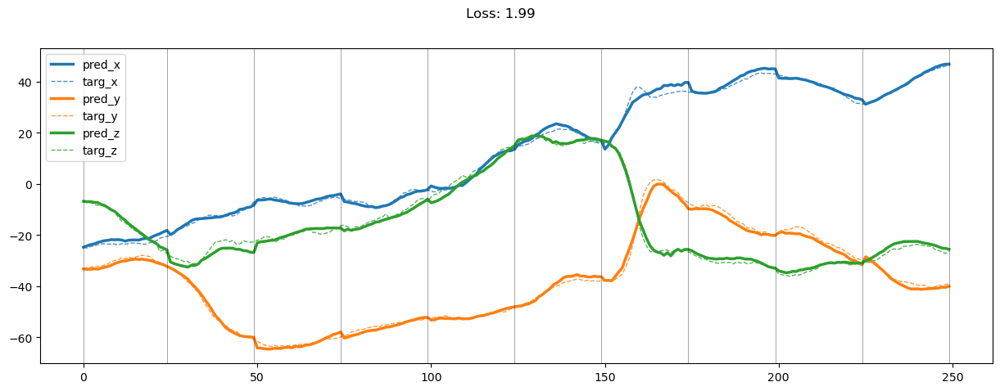

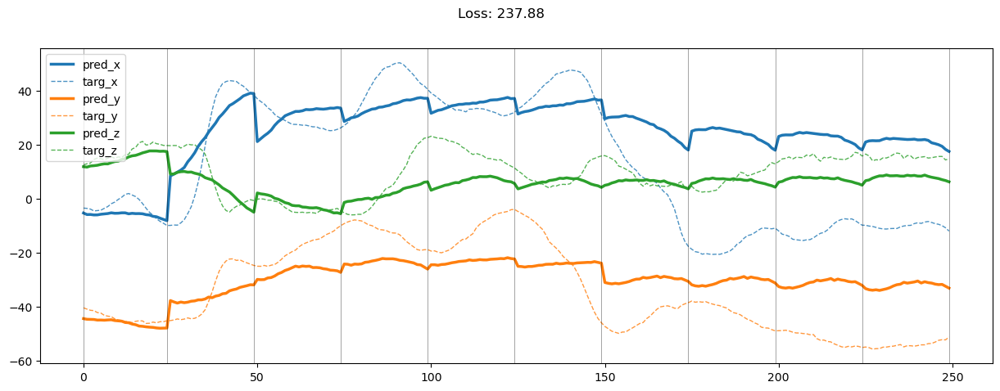

01149: train pred loss:  1.511, g loss:  1.929, d loss:  1.492
       valid pred loss:  129.277, g loss:  129.695, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01150: train pred loss:  1.506, g loss:  1.924, d loss:  1.492
       valid pred loss:  126.491, g loss:  126.910, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.31it/s]


01151: train pred loss:  1.534, g loss:  1.952, d loss:  1.491
       valid pred loss:  128.613, g loss:  129.032, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01152: train pred loss:  1.505, g loss:  1.924, d loss:  1.491
       valid pred loss:  126.753, g loss:  127.172, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01153: train pred loss:  1.559, g loss:  1.979, d loss:  1.491
       valid pred loss:  125.965, g loss:  126.385, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01154: train pred loss:  1.587, g loss:  2.007, d loss:  1.490
       valid pred loss:  127.874, g loss:  128.294, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01155: train pred loss:  1.530, g loss:  1.950, d loss:  1.490
       valid pred loss:  128.725, g loss:  129.145, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01156: train pred loss:  1.524, g loss:  1.944, d loss:  1.490
       valid pred loss:  130.630, g loss:  131.050, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01157: train pred loss:  1.521, g loss:  1.941, d loss:  1.490
       valid pred loss:  134.452, g loss:  134.873, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01158: train pred loss:  1.524, g loss:  1.945, d loss:  1.490
       valid pred loss:  136.614, g loss:  137.035, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01159: train pred loss:  1.555, g loss:  1.976, d loss:  1.490
       valid pred loss:  134.973, g loss:  135.394, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01160: train pred loss:  1.542, g loss:  1.963, d loss:  1.489
       valid pred loss:  132.761, g loss:  133.182, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01161: train pred loss:  1.642, g loss:  2.063, d loss:  1.489
       valid pred loss:  132.724, g loss:  133.145, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01162: train pred loss:  1.550, g loss:  1.971, d loss:  1.489
       valid pred loss:  127.392, g loss:  127.813, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01163: train pred loss:  1.581, g loss:  2.002, d loss:  1.489
       valid pred loss:  129.198, g loss:  129.618, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01164: train pred loss:  1.542, g loss:  1.963, d loss:  1.489
       valid pred loss:  134.727, g loss:  135.148, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01165: train pred loss:  1.538, g loss:  1.959, d loss:  1.490
       valid pred loss:  129.698, g loss:  130.118, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01166: train pred loss:  1.666, g loss:  2.086, d loss:  1.490
       valid pred loss:  134.259, g loss:  134.680, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01167: train pred loss:  1.626, g loss:  2.046, d loss:  1.490
       valid pred loss:  137.312, g loss:  137.732, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01168: train pred loss:  1.650, g loss:  2.071, d loss:  1.490
       valid pred loss:  129.966, g loss:  130.386, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01169: train pred loss:  1.594, g loss:  2.014, d loss:  1.490
       valid pred loss:  129.714, g loss:  130.134, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01170: train pred loss:  1.522, g loss:  1.942, d loss:  1.490
       valid pred loss:  132.877, g loss:  133.297, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01171: train pred loss:  1.505, g loss:  1.925, d loss:  1.491
       valid pred loss:  138.085, g loss:  138.505, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01172: train pred loss:  1.534, g loss:  1.953, d loss:  1.491
       valid pred loss:  136.865, g loss:  137.284, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01173: train pred loss:  1.490, g loss:  1.908, d loss:  1.491
       valid pred loss:  134.791, g loss:  135.209, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01174: train pred loss:  1.426, g loss:  1.845, d loss:  1.492
       valid pred loss:  131.784, g loss:  132.202, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01175: train pred loss:  1.479, g loss:  1.897, d loss:  1.492
       valid pred loss:  134.791, g loss:  135.209, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01176: train pred loss:  1.463, g loss:  1.880, d loss:  1.492
       valid pred loss:  131.262, g loss:  131.680, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01177: train pred loss:  1.458, g loss:  1.875, d loss:  1.493
       valid pred loss:  131.605, g loss:  132.021, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01178: train pred loss:  1.500, g loss:  1.917, d loss:  1.493
       valid pred loss:  128.146, g loss:  128.562, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01179: train pred loss:  1.497, g loss:  1.913, d loss:  1.494
       valid pred loss:  129.016, g loss:  129.432, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01180: train pred loss:  1.516, g loss:  1.932, d loss:  1.495
       valid pred loss:  125.161, g loss:  125.576, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.04it/s]


01181: train pred loss:  1.488, g loss:  1.903, d loss:  1.495
       valid pred loss:  130.022, g loss:  130.437, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01182: train pred loss:  1.469, g loss:  1.883, d loss:  1.496
       valid pred loss:  132.018, g loss:  132.431, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01183: train pred loss:  1.438, g loss:  1.851, d loss:  1.496
       valid pred loss:  128.927, g loss:  129.340, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01184: train pred loss:  1.444, g loss:  1.856, d loss:  1.497
       valid pred loss:  131.677, g loss:  132.090, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01185: train pred loss:  1.484, g loss:  1.896, d loss:  1.498
       valid pred loss:  130.932, g loss:  131.343, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01186: train pred loss:  1.509, g loss:  1.920, d loss:  1.498
       valid pred loss:  130.891, g loss:  131.301, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01187: train pred loss:  1.491, g loss:  1.901, d loss:  1.499
       valid pred loss:  134.725, g loss:  135.135, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01188: train pred loss:  1.470, g loss:  1.880, d loss:  1.500
       valid pred loss:  131.202, g loss:  131.611, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01189: train pred loss:  1.500, g loss:  1.909, d loss:  1.501
       valid pred loss:  130.332, g loss:  130.741, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01190: train pred loss:  1.494, g loss:  1.902, d loss:  1.502
       valid pred loss:  130.051, g loss:  130.458, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01191: train pred loss:  1.467, g loss:  1.874, d loss:  1.502
       valid pred loss:  138.933, g loss:  139.340, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01192: train pred loss:  1.422, g loss:  1.828, d loss:  1.503
       valid pred loss:  135.696, g loss:  136.102, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01193: train pred loss:  1.471, g loss:  1.876, d loss:  1.504
       valid pred loss:  133.115, g loss:  133.520, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.10it/s]


01194: train pred loss:  1.494, g loss:  1.899, d loss:  1.505
       valid pred loss:  130.510, g loss:  130.915, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01195: train pred loss:  1.453, g loss:  1.857, d loss:  1.506
       valid pred loss:  126.094, g loss:  126.498, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01196: train pred loss:  1.472, g loss:  1.875, d loss:  1.507
       valid pred loss:  138.812, g loss:  139.215, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01197: train pred loss:  1.539, g loss:  1.941, d loss:  1.507
       valid pred loss:  141.826, g loss:  142.228, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01198: train pred loss:  1.497, g loss:  1.898, d loss:  1.508
       valid pred loss:  128.849, g loss:  129.250, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


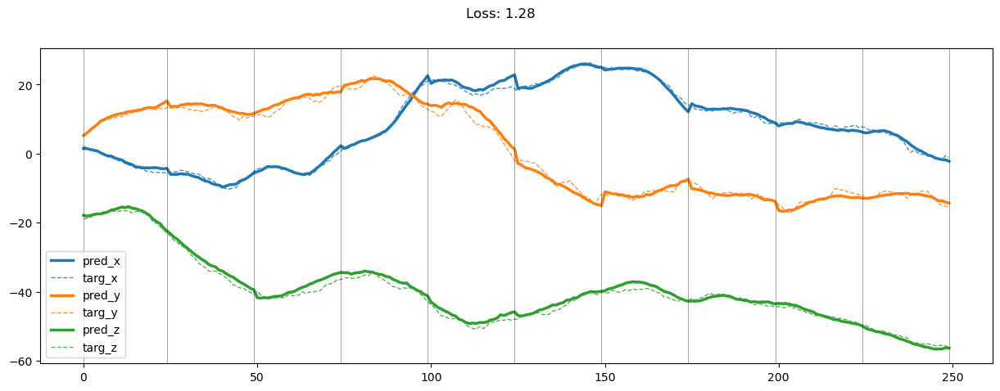

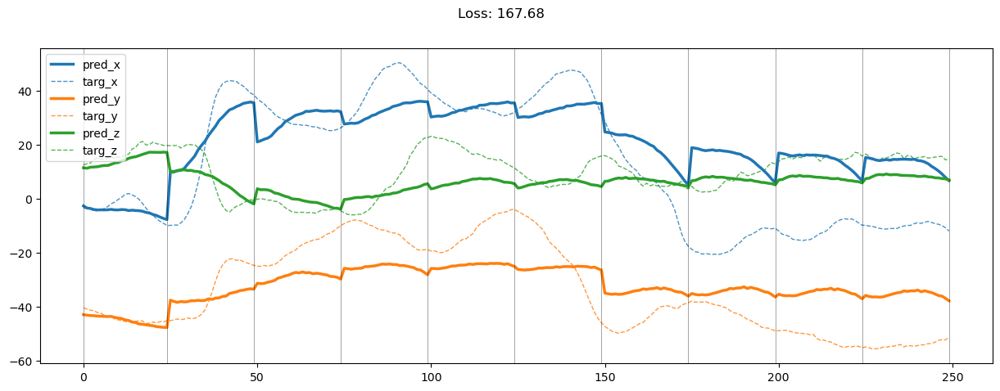

01199: train pred loss:  1.533, g loss:  1.933, d loss:  1.509
       valid pred loss:  131.587, g loss:  131.987, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01200: train pred loss:  1.516, g loss:  1.916, d loss:  1.510
       valid pred loss:  137.461, g loss:  137.861, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01201: train pred loss:  1.561, g loss:  1.960, d loss:  1.511
       valid pred loss:  135.608, g loss:  136.007, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01202: train pred loss:  1.559, g loss:  1.958, d loss:  1.511
       valid pred loss:  140.263, g loss:  140.661, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01203: train pred loss:  1.545, g loss:  1.942, d loss:  1.512
       valid pred loss:  136.438, g loss:  136.835, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01204: train pred loss:  1.507, g loss:  1.904, d loss:  1.513
       valid pred loss:  133.298, g loss:  133.695, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01205: train pred loss:  1.422, g loss:  1.819, d loss:  1.514
       valid pred loss:  138.105, g loss:  138.501, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01206: train pred loss:  1.445, g loss:  1.841, d loss:  1.514
       valid pred loss:  136.410, g loss:  136.805, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01207: train pred loss:  1.455, g loss:  1.850, d loss:  1.515
       valid pred loss:  145.279, g loss:  145.674, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01208: train pred loss:  1.450, g loss:  1.845, d loss:  1.516
       valid pred loss:  138.118, g loss:  138.512, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01209: train pred loss:  1.451, g loss:  1.844, d loss:  1.516
       valid pred loss:  140.444, g loss:  140.837, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01210: train pred loss:  1.418, g loss:  1.811, d loss:  1.517
       valid pred loss:  138.469, g loss:  138.862, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01211: train pred loss:  1.534, g loss:  1.927, d loss:  1.517
       valid pred loss:  134.655, g loss:  135.048, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01212: train pred loss:  1.452, g loss:  1.844, d loss:  1.518
       valid pred loss:  135.486, g loss:  135.878, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01213: train pred loss:  1.486, g loss:  1.878, d loss:  1.518
       valid pred loss:  130.864, g loss:  131.255, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01214: train pred loss:  1.479, g loss:  1.870, d loss:  1.519
       valid pred loss:  127.795, g loss:  128.186, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01215: train pred loss:  1.543, g loss:  1.934, d loss:  1.519
       valid pred loss:  126.704, g loss:  127.095, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01216: train pred loss:  1.503, g loss:  1.894, d loss:  1.519
       valid pred loss:  127.996, g loss:  128.387, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01217: train pred loss:  1.505, g loss:  1.895, d loss:  1.520
       valid pred loss:  130.912, g loss:  131.302, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01218: train pred loss:  1.488, g loss:  1.878, d loss:  1.520
       valid pred loss:  132.544, g loss:  132.934, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01219: train pred loss:  1.469, g loss:  1.859, d loss:  1.520
       valid pred loss:  133.139, g loss:  133.529, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01220: train pred loss:  1.377, g loss:  1.767, d loss:  1.520
       valid pred loss:  126.516, g loss:  126.906, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01221: train pred loss:  1.459, g loss:  1.849, d loss:  1.520
       valid pred loss:  131.779, g loss:  132.169, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01222: train pred loss:  1.396, g loss:  1.787, d loss:  1.520
       valid pred loss:  131.130, g loss:  131.520, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.38it/s]


01223: train pred loss:  1.398, g loss:  1.789, d loss:  1.520
       valid pred loss:  123.073, g loss:  123.463, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01224: train pred loss:  1.454, g loss:  1.845, d loss:  1.520
       valid pred loss:  123.191, g loss:  123.581, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01225: train pred loss:  1.444, g loss:  1.834, d loss:  1.520
       valid pred loss:  126.743, g loss:  127.134, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01226: train pred loss:  1.384, g loss:  1.775, d loss:  1.520
       valid pred loss:  123.619, g loss:  124.010, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01227: train pred loss:  1.348, g loss:  1.739, d loss:  1.519
       valid pred loss:  122.225, g loss:  122.616, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01228: train pred loss:  1.357, g loss:  1.749, d loss:  1.519
       valid pred loss:  130.920, g loss:  131.311, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01229: train pred loss:  1.353, g loss:  1.745, d loss:  1.519
       valid pred loss:  134.604, g loss:  134.996, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01230: train pred loss:  1.347, g loss:  1.739, d loss:  1.518
       valid pred loss:  131.213, g loss:  131.605, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01231: train pred loss:  1.428, g loss:  1.820, d loss:  1.518
       valid pred loss:  132.809, g loss:  133.201, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01232: train pred loss:  1.516, g loss:  1.909, d loss:  1.517
       valid pred loss:  141.055, g loss:  141.448, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01233: train pred loss:  1.401, g loss:  1.795, d loss:  1.516
       valid pred loss:  133.433, g loss:  133.827, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01234: train pred loss:  1.341, g loss:  1.735, d loss:  1.516
       valid pred loss:  136.938, g loss:  137.333, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01235: train pred loss:  1.414, g loss:  1.809, d loss:  1.515
       valid pred loss:  129.929, g loss:  130.324, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01236: train pred loss:  1.333, g loss:  1.729, d loss:  1.514
       valid pred loss:  129.182, g loss:  129.578, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01237: train pred loss:  1.326, g loss:  1.722, d loss:  1.513
       valid pred loss:  128.020, g loss:  128.417, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01238: train pred loss:  1.300, g loss:  1.697, d loss:  1.512
       valid pred loss:  131.087, g loss:  131.485, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01239: train pred loss:  1.329, g loss:  1.727, d loss:  1.512
       valid pred loss:  125.875, g loss:  126.274, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01240: train pred loss:  1.322, g loss:  1.721, d loss:  1.510
       valid pred loss:  132.937, g loss:  133.336, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01241: train pred loss:  1.314, g loss:  1.714, d loss:  1.510
       valid pred loss:  139.158, g loss:  139.558, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01242: train pred loss:  1.327, g loss:  1.728, d loss:  1.509
       valid pred loss:  128.169, g loss:  128.571, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01243: train pred loss:  1.340, g loss:  1.742, d loss:  1.508
       valid pred loss:  129.485, g loss:  129.887, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


01244: train pred loss:  1.375, g loss:  1.778, d loss:  1.507
       valid pred loss:  125.688, g loss:  126.091, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01245: train pred loss:  1.391, g loss:  1.795, d loss:  1.506
       valid pred loss:  130.997, g loss:  131.402, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01246: train pred loss:  1.387, g loss:  1.793, d loss:  1.504
       valid pred loss:  133.939, g loss:  134.345, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.96it/s]


01247: train pred loss:  1.431, g loss:  1.837, d loss:  1.503
       valid pred loss:  138.461, g loss:  138.868, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.13it/s]


01248: train pred loss:  1.501, g loss:  1.908, d loss:  1.502
       valid pred loss:  132.524, g loss:  132.932, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.41it/s]


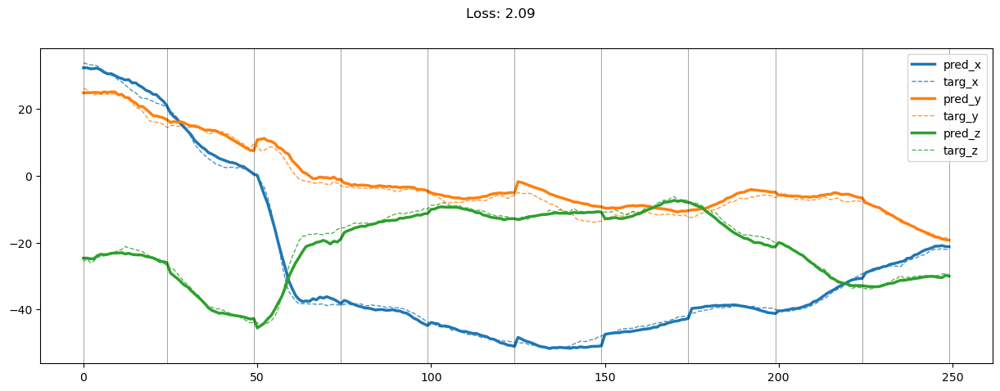

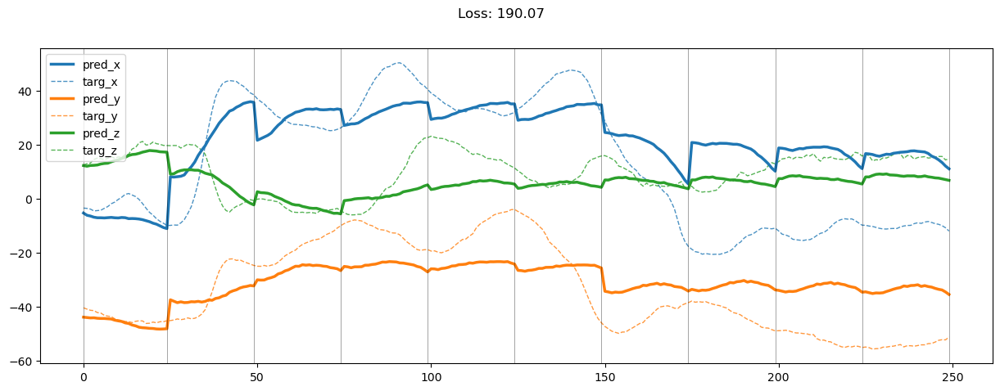

01249: train pred loss:  1.496, g loss:  1.904, d loss:  1.501
       valid pred loss:  130.473, g loss:  130.882, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


01250: train pred loss:  1.486, g loss:  1.896, d loss:  1.500
       valid pred loss:  129.023, g loss:  129.433, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01251: train pred loss:  1.433, g loss:  1.844, d loss:  1.499
       valid pred loss:  130.186, g loss:  130.597, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01252: train pred loss:  1.446, g loss:  1.857, d loss:  1.498
       valid pred loss:  130.863, g loss:  131.275, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01253: train pred loss:  1.462, g loss:  1.875, d loss:  1.497
       valid pred loss:  130.108, g loss:  130.522, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01254: train pred loss:  1.470, g loss:  1.884, d loss:  1.496
       valid pred loss:  132.079, g loss:  132.493, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


01255: train pred loss:  1.470, g loss:  1.885, d loss:  1.495
       valid pred loss:  132.812, g loss:  133.228, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.00it/s]


01256: train pred loss:  1.439, g loss:  1.854, d loss:  1.494
       valid pred loss:  135.795, g loss:  136.211, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


01257: train pred loss:  1.407, g loss:  1.824, d loss:  1.493
       valid pred loss:  126.524, g loss:  126.941, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01258: train pred loss:  1.417, g loss:  1.835, d loss:  1.492
       valid pred loss:  124.777, g loss:  125.196, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01259: train pred loss:  1.394, g loss:  1.813, d loss:  1.491
       valid pred loss:  128.215, g loss:  128.635, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01260: train pred loss:  1.391, g loss:  1.811, d loss:  1.490
       valid pred loss:  128.283, g loss:  128.703, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01261: train pred loss:  1.331, g loss:  1.752, d loss:  1.490
       valid pred loss:  125.273, g loss:  125.694, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01262: train pred loss:  1.282, g loss:  1.704, d loss:  1.489
       valid pred loss:  126.744, g loss:  127.166, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01263: train pred loss:  1.334, g loss:  1.756, d loss:  1.488
       valid pred loss:  131.215, g loss:  131.638, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01264: train pred loss:  1.349, g loss:  1.772, d loss:  1.488
       valid pred loss:  130.222, g loss:  130.645, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.11it/s]


01265: train pred loss:  1.322, g loss:  1.745, d loss:  1.487
       valid pred loss:  127.056, g loss:  127.479, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01266: train pred loss:  1.409, g loss:  1.833, d loss:  1.487
       valid pred loss:  135.917, g loss:  136.341, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01267: train pred loss:  1.445, g loss:  1.869, d loss:  1.486
       valid pred loss:  131.142, g loss:  131.567, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01268: train pred loss:  1.413, g loss:  1.838, d loss:  1.486
       valid pred loss:  130.337, g loss:  130.762, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01269: train pred loss:  1.356, g loss:  1.781, d loss:  1.486
       valid pred loss:  134.033, g loss:  134.458, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


01270: train pred loss:  1.317, g loss:  1.742, d loss:  1.485
       valid pred loss:  130.472, g loss:  130.897, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


01271: train pred loss:  1.356, g loss:  1.782, d loss:  1.485
       valid pred loss:  128.965, g loss:  129.391, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01272: train pred loss:  1.341, g loss:  1.767, d loss:  1.485
       valid pred loss:  131.897, g loss:  132.323, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01273: train pred loss:  1.336, g loss:  1.762, d loss:  1.485
       valid pred loss:  128.510, g loss:  128.936, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01274: train pred loss:  1.297, g loss:  1.723, d loss:  1.485
       valid pred loss:  133.147, g loss:  133.573, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01275: train pred loss:  1.337, g loss:  1.762, d loss:  1.485
       valid pred loss:  127.428, g loss:  127.853, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01276: train pred loss:  1.285, g loss:  1.710, d loss:  1.485
       valid pred loss:  125.473, g loss:  125.898, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01277: train pred loss:  1.281, g loss:  1.706, d loss:  1.486
       valid pred loss:  130.461, g loss:  130.886, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01278: train pred loss:  1.283, g loss:  1.708, d loss:  1.486
       valid pred loss:  132.750, g loss:  133.174, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01279: train pred loss:  1.325, g loss:  1.749, d loss:  1.487
       valid pred loss:  130.240, g loss:  130.663, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01280: train pred loss:  1.332, g loss:  1.755, d loss:  1.487
       valid pred loss:  132.770, g loss:  133.193, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01281: train pred loss:  1.311, g loss:  1.734, d loss:  1.488
       valid pred loss:  132.642, g loss:  133.064, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01282: train pred loss:  1.350, g loss:  1.772, d loss:  1.488
       valid pred loss:  132.355, g loss:  132.776, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01283: train pred loss:  1.315, g loss:  1.737, d loss:  1.489
       valid pred loss:  138.367, g loss:  138.788, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01284: train pred loss:  1.265, g loss:  1.685, d loss:  1.490
       valid pred loss:  135.840, g loss:  136.260, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01285: train pred loss:  1.306, g loss:  1.725, d loss:  1.491
       valid pred loss:  131.659, g loss:  132.078, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01286: train pred loss:  1.265, g loss:  1.683, d loss:  1.492
       valid pred loss:  129.757, g loss:  130.174, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01287: train pred loss:  1.277, g loss:  1.694, d loss:  1.493
       valid pred loss:  134.330, g loss:  134.746, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01288: train pred loss:  1.265, g loss:  1.681, d loss:  1.494
       valid pred loss:  132.872, g loss:  133.287, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01289: train pred loss:  1.329, g loss:  1.743, d loss:  1.495
       valid pred loss:  129.559, g loss:  129.973, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01290: train pred loss:  1.311, g loss:  1.725, d loss:  1.496
       valid pred loss:  132.671, g loss:  133.083, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01291: train pred loss:  1.366, g loss:  1.778, d loss:  1.498
       valid pred loss:  133.007, g loss:  133.419, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.42it/s]


01292: train pred loss:  1.298, g loss:  1.708, d loss:  1.499
       valid pred loss:  136.263, g loss:  136.673, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.67it/s]


01293: train pred loss:  1.288, g loss:  1.697, d loss:  1.500
       valid pred loss:  138.979, g loss:  139.387, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01294: train pred loss:  1.282, g loss:  1.690, d loss:  1.502
       valid pred loss:  128.594, g loss:  129.001, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01295: train pred loss:  1.279, g loss:  1.686, d loss:  1.503
       valid pred loss:  132.986, g loss:  133.391, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01296: train pred loss:  1.277, g loss:  1.682, d loss:  1.505
       valid pred loss:  132.942, g loss:  133.346, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


01297: train pred loss:  1.325, g loss:  1.728, d loss:  1.506
       valid pred loss:  130.018, g loss:  130.421, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


01298: train pred loss:  1.311, g loss:  1.713, d loss:  1.507
       valid pred loss:  127.659, g loss:  128.060, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


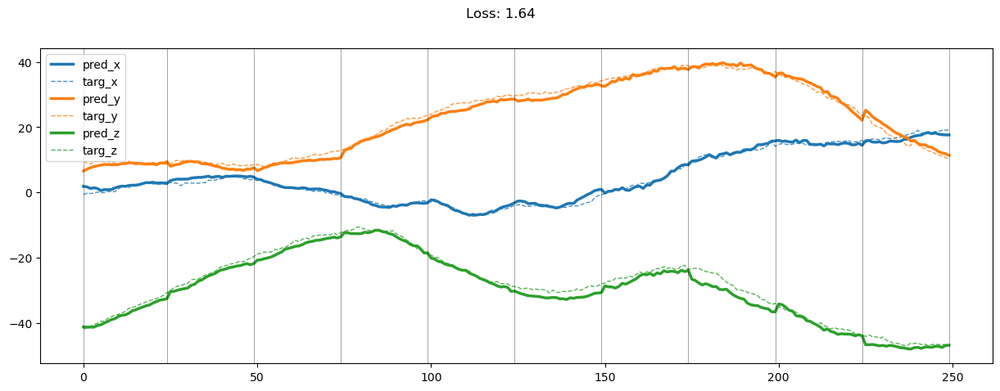

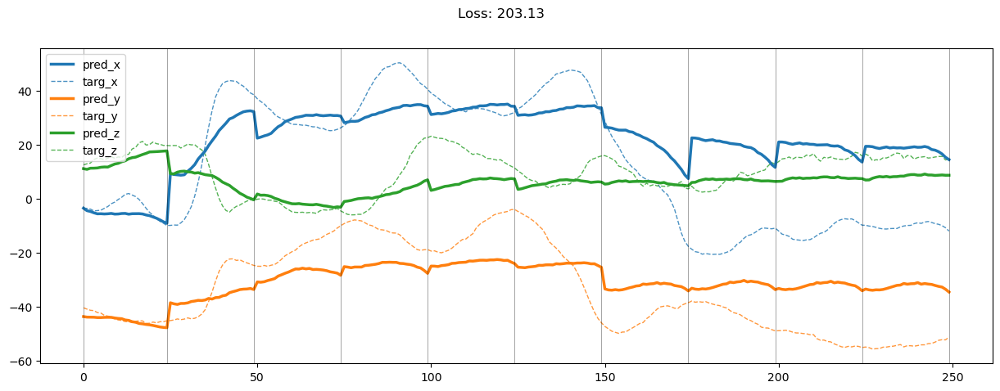

01299: train pred loss:  1.321, g loss:  1.722, d loss:  1.509
       valid pred loss:  129.274, g loss:  129.674, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.46it/s]


01300: train pred loss:  1.276, g loss:  1.675, d loss:  1.510
       valid pred loss:  127.244, g loss:  127.642, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.02it/s]


01301: train pred loss:  1.247, g loss:  1.645, d loss:  1.512
       valid pred loss:  131.132, g loss:  131.529, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01302: train pred loss:  1.243, g loss:  1.639, d loss:  1.513
       valid pred loss:  127.078, g loss:  127.474, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01303: train pred loss:  1.192, g loss:  1.587, d loss:  1.515
       valid pred loss:  123.757, g loss:  124.152, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01304: train pred loss:  1.194, g loss:  1.588, d loss:  1.516
       valid pred loss:  127.894, g loss:  128.287, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01305: train pred loss:  1.223, g loss:  1.616, d loss:  1.517
       valid pred loss:  129.713, g loss:  130.105, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01306: train pred loss:  1.227, g loss:  1.618, d loss:  1.519
       valid pred loss:  126.726, g loss:  127.117, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01307: train pred loss:  1.234, g loss:  1.624, d loss:  1.520
       valid pred loss:  132.382, g loss:  132.772, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01308: train pred loss:  1.200, g loss:  1.589, d loss:  1.521
       valid pred loss:  131.537, g loss:  131.926, d loss:  1.522


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01309: train pred loss:  1.199, g loss:  1.587, d loss:  1.522
       valid pred loss:  130.767, g loss:  131.154, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01310: train pred loss:  1.211, g loss:  1.598, d loss:  1.523
       valid pred loss:  130.733, g loss:  131.120, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01311: train pred loss:  1.265, g loss:  1.651, d loss:  1.524
       valid pred loss:  131.462, g loss:  131.848, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01312: train pred loss:  1.241, g loss:  1.627, d loss:  1.525
       valid pred loss:  133.255, g loss:  133.640, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01313: train pred loss:  1.258, g loss:  1.643, d loss:  1.526
       valid pred loss:  131.394, g loss:  131.779, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01314: train pred loss:  1.303, g loss:  1.687, d loss:  1.526
       valid pred loss:  126.518, g loss:  126.902, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01315: train pred loss:  1.227, g loss:  1.611, d loss:  1.527
       valid pred loss:  126.930, g loss:  127.314, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01316: train pred loss:  1.248, g loss:  1.632, d loss:  1.527
       valid pred loss:  121.595, g loss:  121.978, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01317: train pred loss:  1.252, g loss:  1.636, d loss:  1.528
       valid pred loss:  133.341, g loss:  133.724, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01318: train pred loss:  1.332, g loss:  1.715, d loss:  1.528
       valid pred loss:  129.576, g loss:  129.959, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01319: train pred loss:  1.321, g loss:  1.704, d loss:  1.528
       valid pred loss:  128.872, g loss:  129.255, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01320: train pred loss:  1.279, g loss:  1.663, d loss:  1.528
       valid pred loss:  123.833, g loss:  124.216, d loss:  1.528


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01321: train pred loss:  1.314, g loss:  1.697, d loss:  1.528
       valid pred loss:  125.141, g loss:  125.525, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01322: train pred loss:  1.254, g loss:  1.638, d loss:  1.527
       valid pred loss:  123.181, g loss:  123.565, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01323: train pred loss:  1.260, g loss:  1.644, d loss:  1.527
       valid pred loss:  126.208, g loss:  126.593, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01324: train pred loss:  1.252, g loss:  1.637, d loss:  1.526
       valid pred loss:  134.589, g loss:  134.974, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01325: train pred loss:  1.291, g loss:  1.676, d loss:  1.525
       valid pred loss:  130.184, g loss:  130.570, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01326: train pred loss:  1.289, g loss:  1.675, d loss:  1.525
       valid pred loss:  126.753, g loss:  127.139, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01327: train pred loss:  1.301, g loss:  1.688, d loss:  1.524
       valid pred loss:  124.514, g loss:  124.902, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01328: train pred loss:  1.309, g loss:  1.697, d loss:  1.522
       valid pred loss:  127.020, g loss:  127.409, d loss:  1.522


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.24it/s]


01329: train pred loss:  1.322, g loss:  1.712, d loss:  1.521
       valid pred loss:  136.250, g loss:  136.640, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.81it/s]


01330: train pred loss:  1.310, g loss:  1.700, d loss:  1.520
       valid pred loss:  132.733, g loss:  133.124, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01331: train pred loss:  1.392, g loss:  1.783, d loss:  1.519
       valid pred loss:  146.757, g loss:  147.149, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


01332: train pred loss:  1.399, g loss:  1.792, d loss:  1.517
       valid pred loss:  141.273, g loss:  141.667, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01333: train pred loss:  1.377, g loss:  1.772, d loss:  1.516
       valid pred loss:  138.787, g loss:  139.183, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01334: train pred loss:  1.338, g loss:  1.733, d loss:  1.514
       valid pred loss:  137.990, g loss:  138.386, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01335: train pred loss:  1.363, g loss:  1.760, d loss:  1.512
       valid pred loss:  142.538, g loss:  142.936, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01336: train pred loss:  1.334, g loss:  1.733, d loss:  1.510
       valid pred loss:  140.793, g loss:  141.193, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01337: train pred loss:  1.314, g loss:  1.715, d loss:  1.509
       valid pred loss:  144.181, g loss:  144.583, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01338: train pred loss:  1.235, g loss:  1.638, d loss:  1.507
       valid pred loss:  135.323, g loss:  135.727, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


01339: train pred loss:  1.273, g loss:  1.678, d loss:  1.505
       valid pred loss:  136.038, g loss:  136.443, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01340: train pred loss:  1.261, g loss:  1.667, d loss:  1.503
       valid pred loss:  140.834, g loss:  141.241, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01341: train pred loss:  1.291, g loss:  1.699, d loss:  1.501
       valid pred loss:  136.729, g loss:  137.139, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01342: train pred loss:  1.281, g loss:  1.691, d loss:  1.499
       valid pred loss:  140.677, g loss:  141.088, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


01343: train pred loss:  1.312, g loss:  1.725, d loss:  1.498
       valid pred loss:  130.993, g loss:  131.406, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01344: train pred loss:  1.304, g loss:  1.718, d loss:  1.496
       valid pred loss:  132.130, g loss:  132.545, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01345: train pred loss:  1.327, g loss:  1.743, d loss:  1.494
       valid pred loss:  130.898, g loss:  131.315, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01346: train pred loss:  1.280, g loss:  1.698, d loss:  1.493
       valid pred loss:  131.003, g loss:  131.422, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01347: train pred loss:  1.284, g loss:  1.703, d loss:  1.491
       valid pred loss:  128.777, g loss:  129.197, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01348: train pred loss:  1.274, g loss:  1.695, d loss:  1.489
       valid pred loss:  131.118, g loss:  131.540, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


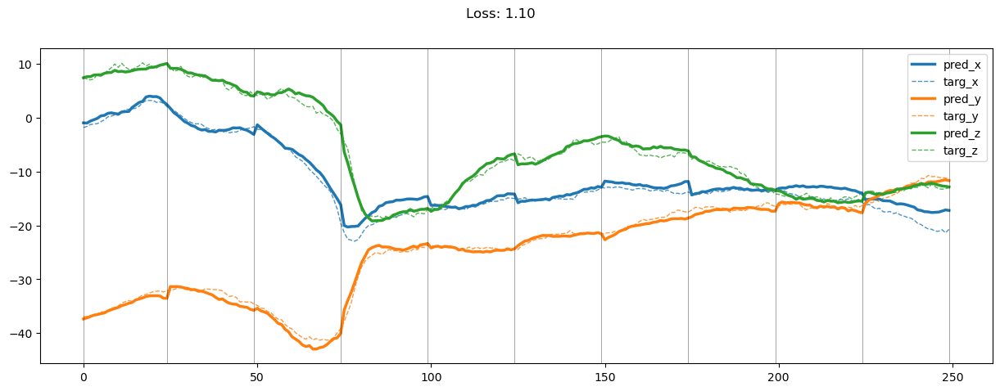

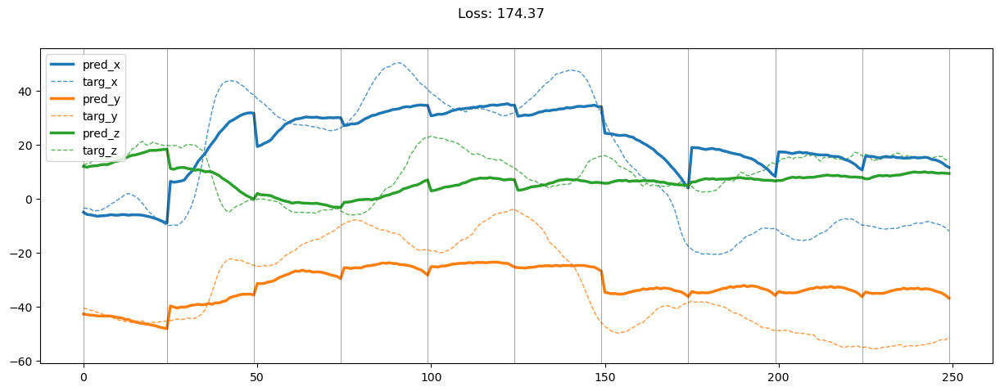

01349: train pred loss:  1.413, g loss:  1.835, d loss:  1.488
       valid pred loss:  131.103, g loss:  131.526, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01350: train pred loss:  1.397, g loss:  1.821, d loss:  1.486
       valid pred loss:  135.444, g loss:  135.869, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.87it/s]


01351: train pred loss:  1.325, g loss:  1.751, d loss:  1.485
       valid pred loss:  136.056, g loss:  136.482, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01352: train pred loss:  1.454, g loss:  1.882, d loss:  1.484
       valid pred loss:  122.348, g loss:  122.776, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.53it/s]


01353: train pred loss:  1.365, g loss:  1.794, d loss:  1.483
       valid pred loss:  122.108, g loss:  122.537, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.31it/s]


01354: train pred loss:  1.347, g loss:  1.777, d loss:  1.481
       valid pred loss:  129.658, g loss:  130.089, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.18it/s]


01355: train pred loss:  1.303, g loss:  1.734, d loss:  1.481
       valid pred loss:  129.984, g loss:  130.415, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


01356: train pred loss:  1.247, g loss:  1.678, d loss:  1.480
       valid pred loss:  125.975, g loss:  126.408, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


01357: train pred loss:  1.247, g loss:  1.680, d loss:  1.479
       valid pred loss:  125.898, g loss:  126.331, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.09it/s]


01358: train pred loss:  1.249, g loss:  1.682, d loss:  1.479
       valid pred loss:  135.911, g loss:  136.344, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.61it/s]


01359: train pred loss:  1.236, g loss:  1.669, d loss:  1.478
       valid pred loss:  138.986, g loss:  139.420, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.15it/s]


01360: train pred loss:  1.241, g loss:  1.675, d loss:  1.478
       valid pred loss:  132.358, g loss:  132.792, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01361: train pred loss:  1.221, g loss:  1.655, d loss:  1.478
       valid pred loss:  129.177, g loss:  129.611, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01362: train pred loss:  1.194, g loss:  1.628, d loss:  1.478
       valid pred loss:  132.048, g loss:  132.481, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01363: train pred loss:  1.208, g loss:  1.642, d loss:  1.478
       valid pred loss:  131.521, g loss:  131.954, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01364: train pred loss:  1.274, g loss:  1.707, d loss:  1.478
       valid pred loss:  134.148, g loss:  134.581, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01365: train pred loss:  1.214, g loss:  1.647, d loss:  1.479
       valid pred loss:  135.219, g loss:  135.652, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01366: train pred loss:  1.251, g loss:  1.683, d loss:  1.479
       valid pred loss:  134.579, g loss:  135.011, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01367: train pred loss:  1.203, g loss:  1.634, d loss:  1.480
       valid pred loss:  139.962, g loss:  140.392, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01368: train pred loss:  1.236, g loss:  1.666, d loss:  1.481
       valid pred loss:  139.574, g loss:  140.003, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01369: train pred loss:  1.229, g loss:  1.658, d loss:  1.482
       valid pred loss:  138.280, g loss:  138.708, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01370: train pred loss:  1.211, g loss:  1.638, d loss:  1.483
       valid pred loss:  128.672, g loss:  129.099, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01371: train pred loss:  1.215, g loss:  1.640, d loss:  1.485
       valid pred loss:  130.113, g loss:  130.538, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01372: train pred loss:  1.181, g loss:  1.605, d loss:  1.486
       valid pred loss:  132.967, g loss:  133.390, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01373: train pred loss:  1.181, g loss:  1.603, d loss:  1.488
       valid pred loss:  132.934, g loss:  133.355, d loss:  1.489


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01374: train pred loss:  1.169, g loss:  1.589, d loss:  1.490
       valid pred loss:  128.964, g loss:  129.383, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01375: train pred loss:  1.214, g loss:  1.633, d loss:  1.492
       valid pred loss:  138.311, g loss:  138.728, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01376: train pred loss:  1.203, g loss:  1.619, d loss:  1.494
       valid pred loss:  139.032, g loss:  139.447, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01377: train pred loss:  1.200, g loss:  1.615, d loss:  1.495
       valid pred loss:  133.064, g loss:  133.477, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01378: train pred loss:  1.173, g loss:  1.585, d loss:  1.498
       valid pred loss:  131.228, g loss:  131.638, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01379: train pred loss:  1.217, g loss:  1.627, d loss:  1.500
       valid pred loss:  135.951, g loss:  136.359, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01380: train pred loss:  1.149, g loss:  1.556, d loss:  1.502
       valid pred loss:  143.856, g loss:  144.262, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01381: train pred loss:  1.163, g loss:  1.567, d loss:  1.505
       valid pred loss:  136.060, g loss:  136.464, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01382: train pred loss:  1.144, g loss:  1.546, d loss:  1.507
       valid pred loss:  139.443, g loss:  139.844, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


01383: train pred loss:  1.203, g loss:  1.603, d loss:  1.510
       valid pred loss:  142.314, g loss:  142.713, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01384: train pred loss:  1.170, g loss:  1.568, d loss:  1.512
       valid pred loss:  136.795, g loss:  137.191, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


01385: train pred loss:  1.199, g loss:  1.594, d loss:  1.515
       valid pred loss:  134.031, g loss:  134.425, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01386: train pred loss:  1.217, g loss:  1.610, d loss:  1.517
       valid pred loss:  141.440, g loss:  141.832, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01387: train pred loss:  1.245, g loss:  1.635, d loss:  1.519
       valid pred loss:  137.626, g loss:  138.016, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01388: train pred loss:  1.277, g loss:  1.666, d loss:  1.522
       valid pred loss:  136.521, g loss:  136.909, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01389: train pred loss:  1.231, g loss:  1.617, d loss:  1.524
       valid pred loss:  135.427, g loss:  135.812, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01390: train pred loss:  1.217, g loss:  1.602, d loss:  1.526
       valid pred loss:  138.475, g loss:  138.858, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01391: train pred loss:  1.284, g loss:  1.667, d loss:  1.528
       valid pred loss:  139.488, g loss:  139.870, d loss:  1.529


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01392: train pred loss:  1.253, g loss:  1.634, d loss:  1.530
       valid pred loss:  137.148, g loss:  137.528, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01393: train pred loss:  1.212, g loss:  1.592, d loss:  1.532
       valid pred loss:  140.310, g loss:  140.689, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01394: train pred loss:  1.208, g loss:  1.587, d loss:  1.534
       valid pred loss:  139.697, g loss:  140.075, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01395: train pred loss:  1.203, g loss:  1.580, d loss:  1.535
       valid pred loss:  137.687, g loss:  138.064, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


01396: train pred loss:  1.195, g loss:  1.571, d loss:  1.536
       valid pred loss:  135.306, g loss:  135.682, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01397: train pred loss:  1.192, g loss:  1.567, d loss:  1.537
       valid pred loss:  127.196, g loss:  127.571, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01398: train pred loss:  1.167, g loss:  1.542, d loss:  1.538
       valid pred loss:  137.129, g loss:  137.503, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


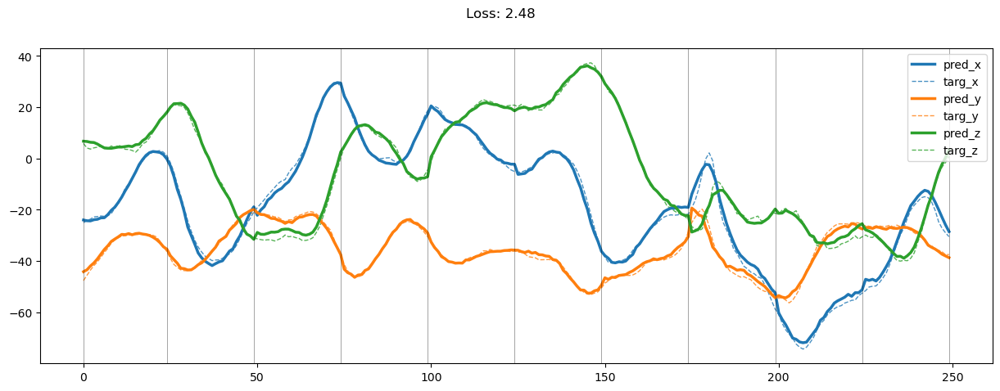

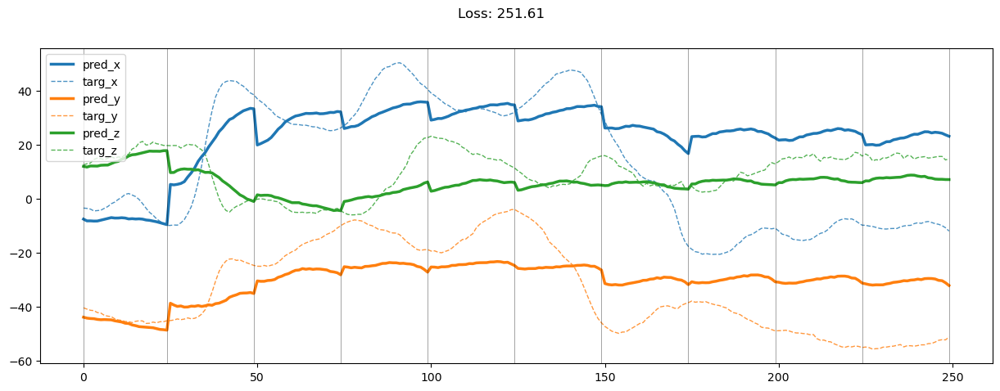

01399: train pred loss:  1.209, g loss:  1.583, d loss:  1.539
       valid pred loss:  141.908, g loss:  142.282, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01400: train pred loss:  1.226, g loss:  1.599, d loss:  1.539
       valid pred loss:  135.437, g loss:  135.811, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01401: train pred loss:  1.273, g loss:  1.646, d loss:  1.540
       valid pred loss:  134.714, g loss:  135.088, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


01402: train pred loss:  1.299, g loss:  1.672, d loss:  1.539
       valid pred loss:  133.680, g loss:  134.054, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01403: train pred loss:  1.323, g loss:  1.697, d loss:  1.539
       valid pred loss:  128.286, g loss:  128.660, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01404: train pred loss:  1.257, g loss:  1.631, d loss:  1.538
       valid pred loss:  131.223, g loss:  131.597, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01405: train pred loss:  1.176, g loss:  1.551, d loss:  1.537
       valid pred loss:  126.524, g loss:  126.900, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01406: train pred loss:  1.229, g loss:  1.604, d loss:  1.536
       valid pred loss:  134.095, g loss:  134.471, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


01407: train pred loss:  1.184, g loss:  1.561, d loss:  1.535
       valid pred loss:  136.424, g loss:  136.802, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01408: train pred loss:  1.214, g loss:  1.592, d loss:  1.534
       valid pred loss:  137.050, g loss:  137.429, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01409: train pred loss:  1.156, g loss:  1.535, d loss:  1.532
       valid pred loss:  128.705, g loss:  129.086, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01410: train pred loss:  1.186, g loss:  1.568, d loss:  1.530
       valid pred loss:  133.438, g loss:  133.821, d loss:  1.529


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01411: train pred loss:  1.213, g loss:  1.597, d loss:  1.528
       valid pred loss:  128.176, g loss:  128.560, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


01412: train pred loss:  1.306, g loss:  1.691, d loss:  1.525
       valid pred loss:  130.860, g loss:  131.247, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


01413: train pred loss:  1.220, g loss:  1.608, d loss:  1.523
       valid pred loss:  138.366, g loss:  138.755, d loss:  1.522


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01414: train pred loss:  1.279, g loss:  1.669, d loss:  1.520
       valid pred loss:  145.038, g loss:  145.429, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01415: train pred loss:  1.181, g loss:  1.573, d loss:  1.518
       valid pred loss:  140.880, g loss:  141.274, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01416: train pred loss:  1.197, g loss:  1.593, d loss:  1.515
       valid pred loss:  143.236, g loss:  143.632, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01417: train pred loss:  1.177, g loss:  1.575, d loss:  1.512
       valid pred loss:  135.981, g loss:  136.380, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01418: train pred loss:  1.157, g loss:  1.558, d loss:  1.509
       valid pred loss:  141.877, g loss:  142.279, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01419: train pred loss:  1.206, g loss:  1.609, d loss:  1.506
       valid pred loss:  144.694, g loss:  145.099, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


01420: train pred loss:  1.221, g loss:  1.628, d loss:  1.503
       valid pred loss:  137.324, g loss:  137.732, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


01421: train pred loss:  1.206, g loss:  1.615, d loss:  1.500
       valid pred loss:  133.826, g loss:  134.237, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01422: train pred loss:  1.191, g loss:  1.603, d loss:  1.497
       valid pred loss:  140.694, g loss:  141.109, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01423: train pred loss:  1.226, g loss:  1.641, d loss:  1.494
       valid pred loss:  131.457, g loss:  131.874, d loss:  1.493


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01424: train pred loss:  1.219, g loss:  1.637, d loss:  1.492
       valid pred loss:  137.736, g loss:  138.156, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01425: train pred loss:  1.187, g loss:  1.608, d loss:  1.489
       valid pred loss:  134.416, g loss:  134.839, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01426: train pred loss:  1.162, g loss:  1.586, d loss:  1.486
       valid pred loss:  134.147, g loss:  134.572, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01427: train pred loss:  1.169, g loss:  1.596, d loss:  1.484
       valid pred loss:  132.184, g loss:  132.612, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.56it/s]


01428: train pred loss:  1.212, g loss:  1.642, d loss:  1.482
       valid pred loss:  135.485, g loss:  135.915, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01429: train pred loss:  1.256, g loss:  1.688, d loss:  1.480
       valid pred loss:  131.466, g loss:  131.899, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.58it/s]


01430: train pred loss:  1.206, g loss:  1.641, d loss:  1.477
       valid pred loss:  133.693, g loss:  134.128, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01431: train pred loss:  1.181, g loss:  1.618, d loss:  1.476
       valid pred loss:  128.793, g loss:  129.231, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01432: train pred loss:  1.203, g loss:  1.642, d loss:  1.474
       valid pred loss:  134.167, g loss:  134.606, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01433: train pred loss:  1.149, g loss:  1.589, d loss:  1.472
       valid pred loss:  128.770, g loss:  129.211, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01434: train pred loss:  1.170, g loss:  1.612, d loss:  1.471
       valid pred loss:  128.823, g loss:  129.266, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.19it/s]


01435: train pred loss:  1.171, g loss:  1.614, d loss:  1.470
       valid pred loss:  135.367, g loss:  135.811, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.46it/s]


01436: train pred loss:  1.202, g loss:  1.646, d loss:  1.469
       valid pred loss:  132.761, g loss:  133.206, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.19it/s]


01437: train pred loss:  1.211, g loss:  1.657, d loss:  1.468
       valid pred loss:  133.655, g loss:  134.100, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01438: train pred loss:  1.168, g loss:  1.614, d loss:  1.468
       valid pred loss:  134.537, g loss:  134.983, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01439: train pred loss:  1.192, g loss:  1.638, d loss:  1.468
       valid pred loss:  135.857, g loss:  136.303, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01440: train pred loss:  1.208, g loss:  1.654, d loss:  1.468
       valid pred loss:  138.577, g loss:  139.023, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.55it/s]


01441: train pred loss:  1.159, g loss:  1.605, d loss:  1.468
       valid pred loss:  135.129, g loss:  135.575, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01442: train pred loss:  1.140, g loss:  1.585, d loss:  1.469
       valid pred loss:  133.565, g loss:  134.010, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01443: train pred loss:  1.177, g loss:  1.622, d loss:  1.469
       valid pred loss:  136.405, g loss:  136.849, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01444: train pred loss:  1.113, g loss:  1.555, d loss:  1.471
       valid pred loss:  135.832, g loss:  136.275, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01445: train pred loss:  1.128, g loss:  1.569, d loss:  1.472
       valid pred loss:  135.100, g loss:  135.541, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01446: train pred loss:  1.106, g loss:  1.546, d loss:  1.473
       valid pred loss:  138.824, g loss:  139.262, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01447: train pred loss:  1.123, g loss:  1.560, d loss:  1.475
       valid pred loss:  137.780, g loss:  138.216, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01448: train pred loss:  1.179, g loss:  1.614, d loss:  1.477
       valid pred loss:  131.754, g loss:  132.188, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


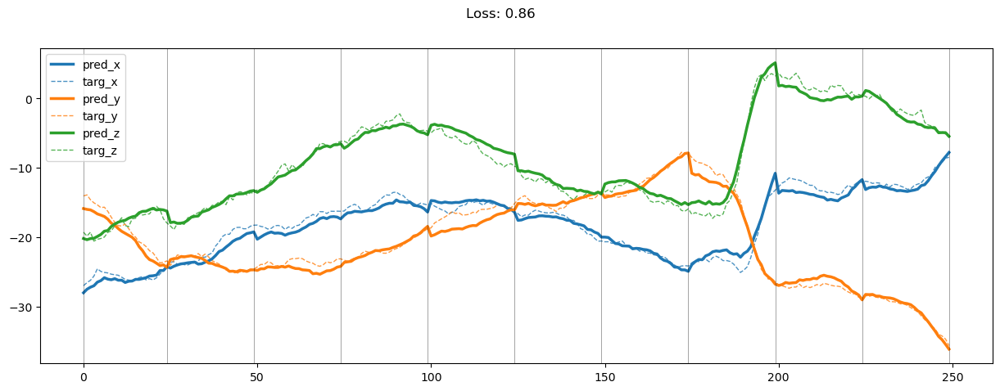

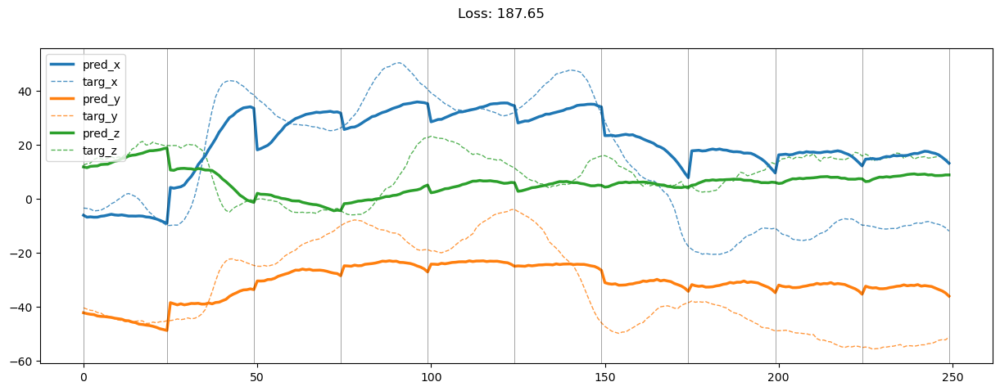

01449: train pred loss:  1.130, g loss:  1.563, d loss:  1.479
       valid pred loss:  136.380, g loss:  136.811, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.25it/s]


01450: train pred loss:  1.238, g loss:  1.668, d loss:  1.481
       valid pred loss:  133.137, g loss:  133.565, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01451: train pred loss:  1.171, g loss:  1.598, d loss:  1.484
       valid pred loss:  131.896, g loss:  132.321, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01452: train pred loss:  1.179, g loss:  1.603, d loss:  1.487
       valid pred loss:  137.985, g loss:  138.407, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01453: train pred loss:  1.169, g loss:  1.589, d loss:  1.490
       valid pred loss:  142.317, g loss:  142.736, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01454: train pred loss:  1.189, g loss:  1.607, d loss:  1.493
       valid pred loss:  134.577, g loss:  134.992, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01455: train pred loss:  1.131, g loss:  1.544, d loss:  1.496
       valid pred loss:  132.459, g loss:  132.870, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.45it/s]


01456: train pred loss:  1.115, g loss:  1.525, d loss:  1.499
       valid pred loss:  135.302, g loss:  135.710, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01457: train pred loss:  1.148, g loss:  1.555, d loss:  1.503
       valid pred loss:  130.482, g loss:  130.887, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01458: train pred loss:  1.108, g loss:  1.511, d loss:  1.506
       valid pred loss:  127.444, g loss:  127.845, d loss:  1.509


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01459: train pred loss:  1.087, g loss:  1.487, d loss:  1.510
       valid pred loss:  131.926, g loss:  132.323, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01460: train pred loss:  1.089, g loss:  1.485, d loss:  1.514
       valid pred loss:  132.743, g loss:  133.137, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01461: train pred loss:  1.066, g loss:  1.458, d loss:  1.517
       valid pred loss:  135.598, g loss:  135.989, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01462: train pred loss:  1.120, g loss:  1.509, d loss:  1.521
       valid pred loss:  145.156, g loss:  145.544, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01463: train pred loss:  1.092, g loss:  1.478, d loss:  1.525
       valid pred loss:  137.029, g loss:  137.413, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01464: train pred loss:  1.062, g loss:  1.445, d loss:  1.528
       valid pred loss:  136.353, g loss:  136.733, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01465: train pred loss:  1.086, g loss:  1.466, d loss:  1.532
       valid pred loss:  140.760, g loss:  141.138, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01466: train pred loss:  1.091, g loss:  1.468, d loss:  1.535
       valid pred loss:  138.092, g loss:  138.468, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01467: train pred loss:  1.090, g loss:  1.464, d loss:  1.538
       valid pred loss:  137.627, g loss:  138.000, d loss:  1.540


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01468: train pred loss:  1.115, g loss:  1.487, d loss:  1.541
       valid pred loss:  140.687, g loss:  141.057, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01469: train pred loss:  1.123, g loss:  1.493, d loss:  1.544
       valid pred loss:  146.002, g loss:  146.371, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.28it/s]


01470: train pred loss:  1.120, g loss:  1.487, d loss:  1.547
       valid pred loss:  144.676, g loss:  145.043, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01471: train pred loss:  1.162, g loss:  1.528, d loss:  1.549
       valid pred loss:  132.213, g loss:  132.578, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01472: train pred loss:  1.103, g loss:  1.467, d loss:  1.551
       valid pred loss:  133.235, g loss:  133.599, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01473: train pred loss:  1.116, g loss:  1.479, d loss:  1.552
       valid pred loss:  136.708, g loss:  137.070, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01474: train pred loss:  1.105, g loss:  1.467, d loss:  1.554
       valid pred loss:  134.882, g loss:  135.243, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01475: train pred loss:  1.106, g loss:  1.467, d loss:  1.554
       valid pred loss:  129.800, g loss:  130.161, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01476: train pred loss:  1.053, g loss:  1.414, d loss:  1.555
       valid pred loss:  134.954, g loss:  135.315, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01477: train pred loss:  1.087, g loss:  1.448, d loss:  1.556
       valid pred loss:  132.601, g loss:  132.962, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01478: train pred loss:  1.073, g loss:  1.434, d loss:  1.555
       valid pred loss:  137.510, g loss:  137.871, d loss:  1.555


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01479: train pred loss:  1.057, g loss:  1.418, d loss:  1.555
       valid pred loss:  131.555, g loss:  131.917, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01480: train pred loss:  1.062, g loss:  1.424, d loss:  1.554
       valid pred loss:  137.509, g loss:  137.872, d loss:  1.553


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01481: train pred loss:  1.050, g loss:  1.413, d loss:  1.552
       valid pred loss:  136.894, g loss:  137.258, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01482: train pred loss:  1.130, g loss:  1.494, d loss:  1.551
       valid pred loss:  140.885, g loss:  141.250, d loss:  1.549


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01483: train pred loss:  1.106, g loss:  1.472, d loss:  1.549
       valid pred loss:  139.352, g loss:  139.719, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01484: train pred loss:  1.127, g loss:  1.496, d loss:  1.546
       valid pred loss:  136.787, g loss:  137.157, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01485: train pred loss:  1.134, g loss:  1.504, d loss:  1.543
       valid pred loss:  137.005, g loss:  137.377, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01486: train pred loss:  1.132, g loss:  1.505, d loss:  1.540
       valid pred loss:  143.831, g loss:  144.206, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01487: train pred loss:  1.108, g loss:  1.484, d loss:  1.537
       valid pred loss:  144.250, g loss:  144.627, d loss:  1.534


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01488: train pred loss:  1.106, g loss:  1.484, d loss:  1.533
       valid pred loss:  138.372, g loss:  138.752, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


01489: train pred loss:  1.201, g loss:  1.582, d loss:  1.530
       valid pred loss:  132.407, g loss:  132.790, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01490: train pred loss:  1.154, g loss:  1.539, d loss:  1.526
       valid pred loss:  131.397, g loss:  131.784, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01491: train pred loss:  1.129, g loss:  1.517, d loss:  1.522
       valid pred loss:  131.174, g loss:  131.565, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01492: train pred loss:  1.154, g loss:  1.547, d loss:  1.517
       valid pred loss:  133.986, g loss:  134.380, d loss:  1.515


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.25it/s]


01493: train pred loss:  1.136, g loss:  1.532, d loss:  1.513
       valid pred loss:  135.201, g loss:  135.600, d loss:  1.511


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01494: train pred loss:  1.100, g loss:  1.500, d loss:  1.509
       valid pred loss:  132.760, g loss:  133.163, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01495: train pred loss:  1.058, g loss:  1.462, d loss:  1.505
       valid pred loss:  131.570, g loss:  131.976, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01496: train pred loss:  1.075, g loss:  1.484, d loss:  1.501
       valid pred loss:  132.239, g loss:  132.650, d loss:  1.499


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01497: train pred loss:  1.067, g loss:  1.480, d loss:  1.497
       valid pred loss:  128.122, g loss:  128.537, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01498: train pred loss:  1.076, g loss:  1.492, d loss:  1.493
       valid pred loss:  136.449, g loss:  136.869, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


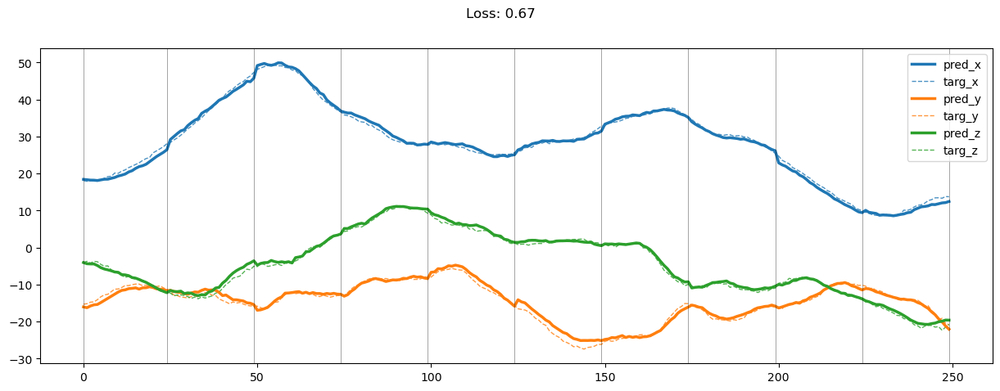

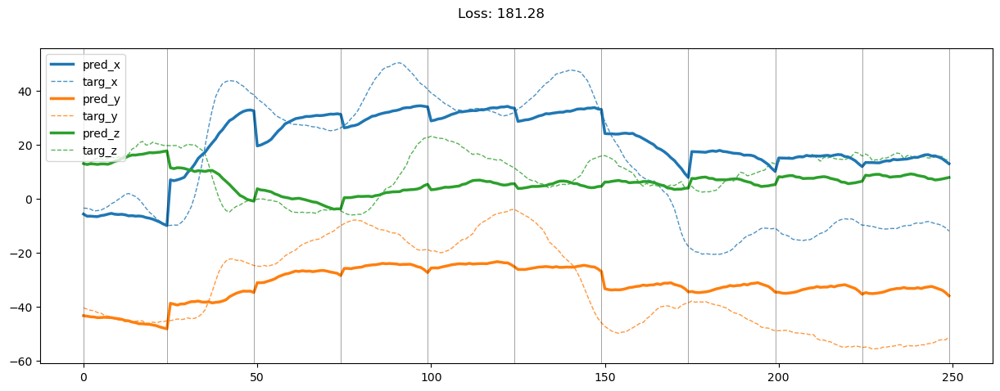

01499: train pred loss:  1.088, g loss:  1.508, d loss:  1.489
       valid pred loss:  135.108, g loss:  135.531, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01500: train pred loss:  1.047, g loss:  1.472, d loss:  1.486
       valid pred loss:  142.446, g loss:  142.874, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01501: train pred loss:  1.034, g loss:  1.463, d loss:  1.482
       valid pred loss:  144.335, g loss:  144.766, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01502: train pred loss:  1.054, g loss:  1.487, d loss:  1.479
       valid pred loss:  143.881, g loss:  144.316, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01503: train pred loss:  1.097, g loss:  1.533, d loss:  1.476
       valid pred loss:  145.134, g loss:  145.573, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01504: train pred loss:  1.076, g loss:  1.516, d loss:  1.473
       valid pred loss:  138.848, g loss:  139.290, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01505: train pred loss:  1.124, g loss:  1.567, d loss:  1.470
       valid pred loss:  137.088, g loss:  137.533, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01506: train pred loss:  1.093, g loss:  1.539, d loss:  1.468
       valid pred loss:  140.955, g loss:  141.404, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01507: train pred loss:  1.060, g loss:  1.510, d loss:  1.465
       valid pred loss:  137.176, g loss:  137.627, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01508: train pred loss:  1.102, g loss:  1.554, d loss:  1.463
       valid pred loss:  139.935, g loss:  140.389, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01509: train pred loss:  1.118, g loss:  1.572, d loss:  1.462
       valid pred loss:  135.820, g loss:  136.275, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01510: train pred loss:  1.094, g loss:  1.551, d loss:  1.460
       valid pred loss:  135.020, g loss:  135.477, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01511: train pred loss:  1.098, g loss:  1.557, d loss:  1.459
       valid pred loss:  136.498, g loss:  136.957, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01512: train pred loss:  1.106, g loss:  1.565, d loss:  1.458
       valid pred loss:  137.181, g loss:  137.641, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01513: train pred loss:  1.088, g loss:  1.548, d loss:  1.457
       valid pred loss:  135.184, g loss:  135.645, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01514: train pred loss:  1.092, g loss:  1.553, d loss:  1.457
       valid pred loss:  144.501, g loss:  144.962, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01515: train pred loss:  1.049, g loss:  1.510, d loss:  1.457
       valid pred loss:  148.684, g loss:  149.145, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01516: train pred loss:  1.073, g loss:  1.534, d loss:  1.457
       valid pred loss:  147.996, g loss:  148.456, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01517: train pred loss:  1.055, g loss:  1.515, d loss:  1.457
       valid pred loss:  144.718, g loss:  145.178, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01518: train pred loss:  1.094, g loss:  1.553, d loss:  1.458
       valid pred loss:  149.574, g loss:  150.032, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01519: train pred loss:  1.093, g loss:  1.551, d loss:  1.459
       valid pred loss:  144.565, g loss:  145.021, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01520: train pred loss:  1.073, g loss:  1.528, d loss:  1.461
       valid pred loss:  139.297, g loss:  139.751, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01521: train pred loss:  1.039, g loss:  1.492, d loss:  1.462
       valid pred loss:  142.426, g loss:  142.878, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01522: train pred loss:  1.105, g loss:  1.556, d loss:  1.465
       valid pred loss:  148.862, g loss:  149.310, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01523: train pred loss:  1.123, g loss:  1.570, d loss:  1.467
       valid pred loss:  142.884, g loss:  143.330, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01524: train pred loss:  1.133, g loss:  1.577, d loss:  1.469
       valid pred loss:  133.476, g loss:  133.918, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01525: train pred loss:  1.118, g loss:  1.558, d loss:  1.473
       valid pred loss:  143.944, g loss:  144.382, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


01526: train pred loss:  1.158, g loss:  1.594, d loss:  1.476
       valid pred loss:  139.567, g loss:  140.001, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01527: train pred loss:  1.149, g loss:  1.581, d loss:  1.479
       valid pred loss:  139.385, g loss:  139.815, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01528: train pred loss:  1.161, g loss:  1.589, d loss:  1.483
       valid pred loss:  137.407, g loss:  137.832, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01529: train pred loss:  1.215, g loss:  1.638, d loss:  1.487
       valid pred loss:  135.104, g loss:  135.525, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01530: train pred loss:  1.310, g loss:  1.729, d loss:  1.491
       valid pred loss:  143.691, g loss:  144.107, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01531: train pred loss:  1.343, g loss:  1.757, d loss:  1.495
       valid pred loss:  147.434, g loss:  147.846, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01532: train pred loss:  1.264, g loss:  1.673, d loss:  1.500
       valid pred loss:  141.322, g loss:  141.729, d loss:  1.503


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01533: train pred loss:  1.304, g loss:  1.709, d loss:  1.505
       valid pred loss:  143.152, g loss:  143.554, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01534: train pred loss:  1.429, g loss:  1.829, d loss:  1.509
       valid pred loss:  140.800, g loss:  141.198, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01535: train pred loss:  1.449, g loss:  1.845, d loss:  1.514
       valid pred loss:  146.789, g loss:  147.182, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01536: train pred loss:  1.516, g loss:  1.907, d loss:  1.519
       valid pred loss:  170.010, g loss:  170.398, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01537: train pred loss:  1.496, g loss:  1.882, d loss:  1.524
       valid pred loss:  145.309, g loss:  145.693, d loss:  1.527


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01538: train pred loss:  1.522, g loss:  1.904, d loss:  1.529
       valid pred loss:  133.369, g loss:  133.749, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01539: train pred loss:  1.363, g loss:  1.742, d loss:  1.534
       valid pred loss:  141.177, g loss:  141.553, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


01540: train pred loss:  6.079, g loss:  6.453, d loss:  1.539
       valid pred loss:  135.185, g loss:  135.558, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01541: train pred loss:  7.871, g loss:  8.242, d loss:  1.542
       valid pred loss:  290.628, g loss:  290.996, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01542: train pred loss:  15.977, g loss:  16.344, d loss:  1.547
       valid pred loss:  235.334, g loss:  235.699, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01543: train pred loss:  25.422, g loss:  25.786, d loss:  1.551
       valid pred loss:  171.446, g loss:  171.808, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01544: train pred loss:  26.140, g loss:  26.501, d loss:  1.555
       valid pred loss:  235.195, g loss:  235.554, d loss:  1.559


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01545: train pred loss:  33.519, g loss:  33.877, d loss:  1.559
       valid pred loss:  140.565, g loss:  140.922, d loss:  1.561


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01546: train pred loss:  24.150, g loss:  24.505, d loss:  1.562
       valid pred loss:  148.324, g loss:  148.678, d loss:  1.564


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01547: train pred loss:  22.287, g loss:  22.640, d loss:  1.565
       valid pred loss:  160.013, g loss:  160.366, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01548: train pred loss:  18.383, g loss:  18.734, d loss:  1.568
       valid pred loss:  171.130, g loss:  171.480, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


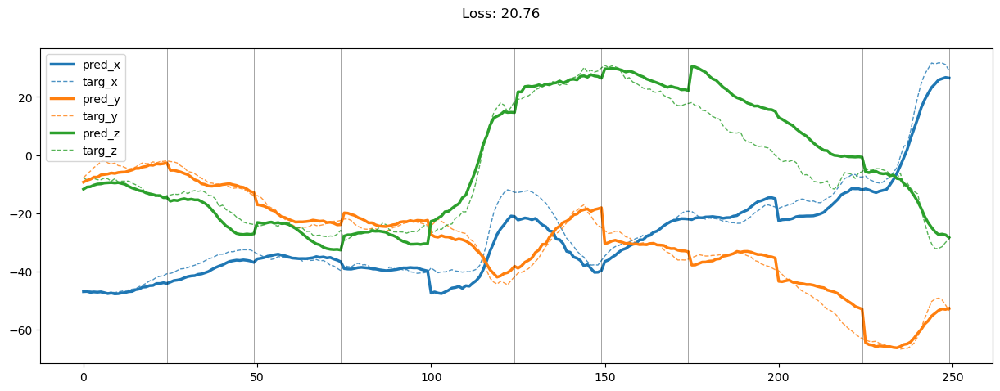

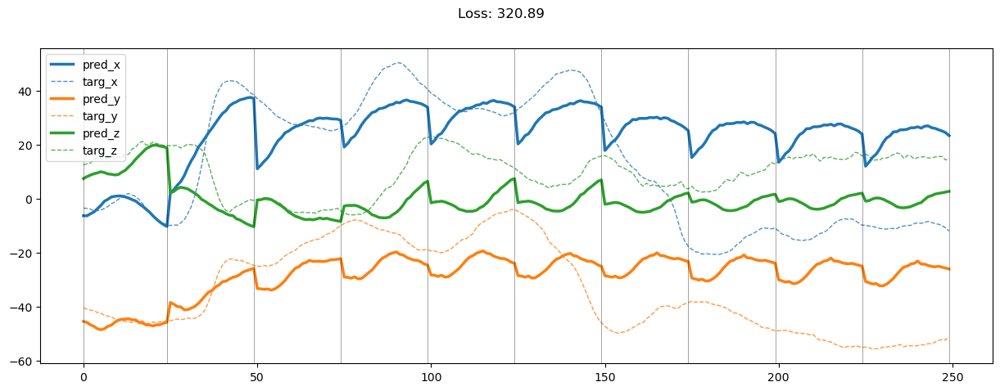

01549: train pred loss:  15.519, g loss:  15.869, d loss:  1.570
       valid pred loss:  114.482, g loss:  114.831, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01550: train pred loss:  13.879, g loss:  14.228, d loss:  1.572
       valid pred loss:  113.929, g loss:  114.277, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01551: train pred loss:  10.437, g loss:  10.784, d loss:  1.573
       valid pred loss:  114.038, g loss:  114.386, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01552: train pred loss:  9.148, g loss:  9.495, d loss:  1.574
       valid pred loss:  120.662, g loss:  121.009, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01553: train pred loss:  7.781, g loss:  8.127, d loss:  1.575
       valid pred loss:  114.912, g loss:  115.259, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01554: train pred loss:  6.336, g loss:  6.683, d loss:  1.574
       valid pred loss:  110.935, g loss:  111.282, d loss:  1.574


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01555: train pred loss:  5.473, g loss:  5.820, d loss:  1.574
       valid pred loss:  108.323, g loss:  108.671, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01556: train pred loss:  4.952, g loss:  5.300, d loss:  1.573
       valid pred loss:  105.746, g loss:  106.095, d loss:  1.572


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01557: train pred loss:  4.161, g loss:  4.510, d loss:  1.571
       valid pred loss:  104.763, g loss:  105.113, d loss:  1.570


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01558: train pred loss:  3.935, g loss:  4.285, d loss:  1.569
       valid pred loss:  100.328, g loss:  100.680, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01559: train pred loss:  3.613, g loss:  3.965, d loss:  1.566
       valid pred loss:  102.517, g loss:  102.871, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01560: train pred loss:  3.195, g loss:  3.549, d loss:  1.564
       valid pred loss:  103.913, g loss:  104.269, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01561: train pred loss:  2.974, g loss:  3.331, d loss:  1.560
       valid pred loss:  98.879, g loss:  99.238, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.01it/s]


01562: train pred loss:  2.850, g loss:  3.210, d loss:  1.557
       valid pred loss:  96.936, g loss:  97.297, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


01563: train pred loss:  2.738, g loss:  3.101, d loss:  1.553
       valid pred loss:  102.967, g loss:  103.332, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.32it/s]


01564: train pred loss:  2.611, g loss:  2.977, d loss:  1.548
       valid pred loss:  102.275, g loss:  102.643, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01565: train pred loss:  2.474, g loss:  2.844, d loss:  1.544
       valid pred loss:  98.341, g loss:  98.713, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01566: train pred loss:  2.392, g loss:  2.766, d loss:  1.539
       valid pred loss:  101.031, g loss:  101.407, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01567: train pred loss:  2.275, g loss:  2.653, d loss:  1.534
       valid pred loss:  103.477, g loss:  103.858, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01568: train pred loss:  2.170, g loss:  2.552, d loss:  1.529
       valid pred loss:  102.321, g loss:  102.706, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01569: train pred loss:  2.113, g loss:  2.500, d loss:  1.524
       valid pred loss:  101.320, g loss:  101.710, d loss:  1.521


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01570: train pred loss:  2.051, g loss:  2.443, d loss:  1.518
       valid pred loss:  101.502, g loss:  101.896, d loss:  1.516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.60it/s]


01571: train pred loss:  1.987, g loss:  2.383, d loss:  1.513
       valid pred loss:  102.941, g loss:  103.341, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01572: train pred loss:  1.907, g loss:  2.309, d loss:  1.508
       valid pred loss:  105.666, g loss:  106.071, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01573: train pred loss:  1.952, g loss:  2.358, d loss:  1.503
       valid pred loss:  105.504, g loss:  105.913, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01574: train pred loss:  1.872, g loss:  2.283, d loss:  1.498
       valid pred loss:  103.090, g loss:  103.505, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01575: train pred loss:  1.870, g loss:  2.287, d loss:  1.493
       valid pred loss:  102.971, g loss:  103.390, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01576: train pred loss:  1.864, g loss:  2.286, d loss:  1.489
       valid pred loss:  100.592, g loss:  101.016, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.52it/s]


01577: train pred loss:  1.818, g loss:  2.244, d loss:  1.484
       valid pred loss:  103.715, g loss:  104.145, d loss:  1.481


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01578: train pred loss:  1.839, g loss:  2.270, d loss:  1.480
       valid pred loss:  103.526, g loss:  103.960, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01579: train pred loss:  1.825, g loss:  2.261, d loss:  1.476
       valid pred loss:  105.369, g loss:  105.808, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01580: train pred loss:  1.746, g loss:  2.187, d loss:  1.472
       valid pred loss:  107.328, g loss:  107.772, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01581: train pred loss:  1.713, g loss:  2.158, d loss:  1.469
       valid pred loss:  104.634, g loss:  105.082, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01582: train pred loss:  1.727, g loss:  2.176, d loss:  1.465
       valid pred loss:  105.902, g loss:  106.355, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01583: train pred loss:  1.687, g loss:  2.141, d loss:  1.462
       valid pred loss:  103.074, g loss:  103.530, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01584: train pred loss:  1.689, g loss:  2.146, d loss:  1.459
       valid pred loss:  101.107, g loss:  101.567, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01585: train pred loss:  1.674, g loss:  2.135, d loss:  1.457
       valid pred loss:  102.395, g loss:  102.858, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01586: train pred loss:  1.696, g loss:  2.160, d loss:  1.454
       valid pred loss:  102.136, g loss:  102.603, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01587: train pred loss:  1.668, g loss:  2.136, d loss:  1.452
       valid pred loss:  102.780, g loss:  103.249, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.40it/s]


01588: train pred loss:  1.574, g loss:  2.045, d loss:  1.450
       valid pred loss:  104.265, g loss:  104.737, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01589: train pred loss:  1.632, g loss:  2.105, d loss:  1.449
       valid pred loss:  102.634, g loss:  103.108, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01590: train pred loss:  1.583, g loss:  2.057, d loss:  1.447
       valid pred loss:  103.092, g loss:  103.568, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01591: train pred loss:  1.566, g loss:  2.042, d loss:  1.447
       valid pred loss:  104.290, g loss:  104.767, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01592: train pred loss:  1.553, g loss:  2.029, d loss:  1.446
       valid pred loss:  103.425, g loss:  103.903, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01593: train pred loss:  1.550, g loss:  2.027, d loss:  1.446
       valid pred loss:  105.484, g loss:  105.961, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01594: train pred loss:  1.515, g loss:  1.993, d loss:  1.446
       valid pred loss:  105.499, g loss:  105.977, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01595: train pred loss:  1.525, g loss:  2.002, d loss:  1.446
       valid pred loss:  104.201, g loss:  104.677, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01596: train pred loss:  1.511, g loss:  1.987, d loss:  1.447
       valid pred loss:  103.680, g loss:  104.156, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01597: train pred loss:  1.515, g loss:  1.989, d loss:  1.448
       valid pred loss:  103.912, g loss:  104.386, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01598: train pred loss:  1.493, g loss:  1.965, d loss:  1.449
       valid pred loss:  105.639, g loss:  106.110, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


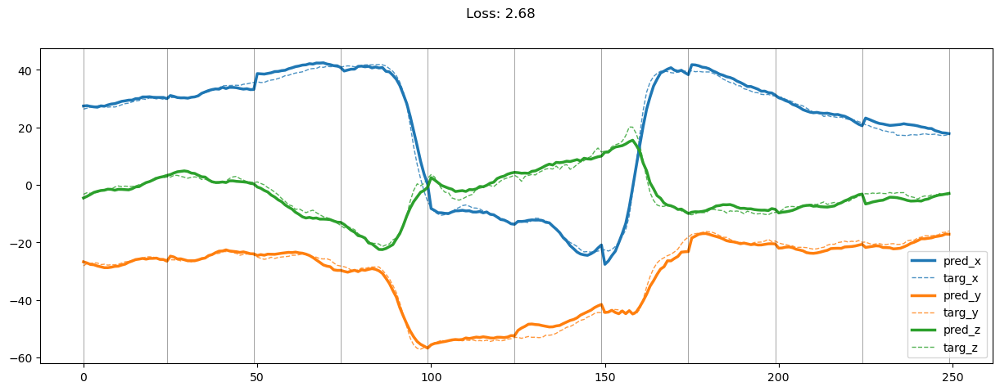

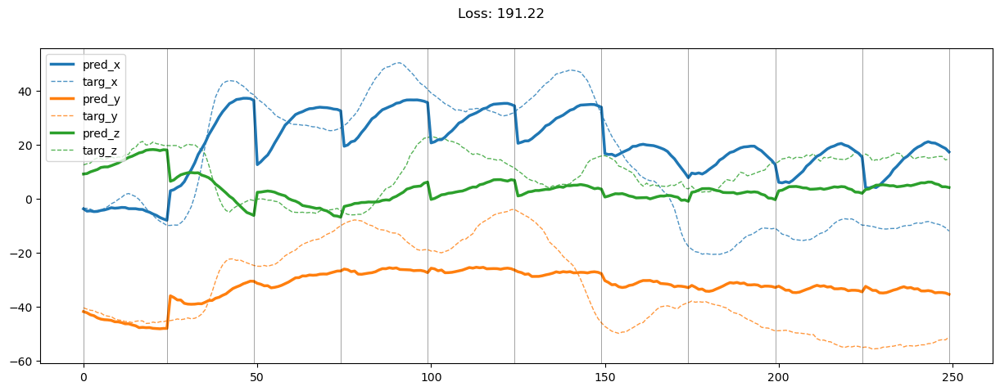

01599: train pred loss:  1.468, g loss:  1.939, d loss:  1.450
       valid pred loss:  105.863, g loss:  106.332, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01600: train pred loss:  1.496, g loss:  1.963, d loss:  1.452
       valid pred loss:  106.475, g loss:  106.941, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01601: train pred loss:  1.464, g loss:  1.928, d loss:  1.455
       valid pred loss:  104.714, g loss:  105.176, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01602: train pred loss:  1.430, g loss:  1.890, d loss:  1.457
       valid pred loss:  103.217, g loss:  103.675, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01603: train pred loss:  1.476, g loss:  1.932, d loss:  1.460
       valid pred loss:  102.133, g loss:  102.587, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01604: train pred loss:  1.458, g loss:  1.910, d loss:  1.464
       valid pred loss:  101.282, g loss:  101.732, d loss:  1.465


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01605: train pred loss:  1.432, g loss:  1.879, d loss:  1.467
       valid pred loss:  101.150, g loss:  101.594, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01606: train pred loss:  1.444, g loss:  1.886, d loss:  1.471
       valid pred loss:  102.504, g loss:  102.943, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01607: train pred loss:  1.404, g loss:  1.842, d loss:  1.475
       valid pred loss:  103.358, g loss:  103.793, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01608: train pred loss:  1.364, g loss:  1.796, d loss:  1.479
       valid pred loss:  103.991, g loss:  104.420, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01609: train pred loss:  1.402, g loss:  1.828, d loss:  1.484
       valid pred loss:  103.081, g loss:  103.504, d loss:  1.486


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01610: train pred loss:  1.397, g loss:  1.818, d loss:  1.489
       valid pred loss:  102.957, g loss:  103.375, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01611: train pred loss:  1.401, g loss:  1.817, d loss:  1.494
       valid pred loss:  104.654, g loss:  105.067, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01612: train pred loss:  1.381, g loss:  1.791, d loss:  1.499
       valid pred loss:  105.684, g loss:  106.091, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01613: train pred loss:  1.415, g loss:  1.820, d loss:  1.505
       valid pred loss:  105.057, g loss:  105.458, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01614: train pred loss:  1.395, g loss:  1.795, d loss:  1.510
       valid pred loss:  105.035, g loss:  105.432, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01615: train pred loss:  1.361, g loss:  1.755, d loss:  1.516
       valid pred loss:  104.234, g loss:  104.625, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01616: train pred loss:  1.348, g loss:  1.737, d loss:  1.521
       valid pred loss:  103.955, g loss:  104.341, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01617: train pred loss:  1.324, g loss:  1.708, d loss:  1.527
       valid pred loss:  105.672, g loss:  106.053, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01618: train pred loss:  1.295, g loss:  1.674, d loss:  1.533
       valid pred loss:  105.365, g loss:  105.742, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01619: train pred loss:  1.324, g loss:  1.699, d loss:  1.538
       valid pred loss:  103.685, g loss:  104.057, d loss:  1.541


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01620: train pred loss:  1.332, g loss:  1.702, d loss:  1.544
       valid pred loss:  105.202, g loss:  105.569, d loss:  1.547


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01621: train pred loss:  1.297, g loss:  1.663, d loss:  1.549
       valid pred loss:  109.547, g loss:  109.910, d loss:  1.552


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01622: train pred loss:  1.382, g loss:  1.743, d loss:  1.555
       valid pred loss:  107.485, g loss:  107.844, d loss:  1.557


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01623: train pred loss:  1.307, g loss:  1.664, d loss:  1.560
       valid pred loss:  105.442, g loss:  105.798, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01624: train pred loss:  1.302, g loss:  1.655, d loss:  1.565
       valid pred loss:  104.137, g loss:  104.489, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01625: train pred loss:  1.295, g loss:  1.645, d loss:  1.569
       valid pred loss:  104.215, g loss:  104.564, d loss:  1.572


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01626: train pred loss:  1.270, g loss:  1.617, d loss:  1.573
       valid pred loss:  105.245, g loss:  105.591, d loss:  1.576


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.17it/s]


01627: train pred loss:  1.266, g loss:  1.610, d loss:  1.577
       valid pred loss:  104.590, g loss:  104.934, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.32it/s]


01628: train pred loss:  1.271, g loss:  1.613, d loss:  1.581
       valid pred loss:  105.941, g loss:  106.281, d loss:  1.584


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01629: train pred loss:  1.272, g loss:  1.612, d loss:  1.584
       valid pred loss:  104.502, g loss:  104.840, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01630: train pred loss:  1.265, g loss:  1.603, d loss:  1.587
       valid pred loss:  102.820, g loss:  103.157, d loss:  1.589


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.53it/s]


01631: train pred loss:  1.245, g loss:  1.581, d loss:  1.589
       valid pred loss:  103.937, g loss:  104.273, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01632: train pred loss:  1.237, g loss:  1.572, d loss:  1.591
       valid pred loss:  104.207, g loss:  104.542, d loss:  1.593


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01633: train pred loss:  1.246, g loss:  1.580, d loss:  1.593
       valid pred loss:  107.550, g loss:  107.883, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01634: train pred loss:  1.275, g loss:  1.608, d loss:  1.594
       valid pred loss:  106.554, g loss:  106.887, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.91it/s]


01635: train pred loss:  1.260, g loss:  1.594, d loss:  1.594
       valid pred loss:  106.355, g loss:  106.688, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.49it/s]


01636: train pred loss:  1.216, g loss:  1.549, d loss:  1.594
       valid pred loss:  105.634, g loss:  105.967, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01637: train pred loss:  1.242, g loss:  1.575, d loss:  1.594
       valid pred loss:  106.111, g loss:  106.445, d loss:  1.593


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01638: train pred loss:  1.207, g loss:  1.541, d loss:  1.592
       valid pred loss:  105.956, g loss:  106.291, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01639: train pred loss:  1.213, g loss:  1.548, d loss:  1.591
       valid pred loss:  106.364, g loss:  106.701, d loss:  1.590


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01640: train pred loss:  1.205, g loss:  1.542, d loss:  1.588
       valid pred loss:  107.137, g loss:  107.475, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01641: train pred loss:  1.200, g loss:  1.539, d loss:  1.586
       valid pred loss:  108.283, g loss:  108.623, d loss:  1.584


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01642: train pred loss:  1.231, g loss:  1.572, d loss:  1.583
       valid pred loss:  107.622, g loss:  107.964, d loss:  1.581


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01643: train pred loss:  1.198, g loss:  1.541, d loss:  1.580
       valid pred loss:  110.031, g loss:  110.376, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01644: train pred loss:  1.217, g loss:  1.563, d loss:  1.575
       valid pred loss:  108.843, g loss:  109.190, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01645: train pred loss:  1.197, g loss:  1.546, d loss:  1.571
       valid pred loss:  108.317, g loss:  108.668, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01646: train pred loss:  1.195, g loss:  1.547, d loss:  1.566
       valid pred loss:  108.220, g loss:  108.575, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01647: train pred loss:  1.168, g loss:  1.524, d loss:  1.562
       valid pred loss:  108.658, g loss:  109.017, d loss:  1.559


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01648: train pred loss:  1.203, g loss:  1.563, d loss:  1.556
       valid pred loss:  108.858, g loss:  109.220, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


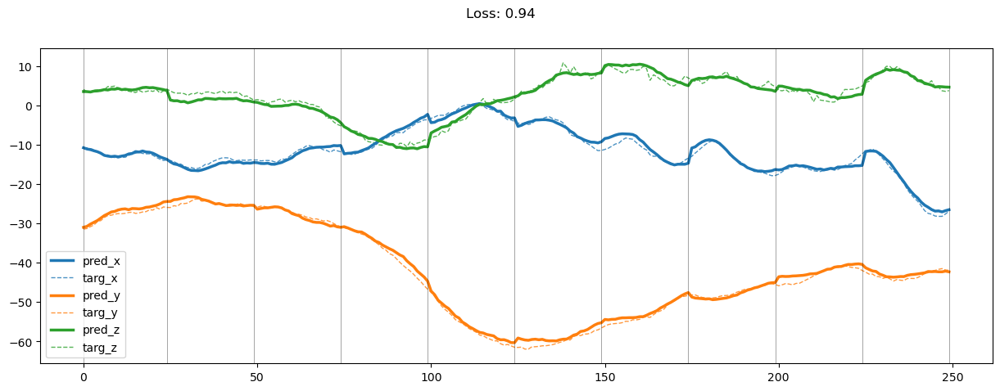

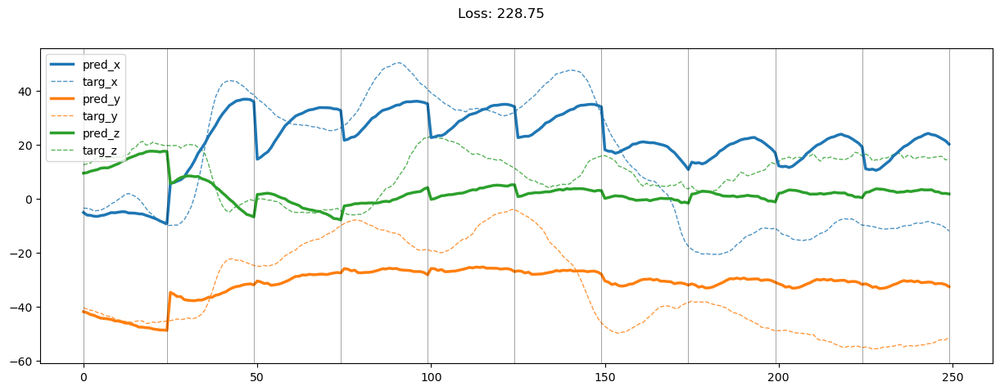

01649: train pred loss:  1.185, g loss:  1.549, d loss:  1.551
       valid pred loss:  110.029, g loss:  110.396, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01650: train pred loss:  1.179, g loss:  1.548, d loss:  1.545
       valid pred loss:  109.160, g loss:  109.531, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01651: train pred loss:  1.182, g loss:  1.555, d loss:  1.540
       valid pred loss:  108.147, g loss:  108.524, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.33it/s]


01652: train pred loss:  1.192, g loss:  1.570, d loss:  1.534
       valid pred loss:  109.089, g loss:  109.470, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.12it/s]


01653: train pred loss:  1.209, g loss:  1.592, d loss:  1.528
       valid pred loss:  108.530, g loss:  108.917, d loss:  1.524


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01654: train pred loss:  1.144, g loss:  1.533, d loss:  1.522
       valid pred loss:  109.888, g loss:  110.279, d loss:  1.518


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01655: train pred loss:  1.134, g loss:  1.527, d loss:  1.516
       valid pred loss:  109.800, g loss:  110.197, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01656: train pred loss:  1.196, g loss:  1.595, d loss:  1.510
       valid pred loss:  108.379, g loss:  108.782, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


01657: train pred loss:  1.149, g loss:  1.554, d loss:  1.504
       valid pred loss:  108.471, g loss:  108.879, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01658: train pred loss:  1.113, g loss:  1.524, d loss:  1.499
       valid pred loss:  108.854, g loss:  109.268, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01659: train pred loss:  1.151, g loss:  1.567, d loss:  1.494
       valid pred loss:  108.955, g loss:  109.374, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01660: train pred loss:  1.150, g loss:  1.572, d loss:  1.489
       valid pred loss:  109.489, g loss:  109.914, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01661: train pred loss:  1.135, g loss:  1.563, d loss:  1.483
       valid pred loss:  111.866, g loss:  112.297, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01662: train pred loss:  1.146, g loss:  1.579, d loss:  1.478
       valid pred loss:  111.616, g loss:  112.052, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01663: train pred loss:  1.142, g loss:  1.580, d loss:  1.474
       valid pred loss:  112.837, g loss:  113.278, d loss:  1.471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01664: train pred loss:  1.113, g loss:  1.557, d loss:  1.470
       valid pred loss:  112.865, g loss:  113.312, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01665: train pred loss:  1.126, g loss:  1.576, d loss:  1.465
       valid pred loss:  109.822, g loss:  110.274, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01666: train pred loss:  1.154, g loss:  1.608, d loss:  1.462
       valid pred loss:  113.103, g loss:  113.560, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01667: train pred loss:  1.146, g loss:  1.605, d loss:  1.458
       valid pred loss:  113.898, g loss:  114.360, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01668: train pred loss:  1.128, g loss:  1.591, d loss:  1.455
       valid pred loss:  112.432, g loss:  112.898, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01669: train pred loss:  1.126, g loss:  1.594, d loss:  1.452
       valid pred loss:  113.141, g loss:  113.612, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01670: train pred loss:  1.137, g loss:  1.609, d loss:  1.449
       valid pred loss:  113.189, g loss:  113.664, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01671: train pred loss:  1.123, g loss:  1.599, d loss:  1.446
       valid pred loss:  111.776, g loss:  112.255, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01672: train pred loss:  1.132, g loss:  1.611, d loss:  1.444
       valid pred loss:  110.701, g loss:  111.183, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01673: train pred loss:  1.112, g loss:  1.595, d loss:  1.442
       valid pred loss:  108.881, g loss:  109.366, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01674: train pred loss:  1.141, g loss:  1.627, d loss:  1.441
       valid pred loss:  109.621, g loss:  110.109, d loss:  1.440


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01675: train pred loss:  1.094, g loss:  1.582, d loss:  1.439
       valid pred loss:  112.557, g loss:  113.046, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01676: train pred loss:  1.086, g loss:  1.576, d loss:  1.438
       valid pred loss:  110.334, g loss:  110.825, d loss:  1.438


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01677: train pred loss:  1.098, g loss:  1.590, d loss:  1.437
       valid pred loss:  110.990, g loss:  111.482, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01678: train pred loss:  1.130, g loss:  1.623, d loss:  1.436
       valid pred loss:  111.492, g loss:  111.985, d loss:  1.436


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01679: train pred loss:  1.111, g loss:  1.604, d loss:  1.436
       valid pred loss:  111.837, g loss:  112.330, d loss:  1.436


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01680: train pred loss:  1.131, g loss:  1.624, d loss:  1.436
       valid pred loss:  113.111, g loss:  113.604, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01681: train pred loss:  1.150, g loss:  1.642, d loss:  1.437
       valid pred loss:  112.320, g loss:  112.812, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01682: train pred loss:  1.179, g loss:  1.671, d loss:  1.437
       valid pred loss:  110.349, g loss:  110.840, d loss:  1.438


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01683: train pred loss:  1.142, g loss:  1.632, d loss:  1.438
       valid pred loss:  108.446, g loss:  108.936, d loss:  1.438


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01684: train pred loss:  1.102, g loss:  1.591, d loss:  1.439
       valid pred loss:  110.963, g loss:  111.450, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01685: train pred loss:  1.129, g loss:  1.615, d loss:  1.440
       valid pred loss:  112.043, g loss:  112.528, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01686: train pred loss:  1.123, g loss:  1.606, d loss:  1.442
       valid pred loss:  111.964, g loss:  112.446, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01687: train pred loss:  1.118, g loss:  1.598, d loss:  1.444
       valid pred loss:  112.863, g loss:  113.341, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01688: train pred loss:  1.122, g loss:  1.598, d loss:  1.447
       valid pred loss:  111.316, g loss:  111.790, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01689: train pred loss:  1.113, g loss:  1.585, d loss:  1.449
       valid pred loss:  113.373, g loss:  113.842, d loss:  1.451


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01690: train pred loss:  1.096, g loss:  1.564, d loss:  1.452
       valid pred loss:  114.045, g loss:  114.510, d loss:  1.454


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01691: train pred loss:  1.069, g loss:  1.532, d loss:  1.456
       valid pred loss:  112.512, g loss:  112.972, d loss:  1.457


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01692: train pred loss:  1.085, g loss:  1.543, d loss:  1.459
       valid pred loss:  112.239, g loss:  112.693, d loss:  1.461


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01693: train pred loss:  1.052, g loss:  1.504, d loss:  1.463
       valid pred loss:  110.273, g loss:  110.722, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01694: train pred loss:  1.088, g loss:  1.534, d loss:  1.467
       valid pred loss:  109.621, g loss:  110.065, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01695: train pred loss:  1.074, g loss:  1.515, d loss:  1.472
       valid pred loss:  114.003, g loss:  114.441, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01696: train pred loss:  1.056, g loss:  1.491, d loss:  1.477
       valid pred loss:  113.654, g loss:  114.086, d loss:  1.480


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01697: train pred loss:  1.069, g loss:  1.498, d loss:  1.482
       valid pred loss:  111.363, g loss:  111.788, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01698: train pred loss:  1.075, g loss:  1.498, d loss:  1.487
       valid pred loss:  112.444, g loss:  112.864, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


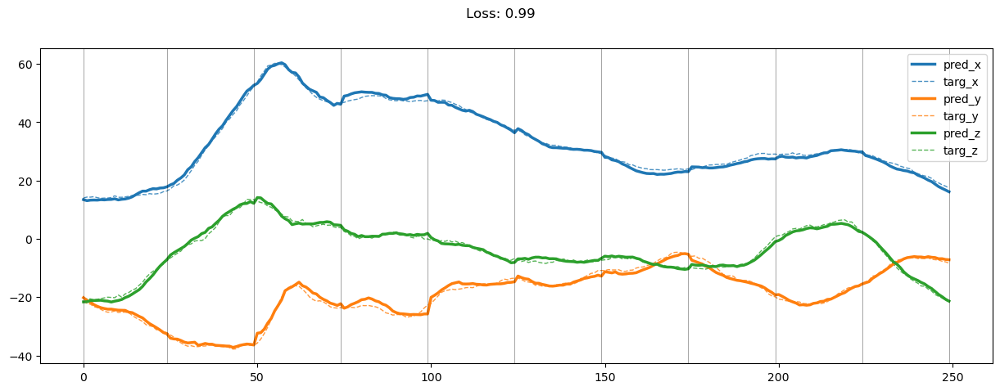

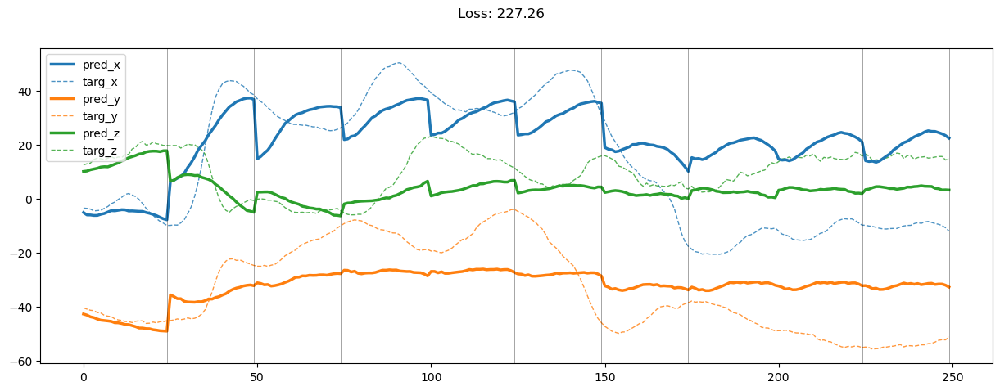

01699: train pred loss:  1.074, g loss:  1.491, d loss:  1.493
       valid pred loss:  113.274, g loss:  113.688, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01700: train pred loss:  1.074, g loss:  1.485, d loss:  1.498
       valid pred loss:  112.873, g loss:  113.280, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01701: train pred loss:  1.062, g loss:  1.467, d loss:  1.504
       valid pred loss:  112.993, g loss:  113.395, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01702: train pred loss:  1.063, g loss:  1.462, d loss:  1.510
       valid pred loss:  112.310, g loss:  112.706, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01703: train pred loss:  1.046, g loss:  1.440, d loss:  1.517
       valid pred loss:  112.268, g loss:  112.659, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01704: train pred loss:  1.061, g loss:  1.449, d loss:  1.522
       valid pred loss:  113.204, g loss:  113.589, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01705: train pred loss:  1.058, g loss:  1.440, d loss:  1.528
       valid pred loss:  113.063, g loss:  113.442, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01706: train pred loss:  1.045, g loss:  1.422, d loss:  1.534
       valid pred loss:  114.799, g loss:  115.173, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01707: train pred loss:  1.055, g loss:  1.427, d loss:  1.541
       valid pred loss:  114.251, g loss:  114.620, d loss:  1.544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01708: train pred loss:  1.036, g loss:  1.403, d loss:  1.547
       valid pred loss:  113.081, g loss:  113.446, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01709: train pred loss:  1.075, g loss:  1.438, d loss:  1.553
       valid pred loss:  114.046, g loss:  114.406, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01710: train pred loss:  1.061, g loss:  1.419, d loss:  1.559
       valid pred loss:  113.634, g loss:  113.990, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01711: train pred loss:  1.054, g loss:  1.408, d loss:  1.565
       valid pred loss:  113.057, g loss:  113.409, d loss:  1.567


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.43it/s]


01712: train pred loss:  1.040, g loss:  1.390, d loss:  1.570
       valid pred loss:  111.714, g loss:  112.062, d loss:  1.573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.21it/s]


01713: train pred loss:  1.048, g loss:  1.395, d loss:  1.575
       valid pred loss:  115.238, g loss:  115.582, d loss:  1.578


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01714: train pred loss:  1.024, g loss:  1.367, d loss:  1.581
       valid pred loss:  116.686, g loss:  117.026, d loss:  1.583


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01715: train pred loss:  1.057, g loss:  1.396, d loss:  1.585
       valid pred loss:  116.243, g loss:  116.580, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01716: train pred loss:  1.037, g loss:  1.373, d loss:  1.590
       valid pred loss:  115.861, g loss:  116.195, d loss:  1.592


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01717: train pred loss:  1.044, g loss:  1.377, d loss:  1.594
       valid pred loss:  116.482, g loss:  116.814, d loss:  1.596


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01718: train pred loss:  1.027, g loss:  1.358, d loss:  1.598
       valid pred loss:  117.096, g loss:  117.426, d loss:  1.600


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01719: train pred loss:  1.035, g loss:  1.363, d loss:  1.601
       valid pred loss:  115.840, g loss:  116.168, d loss:  1.603


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01720: train pred loss:  1.014, g loss:  1.340, d loss:  1.605
       valid pred loss:  114.690, g loss:  115.016, d loss:  1.606


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01721: train pred loss:  1.035, g loss:  1.360, d loss:  1.607
       valid pred loss:  114.663, g loss:  114.988, d loss:  1.608


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01722: train pred loss:  1.047, g loss:  1.371, d loss:  1.609
       valid pred loss:  113.042, g loss:  113.365, d loss:  1.610


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01723: train pred loss:  0.995, g loss:  1.317, d loss:  1.611
       valid pred loss:  114.589, g loss:  114.911, d loss:  1.612


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01724: train pred loss:  1.018, g loss:  1.340, d loss:  1.612
       valid pred loss:  112.518, g loss:  112.840, d loss:  1.614


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01725: train pred loss:  1.012, g loss:  1.333, d loss:  1.613
       valid pred loss:  112.612, g loss:  112.933, d loss:  1.614


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01726: train pred loss:  1.015, g loss:  1.336, d loss:  1.614
       valid pred loss:  112.787, g loss:  113.108, d loss:  1.613


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01727: train pred loss:  1.003, g loss:  1.324, d loss:  1.613
       valid pred loss:  113.836, g loss:  114.158, d loss:  1.613


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01728: train pred loss:  1.000, g loss:  1.321, d loss:  1.613
       valid pred loss:  114.638, g loss:  114.961, d loss:  1.612


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01729: train pred loss:  1.024, g loss:  1.346, d loss:  1.612
       valid pred loss:  114.584, g loss:  114.907, d loss:  1.610


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.25it/s]


01730: train pred loss:  1.010, g loss:  1.333, d loss:  1.610
       valid pred loss:  114.749, g loss:  115.073, d loss:  1.609


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.54it/s]


01731: train pred loss:  1.008, g loss:  1.333, d loss:  1.608
       valid pred loss:  115.995, g loss:  116.321, d loss:  1.606


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.86it/s]


01732: train pred loss:  1.006, g loss:  1.332, d loss:  1.605
       valid pred loss:  115.370, g loss:  115.697, d loss:  1.604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.01it/s]


01733: train pred loss:  1.014, g loss:  1.343, d loss:  1.602
       valid pred loss:  114.610, g loss:  114.940, d loss:  1.600


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


01734: train pred loss:  1.022, g loss:  1.352, d loss:  1.598
       valid pred loss:  114.087, g loss:  114.419, d loss:  1.596


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01735: train pred loss:  1.029, g loss:  1.362, d loss:  1.594
       valid pred loss:  114.176, g loss:  114.511, d loss:  1.592


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01736: train pred loss:  1.015, g loss:  1.351, d loss:  1.590
       valid pred loss:  113.086, g loss:  113.424, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01737: train pred loss:  1.041, g loss:  1.380, d loss:  1.586
       valid pred loss:  114.737, g loss:  115.078, d loss:  1.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01738: train pred loss:  1.006, g loss:  1.348, d loss:  1.580
       valid pred loss:  114.695, g loss:  115.040, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01739: train pred loss:  0.993, g loss:  1.339, d loss:  1.575
       valid pred loss:  115.001, g loss:  115.349, d loss:  1.572


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01740: train pred loss:  1.009, g loss:  1.359, d loss:  1.569
       valid pred loss:  115.198, g loss:  115.551, d loss:  1.566


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01741: train pred loss:  0.993, g loss:  1.347, d loss:  1.563
       valid pred loss:  114.812, g loss:  115.169, d loss:  1.560


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01742: train pred loss:  0.982, g loss:  1.342, d loss:  1.557
       valid pred loss:  113.652, g loss:  114.014, d loss:  1.554


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01743: train pred loss:  1.002, g loss:  1.365, d loss:  1.551
       valid pred loss:  113.345, g loss:  113.712, d loss:  1.548


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01744: train pred loss:  0.999, g loss:  1.367, d loss:  1.545
       valid pred loss:  113.386, g loss:  113.757, d loss:  1.542


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01745: train pred loss:  1.003, g loss:  1.377, d loss:  1.539
       valid pred loss:  113.396, g loss:  113.773, d loss:  1.536


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01746: train pred loss:  1.002, g loss:  1.381, d loss:  1.533
       valid pred loss:  114.495, g loss:  114.877, d loss:  1.530


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01747: train pred loss:  0.969, g loss:  1.353, d loss:  1.526
       valid pred loss:  113.886, g loss:  114.274, d loss:  1.523


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01748: train pred loss:  0.995, g loss:  1.385, d loss:  1.520
       valid pred loss:  114.014, g loss:  114.408, d loss:  1.517


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.90it/s]


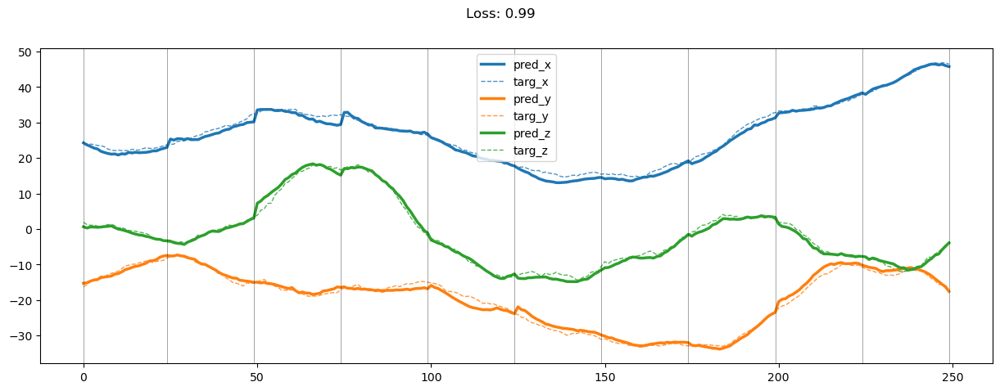

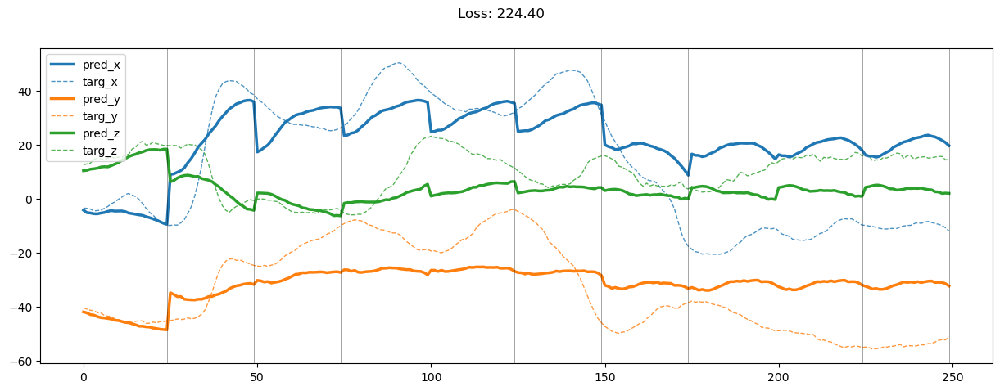

01749: train pred loss:  0.983, g loss:  1.379, d loss:  1.514
       valid pred loss:  114.655, g loss:  115.055, d loss:  1.510


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01750: train pred loss:  0.962, g loss:  1.363, d loss:  1.508
       valid pred loss:  115.653, g loss:  116.058, d loss:  1.505


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.41it/s]


01751: train pred loss:  0.983, g loss:  1.390, d loss:  1.502
       valid pred loss:  114.960, g loss:  115.371, d loss:  1.498


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.13it/s]


01752: train pred loss:  0.992, g loss:  1.405, d loss:  1.496
       valid pred loss:  116.103, g loss:  116.520, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.39it/s]


01753: train pred loss:  0.983, g loss:  1.402, d loss:  1.490
       valid pred loss:  117.138, g loss:  117.561, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01754: train pred loss:  0.990, g loss:  1.416, d loss:  1.485
       valid pred loss:  119.904, g loss:  120.333, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01755: train pred loss:  0.965, g loss:  1.396, d loss:  1.480
       valid pred loss:  119.477, g loss:  119.912, d loss:  1.477


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01756: train pred loss:  0.982, g loss:  1.419, d loss:  1.475
       valid pred loss:  117.493, g loss:  117.934, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.94it/s]


01757: train pred loss:  0.969, g loss:  1.411, d loss:  1.470
       valid pred loss:  116.567, g loss:  117.013, d loss:  1.468


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01758: train pred loss:  0.960, g loss:  1.409, d loss:  1.466
       valid pred loss:  117.473, g loss:  117.925, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.92it/s]


01759: train pred loss:  0.965, g loss:  1.419, d loss:  1.462
       valid pred loss:  117.787, g loss:  118.245, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.93it/s]


01760: train pred loss:  0.947, g loss:  1.407, d loss:  1.458
       valid pred loss:  116.926, g loss:  117.389, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01761: train pred loss:  0.968, g loss:  1.433, d loss:  1.454
       valid pred loss:  118.680, g loss:  119.148, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01762: train pred loss:  0.965, g loss:  1.435, d loss:  1.450
       valid pred loss:  119.072, g loss:  119.545, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.91it/s]


01763: train pred loss:  0.986, g loss:  1.462, d loss:  1.447
       valid pred loss:  119.262, g loss:  119.741, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01764: train pred loss:  0.996, g loss:  1.476, d loss:  1.444
       valid pred loss:  119.647, g loss:  120.130, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01765: train pred loss:  0.992, g loss:  1.477, d loss:  1.441
       valid pred loss:  120.817, g loss:  121.304, d loss:  1.440


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01766: train pred loss:  0.978, g loss:  1.466, d loss:  1.439
       valid pred loss:  120.016, g loss:  120.507, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.47it/s]


01767: train pred loss:  0.981, g loss:  1.473, d loss:  1.436
       valid pred loss:  118.672, g loss:  119.167, d loss:  1.435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.90it/s]


01768: train pred loss:  0.975, g loss:  1.470, d loss:  1.435
       valid pred loss:  117.381, g loss:  117.879, d loss:  1.434


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01769: train pred loss:  0.971, g loss:  1.469, d loss:  1.433
       valid pred loss:  116.840, g loss:  117.340, d loss:  1.433


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01770: train pred loss:  0.958, g loss:  1.460, d loss:  1.432
       valid pred loss:  117.497, g loss:  117.999, d loss:  1.431


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01771: train pred loss:  0.978, g loss:  1.481, d loss:  1.431
       valid pred loss:  117.567, g loss:  118.072, d loss:  1.430


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.89it/s]


01772: train pred loss:  0.976, g loss:  1.482, d loss:  1.430
       valid pred loss:  119.805, g loss:  120.311, d loss:  1.429


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.94it/s]


01773: train pred loss:  0.950, g loss:  1.457, d loss:  1.429
       valid pred loss:  119.224, g loss:  119.732, d loss:  1.428


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01774: train pred loss:  0.970, g loss:  1.478, d loss:  1.428
       valid pred loss:  118.034, g loss:  118.543, d loss:  1.428


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01775: train pred loss:  0.960, g loss:  1.469, d loss:  1.428
       valid pred loss:  117.594, g loss:  118.103, d loss:  1.428


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01776: train pred loss:  0.925, g loss:  1.433, d loss:  1.428
       valid pred loss:  117.658, g loss:  118.166, d loss:  1.429


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01777: train pred loss:  0.960, g loss:  1.468, d loss:  1.428
       valid pred loss:  117.566, g loss:  118.074, d loss:  1.429


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01778: train pred loss:  0.952, g loss:  1.459, d loss:  1.429
       valid pred loss:  119.651, g loss:  120.157, d loss:  1.430


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01779: train pred loss:  0.950, g loss:  1.456, d loss:  1.430
       valid pred loss:  120.101, g loss:  120.605, d loss:  1.430


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01780: train pred loss:  0.940, g loss:  1.443, d loss:  1.431
       valid pred loss:  119.167, g loss:  119.669, d loss:  1.431


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01781: train pred loss:  0.927, g loss:  1.428, d loss:  1.432
       valid pred loss:  118.713, g loss:  119.212, d loss:  1.433


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01782: train pred loss:  0.962, g loss:  1.460, d loss:  1.434
       valid pred loss:  117.848, g loss:  118.344, d loss:  1.435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01783: train pred loss:  0.960, g loss:  1.455, d loss:  1.435
       valid pred loss:  118.010, g loss:  118.503, d loss:  1.437


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01784: train pred loss:  0.942, g loss:  1.433, d loss:  1.438
       valid pred loss:  116.375, g loss:  116.864, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01785: train pred loss:  0.964, g loss:  1.450, d loss:  1.440
       valid pred loss:  117.149, g loss:  117.633, d loss:  1.442


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01786: train pred loss:  0.966, g loss:  1.449, d loss:  1.443
       valid pred loss:  118.727, g loss:  119.206, d loss:  1.445


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01787: train pred loss:  0.943, g loss:  1.420, d loss:  1.446
       valid pred loss:  119.246, g loss:  119.720, d loss:  1.448


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01788: train pred loss:  0.955, g loss:  1.428, d loss:  1.449
       valid pred loss:  116.523, g loss:  116.992, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01789: train pred loss:  0.951, g loss:  1.417, d loss:  1.453
       valid pred loss:  117.536, g loss:  118.000, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01790: train pred loss:  0.962, g loss:  1.424, d loss:  1.456
       valid pred loss:  120.733, g loss:  121.191, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01791: train pred loss:  0.939, g loss:  1.394, d loss:  1.461
       valid pred loss:  120.386, g loss:  120.839, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01792: train pred loss:  0.930, g loss:  1.379, d loss:  1.466
       valid pred loss:  118.027, g loss:  118.474, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01793: train pred loss:  0.932, g loss:  1.375, d loss:  1.470
       valid pred loss:  119.716, g loss:  120.156, d loss:  1.473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01794: train pred loss:  0.945, g loss:  1.382, d loss:  1.475
       valid pred loss:  116.394, g loss:  116.828, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01795: train pred loss:  0.936, g loss:  1.367, d loss:  1.480
       valid pred loss:  118.043, g loss:  118.471, d loss:  1.483


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01796: train pred loss:  0.915, g loss:  1.339, d loss:  1.486
       valid pred loss:  118.193, g loss:  118.615, d loss:  1.488


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01797: train pred loss:  0.942, g loss:  1.361, d loss:  1.491
       valid pred loss:  119.392, g loss:  119.808, d loss:  1.494


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01798: train pred loss:  0.971, g loss:  1.384, d loss:  1.497
       valid pred loss:  119.284, g loss:  119.694, d loss:  1.500


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


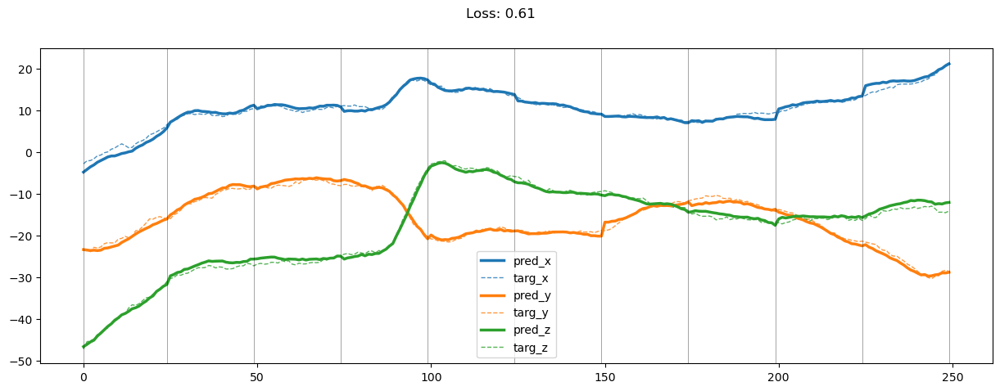

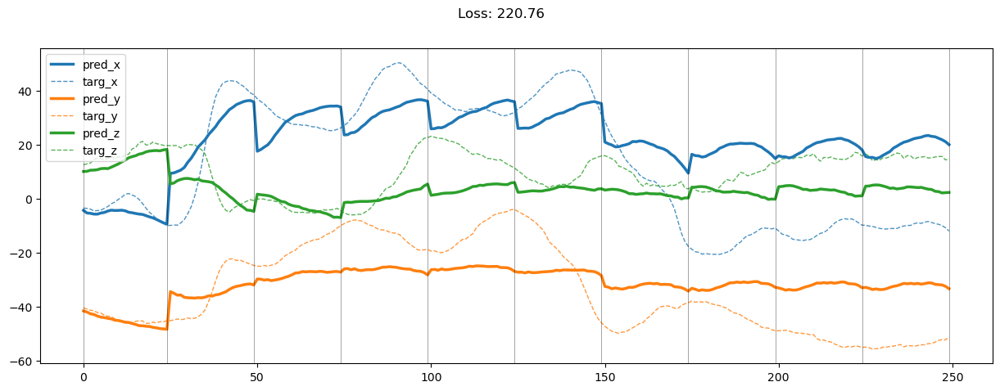

01799: train pred loss:  0.950, g loss:  1.356, d loss:  1.503
       valid pred loss:  119.291, g loss:  119.695, d loss:  1.506


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01800: train pred loss:  0.947, g loss:  1.348, d loss:  1.509
       valid pred loss:  120.145, g loss:  120.542, d loss:  1.512


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01801: train pred loss:  0.929, g loss:  1.324, d loss:  1.515
       valid pred loss:  119.878, g loss:  120.270, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01802: train pred loss:  0.918, g loss:  1.307, d loss:  1.521
       valid pred loss:  118.145, g loss:  118.531, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01803: train pred loss:  0.915, g loss:  1.299, d loss:  1.528
       valid pred loss:  116.977, g loss:  117.357, d loss:  1.531


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.24it/s]


01804: train pred loss:  0.924, g loss:  1.302, d loss:  1.535
       valid pred loss:  117.462, g loss:  117.837, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01805: train pred loss:  0.937, g loss:  1.310, d loss:  1.541
       valid pred loss:  117.538, g loss:  117.908, d loss:  1.544


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01806: train pred loss:  0.908, g loss:  1.275, d loss:  1.547
       valid pred loss:  120.190, g loss:  120.555, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01807: train pred loss:  0.966, g loss:  1.329, d loss:  1.553
       valid pred loss:  119.922, g loss:  120.282, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.00it/s]


01808: train pred loss:  0.917, g loss:  1.275, d loss:  1.559
       valid pred loss:  120.401, g loss:  120.756, d loss:  1.562


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01809: train pred loss:  0.920, g loss:  1.273, d loss:  1.565
       valid pred loss:  118.239, g loss:  118.589, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01810: train pred loss:  0.913, g loss:  1.262, d loss:  1.572
       valid pred loss:  117.885, g loss:  118.232, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.34it/s]


01811: train pred loss:  0.938, g loss:  1.283, d loss:  1.578
       valid pred loss:  117.549, g loss:  117.892, d loss:  1.580


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.64it/s]


01812: train pred loss:  0.924, g loss:  1.265, d loss:  1.582
       valid pred loss:  120.794, g loss:  121.132, d loss:  1.586


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.35it/s]


01813: train pred loss:  0.929, g loss:  1.266, d loss:  1.588
       valid pred loss:  119.775, g loss:  120.110, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01814: train pred loss:  0.918, g loss:  1.252, d loss:  1.594
       valid pred loss:  119.305, g loss:  119.637, d loss:  1.597


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01815: train pred loss:  0.910, g loss:  1.241, d loss:  1.599
       valid pred loss:  118.661, g loss:  118.990, d loss:  1.601


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01816: train pred loss:  0.912, g loss:  1.239, d loss:  1.603
       valid pred loss:  118.518, g loss:  118.844, d loss:  1.606


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01817: train pred loss:  0.912, g loss:  1.237, d loss:  1.607
       valid pred loss:  120.527, g loss:  120.850, d loss:  1.610


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01818: train pred loss:  0.928, g loss:  1.250, d loss:  1.612
       valid pred loss:  120.989, g loss:  121.310, d loss:  1.614


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01819: train pred loss:  0.897, g loss:  1.216, d loss:  1.615
       valid pred loss:  121.180, g loss:  121.499, d loss:  1.618


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01820: train pred loss:  0.915, g loss:  1.233, d loss:  1.619
       valid pred loss:  119.364, g loss:  119.681, d loss:  1.621


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.51it/s]


01821: train pred loss:  0.922, g loss:  1.239, d loss:  1.622
       valid pred loss:  119.616, g loss:  119.931, d loss:  1.624


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01822: train pred loss:  0.940, g loss:  1.254, d loss:  1.625
       valid pred loss:  120.282, g loss:  120.596, d loss:  1.626


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01823: train pred loss:  0.917, g loss:  1.230, d loss:  1.626
       valid pred loss:  121.133, g loss:  121.446, d loss:  1.628


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01824: train pred loss:  0.924, g loss:  1.236, d loss:  1.628
       valid pred loss:  120.625, g loss:  120.937, d loss:  1.629


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01825: train pred loss:  0.962, g loss:  1.274, d loss:  1.630
       valid pred loss:  122.138, g loss:  122.450, d loss:  1.630


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01826: train pred loss:  0.953, g loss:  1.264, d loss:  1.631
       valid pred loss:  121.658, g loss:  121.969, d loss:  1.631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01827: train pred loss:  0.923, g loss:  1.234, d loss:  1.631
       valid pred loss:  122.048, g loss:  122.359, d loss:  1.631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01828: train pred loss:  0.897, g loss:  1.207, d loss:  1.631
       valid pred loss:  122.661, g loss:  122.972, d loss:  1.631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01829: train pred loss:  0.907, g loss:  1.218, d loss:  1.631
       valid pred loss:  122.793, g loss:  123.104, d loss:  1.631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01830: train pred loss:  0.920, g loss:  1.232, d loss:  1.630
       valid pred loss:  122.228, g loss:  122.540, d loss:  1.629


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01831: train pred loss:  0.914, g loss:  1.226, d loss:  1.628
       valid pred loss:  119.459, g loss:  119.772, d loss:  1.628


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01832: train pred loss:  0.904, g loss:  1.217, d loss:  1.627
       valid pred loss:  120.380, g loss:  120.695, d loss:  1.625


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01833: train pred loss:  0.885, g loss:  1.200, d loss:  1.624
       valid pred loss:  120.512, g loss:  120.827, d loss:  1.623


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01834: train pred loss:  0.880, g loss:  1.196, d loss:  1.622
       valid pred loss:  119.002, g loss:  119.320, d loss:  1.620


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01835: train pred loss:  0.896, g loss:  1.214, d loss:  1.618
       valid pred loss:  120.215, g loss:  120.534, d loss:  1.617


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01836: train pred loss:  0.895, g loss:  1.215, d loss:  1.615
       valid pred loss:  120.531, g loss:  120.853, d loss:  1.613


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01837: train pred loss:  0.900, g loss:  1.223, d loss:  1.611
       valid pred loss:  117.353, g loss:  117.678, d loss:  1.609


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.69it/s]


01838: train pred loss:  0.908, g loss:  1.233, d loss:  1.607
       valid pred loss:  117.093, g loss:  117.420, d loss:  1.604


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01839: train pred loss:  0.901, g loss:  1.229, d loss:  1.602
       valid pred loss:  119.389, g loss:  119.719, d loss:  1.599


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01840: train pred loss:  0.883, g loss:  1.214, d loss:  1.597
       valid pred loss:  120.048, g loss:  120.382, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01841: train pred loss:  0.898, g loss:  1.233, d loss:  1.591
       valid pred loss:  118.895, g loss:  119.232, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01842: train pred loss:  0.890, g loss:  1.229, d loss:  1.586
       valid pred loss:  119.289, g loss:  119.630, d loss:  1.583


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01843: train pred loss:  0.915, g loss:  1.257, d loss:  1.580
       valid pred loss:  118.329, g loss:  118.675, d loss:  1.577


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.90it/s]


01844: train pred loss:  0.885, g loss:  1.232, d loss:  1.574
       valid pred loss:  119.598, g loss:  119.947, d loss:  1.571


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01845: train pred loss:  0.917, g loss:  1.269, d loss:  1.568
       valid pred loss:  118.051, g loss:  118.405, d loss:  1.565


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01846: train pred loss:  0.905, g loss:  1.261, d loss:  1.561
       valid pred loss:  116.537, g loss:  116.895, d loss:  1.558


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01847: train pred loss:  0.905, g loss:  1.266, d loss:  1.555
       valid pred loss:  117.235, g loss:  117.598, d loss:  1.552


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.59it/s]


01848: train pred loss:  0.917, g loss:  1.283, d loss:  1.549
       valid pred loss:  119.279, g loss:  119.648, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


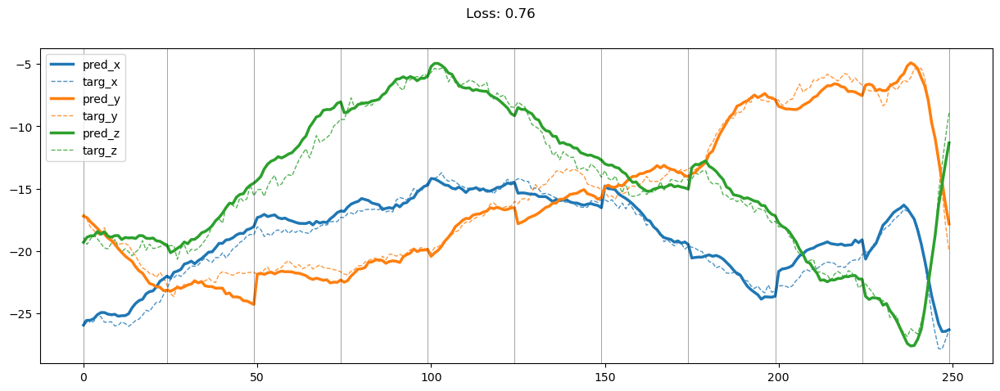

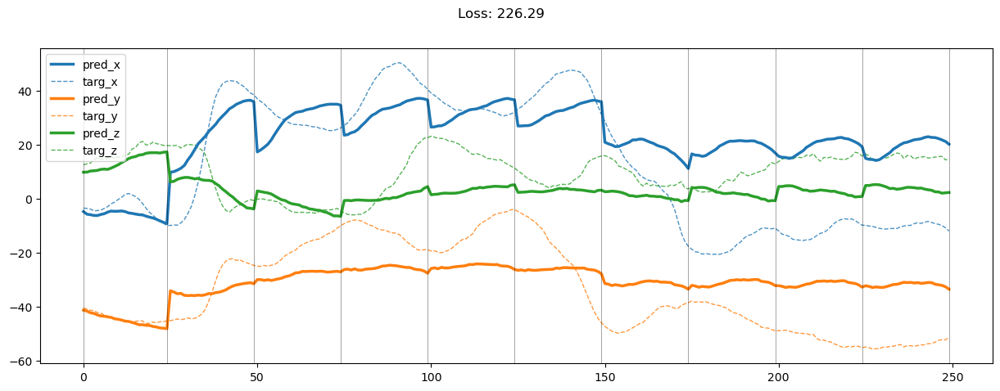

01849: train pred loss:  0.932, g loss:  1.302, d loss:  1.543
       valid pred loss:  119.870, g loss:  120.244, d loss:  1.539


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01850: train pred loss:  0.903, g loss:  1.278, d loss:  1.537
       valid pred loss:  124.499, g loss:  124.879, d loss:  1.533


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01851: train pred loss:  0.890, g loss:  1.272, d loss:  1.530
       valid pred loss:  123.076, g loss:  123.461, d loss:  1.526


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01852: train pred loss:  0.934, g loss:  1.321, d loss:  1.524
       valid pred loss:  121.241, g loss:  121.631, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.47it/s]


01853: train pred loss:  0.909, g loss:  1.302, d loss:  1.517
       valid pred loss:  119.913, g loss:  120.309, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01854: train pred loss:  0.916, g loss:  1.314, d loss:  1.511
       valid pred loss:  120.072, g loss:  120.474, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01855: train pred loss:  0.933, g loss:  1.338, d loss:  1.505
       valid pred loss:  120.425, g loss:  120.833, d loss:  1.502


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01856: train pred loss:  0.937, g loss:  1.347, d loss:  1.499
       valid pred loss:  119.124, g loss:  119.538, d loss:  1.496


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01857: train pred loss:  0.928, g loss:  1.344, d loss:  1.494
       valid pred loss:  121.606, g loss:  122.026, d loss:  1.490


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01858: train pred loss:  0.902, g loss:  1.325, d loss:  1.488
       valid pred loss:  121.238, g loss:  121.664, d loss:  1.485


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


01859: train pred loss:  0.879, g loss:  1.307, d loss:  1.483
       valid pred loss:  120.599, g loss:  121.032, d loss:  1.479


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.08it/s]


01860: train pred loss:  0.914, g loss:  1.349, d loss:  1.478
       valid pred loss:  117.665, g loss:  118.102, d loss:  1.475


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01861: train pred loss:  0.887, g loss:  1.328, d loss:  1.472
       valid pred loss:  119.382, g loss:  119.826, d loss:  1.470


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01862: train pred loss:  0.884, g loss:  1.330, d loss:  1.468
       valid pred loss:  120.294, g loss:  120.743, d loss:  1.466


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01863: train pred loss:  0.866, g loss:  1.318, d loss:  1.463
       valid pred loss:  120.204, g loss:  120.659, d loss:  1.462


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.66it/s]


01864: train pred loss:  0.858, g loss:  1.316, d loss:  1.459
       valid pred loss:  119.152, g loss:  119.613, d loss:  1.458


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01865: train pred loss:  0.873, g loss:  1.336, d loss:  1.455
       valid pred loss:  118.345, g loss:  118.812, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01866: train pred loss:  0.878, g loss:  1.348, d loss:  1.451
       valid pred loss:  118.841, g loss:  119.313, d loss:  1.450


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.62it/s]


01867: train pred loss:  0.887, g loss:  1.362, d loss:  1.448
       valid pred loss:  122.457, g loss:  122.934, d loss:  1.447


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01868: train pred loss:  0.909, g loss:  1.389, d loss:  1.444
       valid pred loss:  123.572, g loss:  124.054, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01869: train pred loss:  0.876, g loss:  1.361, d loss:  1.441
       valid pred loss:  121.828, g loss:  122.315, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01870: train pred loss:  0.870, g loss:  1.360, d loss:  1.438
       valid pred loss:  119.871, g loss:  120.362, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01871: train pred loss:  0.872, g loss:  1.366, d loss:  1.436
       valid pred loss:  121.510, g loss:  122.007, d loss:  1.435


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01872: train pred loss:  0.857, g loss:  1.355, d loss:  1.434
       valid pred loss:  122.843, g loss:  123.343, d loss:  1.434


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01873: train pred loss:  0.870, g loss:  1.372, d loss:  1.432
       valid pred loss:  122.820, g loss:  123.324, d loss:  1.431


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01874: train pred loss:  0.865, g loss:  1.371, d loss:  1.429
       valid pred loss:  121.084, g loss:  121.592, d loss:  1.430


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01875: train pred loss:  0.879, g loss:  1.388, d loss:  1.428
       valid pred loss:  122.297, g loss:  122.808, d loss:  1.427


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.74it/s]


01876: train pred loss:  0.907, g loss:  1.419, d loss:  1.426
       valid pred loss:  123.894, g loss:  124.408, d loss:  1.426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01877: train pred loss:  0.882, g loss:  1.397, d loss:  1.425
       valid pred loss:  123.460, g loss:  123.976, d loss:  1.425


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.57it/s]


01878: train pred loss:  0.899, g loss:  1.416, d loss:  1.424
       valid pred loss:  122.280, g loss:  122.798, d loss:  1.424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.65it/s]


01879: train pred loss:  0.896, g loss:  1.415, d loss:  1.423
       valid pred loss:  124.324, g loss:  124.843, d loss:  1.423


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01880: train pred loss:  0.901, g loss:  1.421, d loss:  1.422
       valid pred loss:  121.418, g loss:  121.938, d loss:  1.422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01881: train pred loss:  0.909, g loss:  1.430, d loss:  1.422
       valid pred loss:  121.542, g loss:  122.064, d loss:  1.422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.60it/s]


01882: train pred loss:  0.905, g loss:  1.427, d loss:  1.422
       valid pred loss:  122.208, g loss:  122.731, d loss:  1.421


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01883: train pred loss:  0.920, g loss:  1.441, d loss:  1.421
       valid pred loss:  124.343, g loss:  124.864, d loss:  1.421


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.67it/s]


01884: train pred loss:  0.895, g loss:  1.416, d loss:  1.422
       valid pred loss:  122.683, g loss:  123.204, d loss:  1.422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01885: train pred loss:  0.904, g loss:  1.424, d loss:  1.422
       valid pred loss:  121.019, g loss:  121.538, d loss:  1.424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.72it/s]


01886: train pred loss:  0.925, g loss:  1.443, d loss:  1.423
       valid pred loss:  120.747, g loss:  121.265, d loss:  1.425


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01887: train pred loss:  0.911, g loss:  1.429, d loss:  1.423
       valid pred loss:  120.490, g loss:  121.006, d loss:  1.424


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01888: train pred loss:  0.917, g loss:  1.433, d loss:  1.424
       valid pred loss:  122.710, g loss:  123.224, d loss:  1.426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01889: train pred loss:  0.881, g loss:  1.393, d loss:  1.426
       valid pred loss:  124.502, g loss:  125.014, d loss:  1.426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.80it/s]


01890: train pred loss:  0.897, g loss:  1.406, d loss:  1.428
       valid pred loss:  124.169, g loss:  124.677, d loss:  1.429


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.70it/s]


01891: train pred loss:  0.885, g loss:  1.391, d loss:  1.429
       valid pred loss:  122.885, g loss:  123.389, d loss:  1.431


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01892: train pred loss:  0.889, g loss:  1.391, d loss:  1.431
       valid pred loss:  122.625, g loss:  123.125, d loss:  1.433


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01893: train pred loss:  0.877, g loss:  1.375, d loss:  1.434
       valid pred loss:  123.756, g loss:  124.251, d loss:  1.436


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01894: train pred loss:  0.848, g loss:  1.341, d loss:  1.436
       valid pred loss:  122.758, g loss:  123.249, d loss:  1.438


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01895: train pred loss:  0.872, g loss:  1.361, d loss:  1.439
       valid pred loss:  121.971, g loss:  122.457, d loss:  1.441


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01896: train pred loss:  0.870, g loss:  1.353, d loss:  1.442
       valid pred loss:  120.789, g loss:  121.270, d loss:  1.444


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01897: train pred loss:  0.860, g loss:  1.338, d loss:  1.445
       valid pred loss:  120.046, g loss:  120.520, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.49it/s]


01898: train pred loss:  0.860, g loss:  1.332, d loss:  1.449
       valid pred loss:  121.870, g loss:  122.339, d loss:  1.452


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


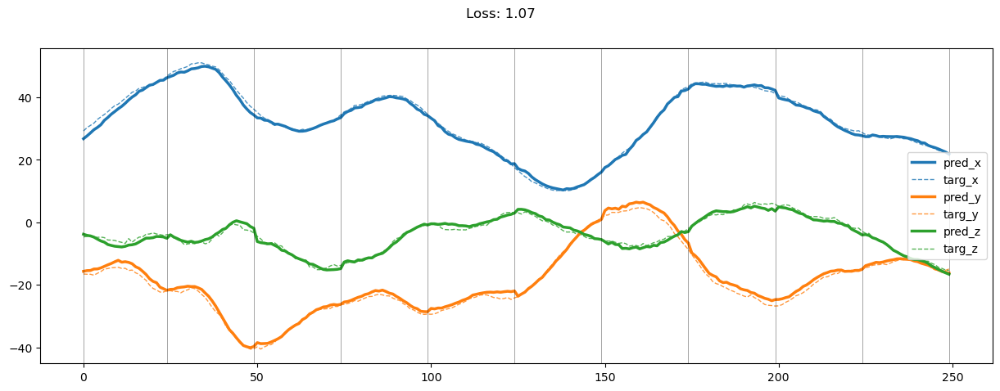

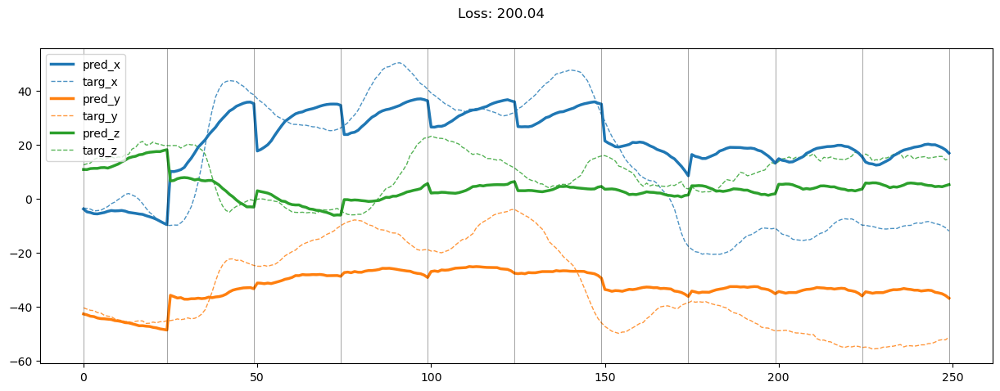

01899: train pred loss:  0.883, g loss:  1.350, d loss:  1.452
       valid pred loss:  122.398, g loss:  122.861, d loss:  1.455


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01900: train pred loss:  0.874, g loss:  1.335, d loss:  1.457
       valid pred loss:  124.111, g loss:  124.569, d loss:  1.459


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01901: train pred loss:  0.867, g loss:  1.322, d loss:  1.461
       valid pred loss:  121.940, g loss:  122.392, d loss:  1.463


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01902: train pred loss:  0.860, g loss:  1.309, d loss:  1.466
       valid pred loss:  122.566, g loss:  123.011, d loss:  1.469


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.71it/s]


01903: train pred loss:  0.873, g loss:  1.316, d loss:  1.470
       valid pred loss:  125.478, g loss:  125.917, d loss:  1.474


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01904: train pred loss:  0.875, g loss:  1.311, d loss:  1.475
       valid pred loss:  123.440, g loss:  123.873, d loss:  1.478


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01905: train pred loss:  0.889, g loss:  1.320, d loss:  1.481
       valid pred loss:  121.821, g loss:  122.249, d loss:  1.484


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.63it/s]


01906: train pred loss:  0.859, g loss:  1.283, d loss:  1.486
       valid pred loss:  123.136, g loss:  123.557, d loss:  1.491


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.46it/s]


01907: train pred loss:  0.877, g loss:  1.295, d loss:  1.492
       valid pred loss:  127.035, g loss:  127.450, d loss:  1.495


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01908: train pred loss:  0.878, g loss:  1.290, d loss:  1.497
       valid pred loss:  126.479, g loss:  126.888, d loss:  1.501


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01909: train pred loss:  0.910, g loss:  1.316, d loss:  1.503
       valid pred loss:  125.549, g loss:  125.952, d loss:  1.507


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01910: train pred loss:  0.859, g loss:  1.259, d loss:  1.509
       valid pred loss:  124.099, g loss:  124.496, d loss:  1.513


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01911: train pred loss:  0.877, g loss:  1.271, d loss:  1.515
       valid pred loss:  123.384, g loss:  123.776, d loss:  1.519


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01912: train pred loss:  0.890, g loss:  1.278, d loss:  1.522
       valid pred loss:  124.347, g loss:  124.733, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01913: train pred loss:  0.876, g loss:  1.260, d loss:  1.527
       valid pred loss:  125.284, g loss:  125.664, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01914: train pred loss:  0.838, g loss:  1.216, d loss:  1.534
       valid pred loss:  122.395, g loss:  122.770, d loss:  1.537


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01915: train pred loss:  0.864, g loss:  1.237, d loss:  1.540
       valid pred loss:  123.504, g loss:  123.874, d loss:  1.543


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01916: train pred loss:  0.881, g loss:  1.248, d loss:  1.546
       valid pred loss:  123.761, g loss:  124.125, d loss:  1.550


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01917: train pred loss:  0.857, g loss:  1.220, d loss:  1.552
       valid pred loss:  121.816, g loss:  122.177, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01918: train pred loss:  0.885, g loss:  1.243, d loss:  1.558
       valid pred loss:  122.621, g loss:  122.976, d loss:  1.564


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01919: train pred loss:  0.853, g loss:  1.207, d loss:  1.565
       valid pred loss:  123.883, g loss:  124.234, d loss:  1.569


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01920: train pred loss:  0.842, g loss:  1.192, d loss:  1.571
       valid pred loss:  122.170, g loss:  122.516, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01921: train pred loss:  0.861, g loss:  1.206, d loss:  1.577
       valid pred loss:  124.516, g loss:  124.859, d loss:  1.581


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01922: train pred loss:  0.842, g loss:  1.183, d loss:  1.583
       valid pred loss:  124.165, g loss:  124.503, d loss:  1.587


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.42it/s]


01923: train pred loss:  0.881, g loss:  1.218, d loss:  1.588
       valid pred loss:  123.328, g loss:  123.663, d loss:  1.591


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01924: train pred loss:  0.878, g loss:  1.212, d loss:  1.594
       valid pred loss:  122.852, g loss:  123.184, d loss:  1.596


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.75it/s]


01925: train pred loss:  0.851, g loss:  1.181, d loss:  1.600
       valid pred loss:  123.081, g loss:  123.409, d loss:  1.602


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01926: train pred loss:  0.860, g loss:  1.187, d loss:  1.604
       valid pred loss:  124.095, g loss:  124.420, d loss:  1.608


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01927: train pred loss:  0.864, g loss:  1.188, d loss:  1.609
       valid pred loss:  125.345, g loss:  125.668, d loss:  1.611


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.82it/s]


01928: train pred loss:  0.866, g loss:  1.187, d loss:  1.614
       valid pred loss:  123.939, g loss:  124.258, d loss:  1.617


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01929: train pred loss:  0.869, g loss:  1.188, d loss:  1.618
       valid pred loss:  122.206, g loss:  122.524, d loss:  1.620


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01930: train pred loss:  0.862, g loss:  1.178, d loss:  1.622
       valid pred loss:  121.095, g loss:  121.409, d loss:  1.626


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01931: train pred loss:  0.851, g loss:  1.165, d loss:  1.626
       valid pred loss:  123.128, g loss:  123.440, d loss:  1.629


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01932: train pred loss:  0.880, g loss:  1.192, d loss:  1.629
       valid pred loss:  123.086, g loss:  123.397, d loss:  1.631


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01933: train pred loss:  0.876, g loss:  1.186, d loss:  1.632
       valid pred loss:  124.276, g loss:  124.585, d loss:  1.636


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.61it/s]


01934: train pred loss:  0.883, g loss:  1.191, d loss:  1.635
       valid pred loss:  120.590, g loss:  120.897, d loss:  1.639


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01935: train pred loss:  0.858, g loss:  1.165, d loss:  1.638
       valid pred loss:  121.750, g loss:  122.056, d loss:  1.640


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01936: train pred loss:  0.864, g loss:  1.170, d loss:  1.640
       valid pred loss:  120.850, g loss:  121.155, d loss:  1.642


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01937: train pred loss:  0.860, g loss:  1.165, d loss:  1.642
       valid pred loss:  122.999, g loss:  123.304, d loss:  1.643


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01938: train pred loss:  0.862, g loss:  1.166, d loss:  1.643
       valid pred loss:  124.112, g loss:  124.415, d loss:  1.645


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01939: train pred loss:  0.872, g loss:  1.175, d loss:  1.644
       valid pred loss:  123.522, g loss:  123.825, d loss:  1.645


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01940: train pred loss:  0.833, g loss:  1.136, d loss:  1.644
       valid pred loss:  123.246, g loss:  123.549, d loss:  1.644


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01941: train pred loss:  0.855, g loss:  1.158, d loss:  1.645
       valid pred loss:  123.038, g loss:  123.341, d loss:  1.645


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.73it/s]


01942: train pred loss:  0.861, g loss:  1.164, d loss:  1.644
       valid pred loss:  123.361, g loss:  123.665, d loss:  1.643


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01943: train pred loss:  0.847, g loss:  1.151, d loss:  1.644
       valid pred loss:  123.574, g loss:  123.878, d loss:  1.643


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01944: train pred loss:  0.830, g loss:  1.134, d loss:  1.643
       valid pred loss:  122.604, g loss:  122.909, d loss:  1.643


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01945: train pred loss:  0.853, g loss:  1.158, d loss:  1.641
       valid pred loss:  121.059, g loss:  121.365, d loss:  1.641


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01946: train pred loss:  0.850, g loss:  1.156, d loss:  1.639
       valid pred loss:  116.718, g loss:  117.024, d loss:  1.640


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.20it/s]


01947: train pred loss:  0.883, g loss:  1.191, d loss:  1.636
       valid pred loss:  119.773, g loss:  120.081, d loss:  1.636


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01948: train pred loss:  0.852, g loss:  1.161, d loss:  1.635
       valid pred loss:  122.786, g loss:  123.096, d loss:  1.633


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


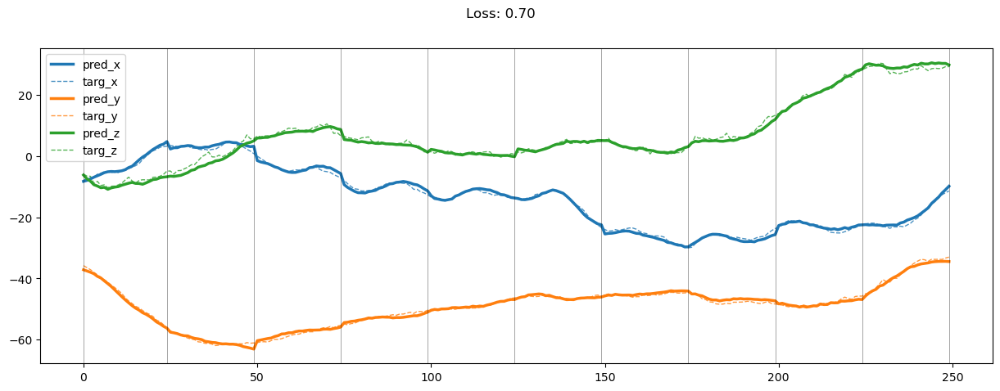

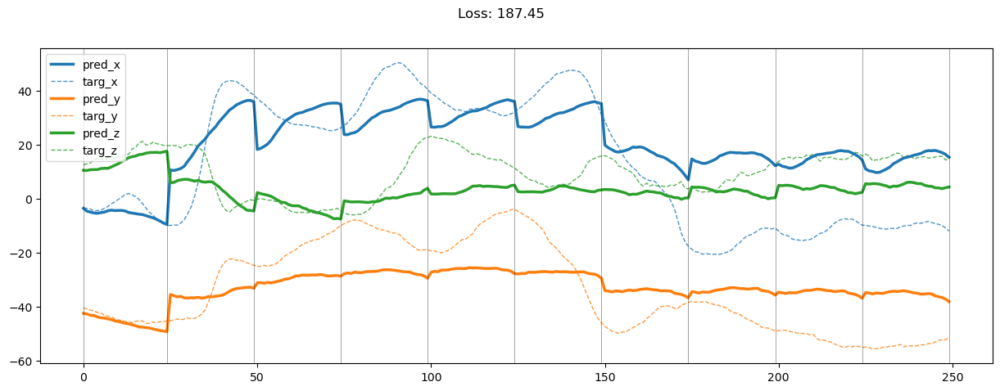

01949: train pred loss:  0.891, g loss:  1.201, d loss:  1.632
       valid pred loss:  121.356, g loss:  121.668, d loss:  1.629


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.68it/s]


01950: train pred loss:  0.841, g loss:  1.153, d loss:  1.627
       valid pred loss:  121.021, g loss:  121.335, d loss:  1.627


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01951: train pred loss:  0.856, g loss:  1.171, d loss:  1.624
       valid pred loss:  122.511, g loss:  122.827, d loss:  1.622


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01952: train pred loss:  0.815, g loss:  1.132, d loss:  1.620
       valid pred loss:  123.313, g loss:  123.632, d loss:  1.619


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01953: train pred loss:  0.841, g loss:  1.161, d loss:  1.615
       valid pred loss:  125.757, g loss:  126.079, d loss:  1.613


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01954: train pred loss:  0.818, g loss:  1.141, d loss:  1.611
       valid pred loss:  126.070, g loss:  126.395, d loss:  1.608


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.77it/s]


01955: train pred loss:  0.827, g loss:  1.153, d loss:  1.606
       valid pred loss:  127.049, g loss:  127.377, d loss:  1.603


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01956: train pred loss:  0.845, g loss:  1.174, d loss:  1.601
       valid pred loss:  124.633, g loss:  124.964, d loss:  1.598


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01957: train pred loss:  0.828, g loss:  1.161, d loss:  1.595
       valid pred loss:  125.100, g loss:  125.434, d loss:  1.594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01958: train pred loss:  0.830, g loss:  1.166, d loss:  1.590
       valid pred loss:  123.487, g loss:  123.825, d loss:  1.588


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.37it/s]


01959: train pred loss:  0.850, g loss:  1.190, d loss:  1.584
       valid pred loss:  125.498, g loss:  125.840, d loss:  1.582


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01960: train pred loss:  0.847, g loss:  1.191, d loss:  1.578
       valid pred loss:  123.661, g loss:  124.008, d loss:  1.575


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01961: train pred loss:  0.840, g loss:  1.189, d loss:  1.571
       valid pred loss:  123.787, g loss:  124.138, d loss:  1.570


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.81it/s]


01962: train pred loss:  0.853, g loss:  1.206, d loss:  1.566
       valid pred loss:  124.460, g loss:  124.816, d loss:  1.563


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01963: train pred loss:  0.847, g loss:  1.205, d loss:  1.560
       valid pred loss:  121.875, g loss:  122.235, d loss:  1.556


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01964: train pred loss:  0.851, g loss:  1.214, d loss:  1.553
       valid pred loss:  122.820, g loss:  123.185, d loss:  1.551


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01965: train pred loss:  0.846, g loss:  1.213, d loss:  1.547
       valid pred loss:  121.754, g loss:  122.123, d loss:  1.545


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01966: train pred loss:  0.851, g loss:  1.223, d loss:  1.541
       valid pred loss:  123.021, g loss:  123.397, d loss:  1.538


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01967: train pred loss:  0.821, g loss:  1.199, d loss:  1.534
       valid pred loss:  123.262, g loss:  123.643, d loss:  1.532


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01968: train pred loss:  0.809, g loss:  1.192, d loss:  1.529
       valid pred loss:  122.204, g loss:  122.590, d loss:  1.525


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01969: train pred loss:  0.834, g loss:  1.222, d loss:  1.522
       valid pred loss:  122.220, g loss:  122.611, d loss:  1.520


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.88it/s]


01970: train pred loss:  0.854, g loss:  1.248, d loss:  1.516
       valid pred loss:  124.718, g loss:  125.115, d loss:  1.514


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01971: train pred loss:  0.873, g loss:  1.272, d loss:  1.511
       valid pred loss:  123.823, g loss:  124.226, d loss:  1.508


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01972: train pred loss:  0.862, g loss:  1.267, d loss:  1.504
       valid pred loss:  121.604, g loss:  122.011, d loss:  1.504


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01973: train pred loss:  0.844, g loss:  1.254, d loss:  1.499
       valid pred loss:  122.466, g loss:  122.880, d loss:  1.497


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.48it/s]


01974: train pred loss:  0.825, g loss:  1.241, d loss:  1.493
       valid pred loss:  122.764, g loss:  123.183, d loss:  1.492


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01975: train pred loss:  0.804, g loss:  1.227, d loss:  1.488
       valid pred loss:  119.970, g loss:  120.396, d loss:  1.487


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01976: train pred loss:  0.825, g loss:  1.254, d loss:  1.482
       valid pred loss:  121.356, g loss:  121.787, d loss:  1.482


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01977: train pred loss:  0.814, g loss:  1.249, d loss:  1.478
       valid pred loss:  122.006, g loss:  122.443, d loss:  1.476


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01978: train pred loss:  0.853, g loss:  1.293, d loss:  1.473
       valid pred loss:  123.074, g loss:  123.517, d loss:  1.472


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01979: train pred loss:  0.839, g loss:  1.285, d loss:  1.468
       valid pred loss:  123.001, g loss:  123.450, d loss:  1.467


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01980: train pred loss:  0.843, g loss:  1.295, d loss:  1.464
       valid pred loss:  118.507, g loss:  118.961, d loss:  1.464


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.78it/s]


01981: train pred loss:  0.837, g loss:  1.294, d loss:  1.459
       valid pred loss:  118.340, g loss:  118.800, d loss:  1.460


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01982: train pred loss:  0.852, g loss:  1.315, d loss:  1.455
       valid pred loss:  120.978, g loss:  121.443, d loss:  1.456


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01983: train pred loss:  0.816, g loss:  1.284, d loss:  1.451
       valid pred loss:  121.872, g loss:  122.343, d loss:  1.453


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.44it/s]


01984: train pred loss:  0.845, g loss:  1.319, d loss:  1.448
       valid pred loss:  120.130, g loss:  120.606, d loss:  1.449


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01985: train pred loss:  0.820, g loss:  1.299, d loss:  1.444
       valid pred loss:  117.963, g loss:  118.444, d loss:  1.446


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01986: train pred loss:  0.830, g loss:  1.314, d loss:  1.441
       valid pred loss:  117.318, g loss:  117.805, d loss:  1.443


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.00it/s]


01987: train pred loss:  0.829, g loss:  1.318, d loss:  1.438
       valid pred loss:  118.291, g loss:  118.782, d loss:  1.439


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.87it/s]


01988: train pred loss:  0.813, g loss:  1.307, d loss:  1.436
       valid pred loss:  120.904, g loss:  121.400, d loss:  1.436


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01989: train pred loss:  0.806, g loss:  1.305, d loss:  1.433
       valid pred loss:  122.156, g loss:  122.657, d loss:  1.434


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


01990: train pred loss:  0.788, g loss:  1.291, d loss:  1.430
       valid pred loss:  124.654, g loss:  125.158, d loss:  1.432


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01991: train pred loss:  0.797, g loss:  1.303, d loss:  1.429
       valid pred loss:  123.630, g loss:  124.139, d loss:  1.430


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.86it/s]


01992: train pred loss:  0.812, g loss:  1.323, d loss:  1.427
       valid pred loss:  121.210, g loss:  121.722, d loss:  1.429


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01993: train pred loss:  0.817, g loss:  1.331, d loss:  1.425
       valid pred loss:  120.373, g loss:  120.888, d loss:  1.426


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.79it/s]


01994: train pred loss:  0.787, g loss:  1.305, d loss:  1.423
       valid pred loss:  119.897, g loss:  120.416, d loss:  1.423


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 14.91it/s]


01995: train pred loss:  0.822, g loss:  1.343, d loss:  1.421
       valid pred loss:  122.873, g loss:  123.394, d loss:  1.423


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.83it/s]


01996: train pred loss:  0.831, g loss:  1.355, d loss:  1.421
       valid pred loss:  124.813, g loss:  125.337, d loss:  1.422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.84it/s]


01997: train pred loss:  0.816, g loss:  1.342, d loss:  1.419
       valid pred loss:  123.613, g loss:  124.138, d loss:  1.423


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.85it/s]


01998: train pred loss:  0.836, g loss:  1.363, d loss:  1.419
       valid pred loss:  119.669, g loss:  120.195, d loss:  1.422


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 15.76it/s]


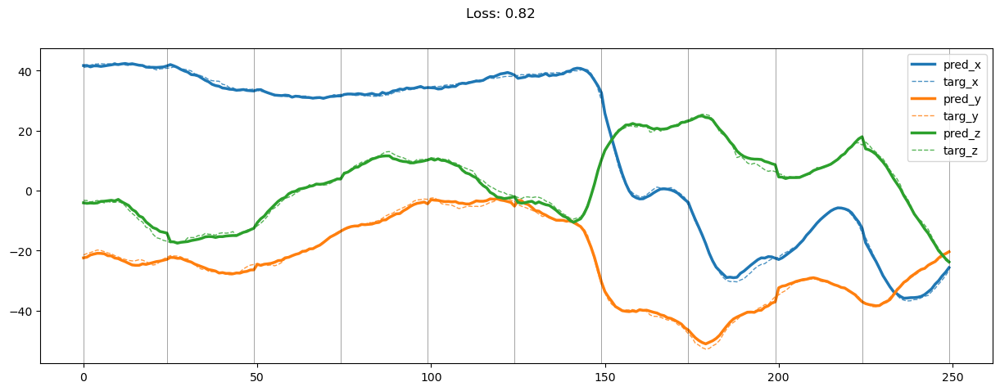

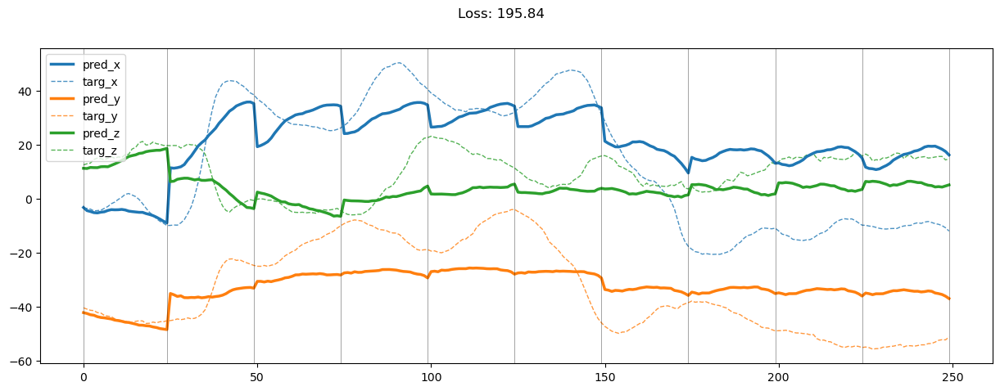

01999: train pred loss:  0.853, g loss:  1.381, d loss:  1.419
       valid pred loss:  121.668, g loss:  122.197, d loss:  1.421


In [25]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_pred_loss, train_g_loss, train_d_loss = train(train_loader, draw)
    valid_pred_loss, valid_g_loss, valid_d_loss = evalute(valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep:>5}: train pred loss: {train_pred_loss: 2.3f}, g loss: {train_g_loss: 2.3f}, d loss: {train_d_loss: 2.3f}\n' +
          f'{"":>5}  valid pred loss: {valid_pred_loss: 2.3f}, g loss: {valid_g_loss: 2.3f}, d loss: {valid_d_loss: 2.3f}')

In [ ]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [ ]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [ ]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

In [ ]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)